In [45]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import numpy as np

# Data Preparation

In [46]:
# List of tickers for the 30 companies
# custom_tickers = [
#     "AMZN", "AXP", "AMGN", "AAPL", "BA",
#     "CAT", "CSCO", "CVX", "GS", "HD",
#     "HON", "IBM", "INTC", "JNJ", "KO",
#     "JPM", "MCD", "MMM", "MRK", "MSFT",
#     "NKE", "PG", "TRV", "UNH", "CRM",
#     "VZ", "V", "WMT", "DIS", "DJI"
# ]

#PAST DJIA
custom_tickers = [
    "PG", "JNJ", "XOM", "CVX", "MRK", "PFE", "MCD", "T",
    "VZ", "HPQ", "IBM", "MSFT", "INTC", "HD", "WMT", "TRV",
    "RTX", "BA", "AA", "DD", "CAT", "MMM", "DIS", "JPM", "AXP", "GE",
    "CCEP"
    #"CRJ", "H", "BOA"
]

study_periods = [
    ('2001-01-02', '2004-01-06'),
    ('2004-01-06', '2007-01-02'),
    ('2007-01-02', '2010-01-05'),
    ('2010-01-05', '2013-05-14')
]

def calculate_weekly_returns(df):
    weekly_df = df.resample('W').last()
    weekly_df['close'].fillna(method='ffill', inplace=True)
    weekly_df['returns'] = weekly_df['close'].pct_change().fillna(0)
    return weekly_df

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def data_prep(custom_tickers, study_periods):
    # Fetch data for each ticker
    stock_data = {}
    for ticker in custom_tickers:
        try:
            data = get_data(ticker)
            stock_data[ticker] = data
        except AssertionError as e:
            print(f"No data found for {ticker}: {e}")
    weekly_returns_dict = {}

    for ticker, data in stock_data.items():
        data.index = pd.to_datetime(data.index)

        for period_num, (start_date, end_date) in enumerate(study_periods, start=1):
            period_data = data.loc[start_date:end_date]
            period_returns = calculate_weekly_returns(period_data)
            weekly_returns_dict.setdefault(ticker, {})[f'period_{period_num}'] = period_returns
    period_dfs = {}
    # Iterate over the periods
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        # Initialize an empty dictionary to store data for the current period
        period_data = {}

        # Iterate over each ticker's data
        for ticker, data in weekly_returns_dict.items():
            # Drop NaN values from the 'close' column for the current period
            close_prices = data[period][['returns']].dropna()
            period_data[ticker] = close_prices

        # Concatenate the data for all tickers into a single DataFrame for the current period
        period_df = pd.concat(period_data, axis=1)
        period_dfs[period] = period_df.dropna(axis=1)
    correlation_matrices = {}
    for period, period_df in period_dfs.items():
        # Calculate correlation matrix for the current period and store it in the dictionary
        correlation_matrices[period] = period_df.corr()
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)
    return period_dfs, correlation_matrices, distance_matrices

In [47]:
period_dfs, correlation_matrices, distance_matrices = data_prep(custom_tickers, study_periods)

/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68808/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68808/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68808/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68808/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Us

### Random Selection

In [48]:
def calculate_metrics_for_random_selection(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 100
 
    for period, returns_data in period_dfs.items():
        returns_data = returns_data.droplevel(1, axis=1)
        results_by_stocks = {}
        stocks_length_list = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlation = []
            selected_stocks_list = {}
            
            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks
               
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                
                mean_std = (portfolio_return_stocks).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            #stocks_length_list[period] = selected_stocks_list
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]
            
            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

num_stocks_list = [2, 4, 8]
result_df_random = calculate_metrics_for_random_selection(period_dfs, num_stocks_list)
result_df_random

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.013497,0.037901,-0.026090,0.381545,"[GE, JNJ, VZ, CCEP, GE, CVX, MMM, HPQ, JPM, DI..."
period_1 (4 stocks),0.025765,0.033263,0.085006,0.335182,"[CAT, TRV, AA, T, CCEP, XOM, DIS, VZ, MCD, WMT..."
period_1 (8 stocks),0.040470,0.030831,0.137837,0.467103,"[VZ, RTX, HD, PG, IBM, MMM, CCEP, JNJ, PG, DIS..."
period_2 (2 stocks),0.256075,0.021808,1.230008,0.075087,"[DD, JNJ, TRV, GE, MSFT, DD, HD, JNJ, GE, CCEP..."
period_2 (4 stocks),0.249658,0.018231,1.386892,0.146390,"[CCEP, XOM, JPM, DIS, MMM, DIS, CCEP, IBM, WMT..."
period_2 (8 stocks),0.248808,0.016366,1.536868,0.209223,"[MSFT, CCEP, CVX, JNJ, VZ, TRV, HD, CAT, AXP, ..."
period_3 (2 stocks),-0.010991,0.042021,-0.000938,0.557601,"[INTC, AXP, RTX, MCD, T, MCD, TRV, VZ, HPQ, JN..."
period_3 (4 stocks),0.017408,0.039540,0.056579,0.543411,"[IBM, WMT, DD, DIS, MCD, VZ, RTX, HPQ, TRV, MM..."
period_3 (8 stocks),0.005828,0.037640,0.019008,0.463227,"[XOM, JNJ, AXP, CCEP, MRK, T, CVX, IBM, PG, JP..."
period_4 (2 stocks),0.381829,0.027109,1.590559,0.470053,"[PG, AXP, JNJ, MSFT, HPQ, DD, WMT, T, XOM, DD,..."


### Hierarchical Clustering

In [49]:
import numpy as np
from scipy.cluster.hierarchy import average, fcluster, linkage
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Function to perform hierarchical clustering and print stocks in each cluster
def hierarchical_clustering(distance_matrix, labels, period):
#    linkage_matrix = average(distance_matrix)
    linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
    labels = [label[0] for label in labels]

    # Set the figure size to be larger
    plt.figure(figsize=(12, 8))  # Adjust the size as needed

    # Plot the dendrogram
    dendrogram(average(distance_matrix), labels=labels, orientation='top')

    # Customize plot title and axis labels
    plt.title(f'Hierarchical Clustering Dendrogram - {period}')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')

    # Create dictionary to store stocks in each cluster for 2, 4, and 8 clusters
    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}
    
    # Perform clustering to get cluster labels for 2, 4, and 8 clusters
    for num_clusters in [2, 4, 8]:
        cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
        
        # Assign stocks to clusters
        for stock, cluster_label in zip(labels, cluster_labels):
            if cluster_label not in cluster_stocks[num_clusters]:
                cluster_stocks[num_clusters][cluster_label] = [stock]
            else:
                cluster_stocks[num_clusters][cluster_label].append(stock)

    # Show the plot
    plt.show()
    
    return cluster_stocks

def HCT(distance_matrices):
    # Create a dictionary to store cluster stocks for each period
    all_cluster_stocks_HCT = {}
    # Perform hierarchical clustering and plot dendrogram for each study period
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks_HCT[period] = hierarchical_clustering(distance_matrix.values, distance_matrix.index, period)
    return all_cluster_stocks_HCT

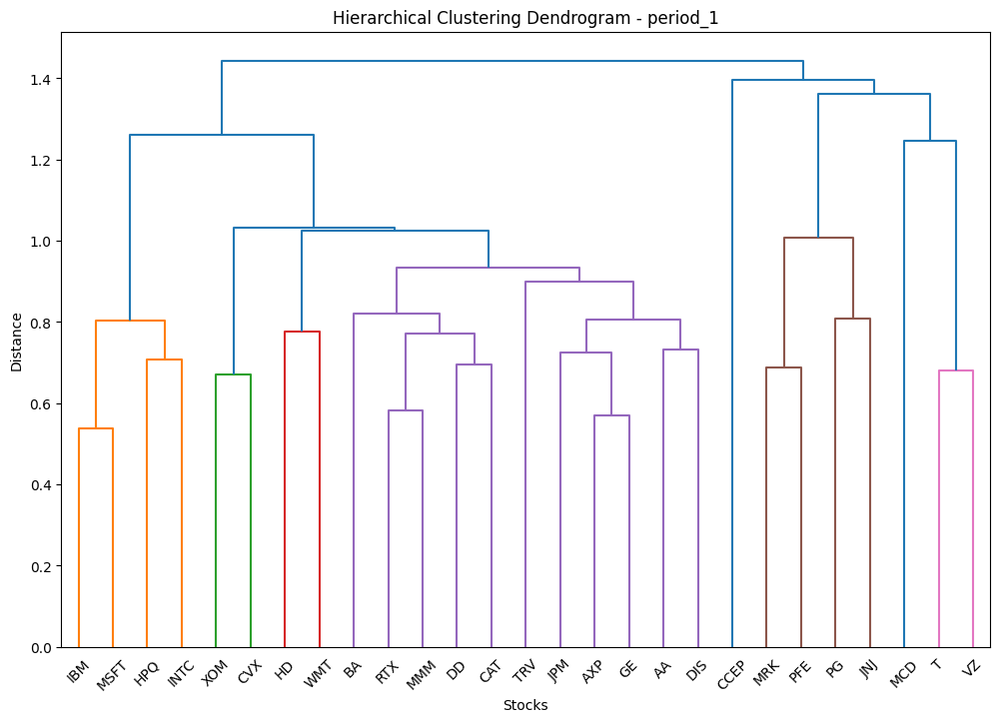

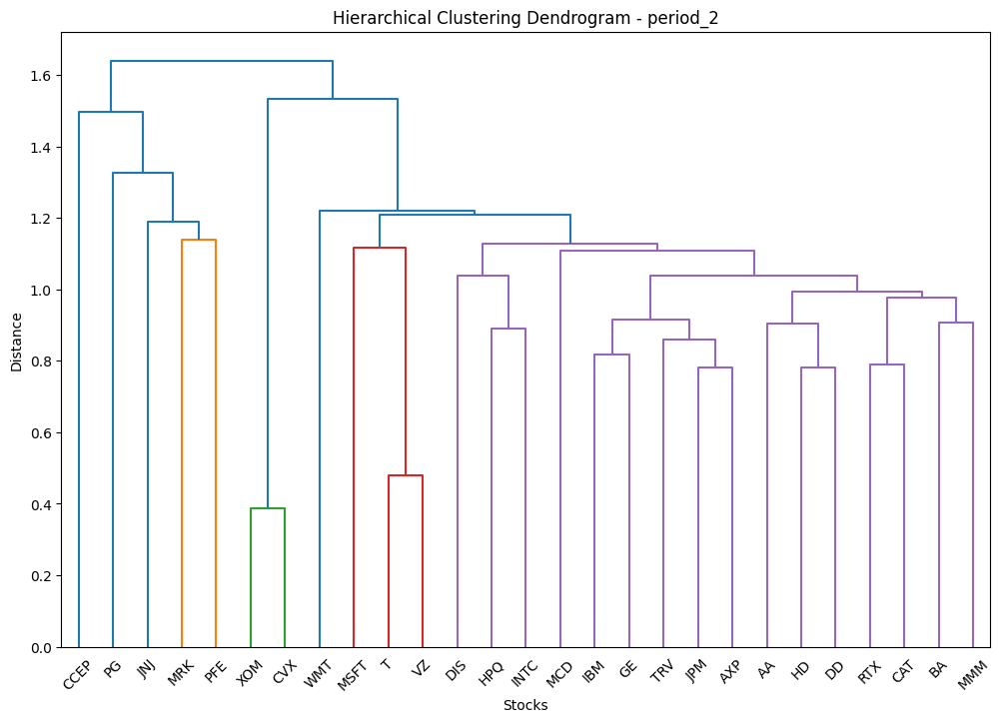

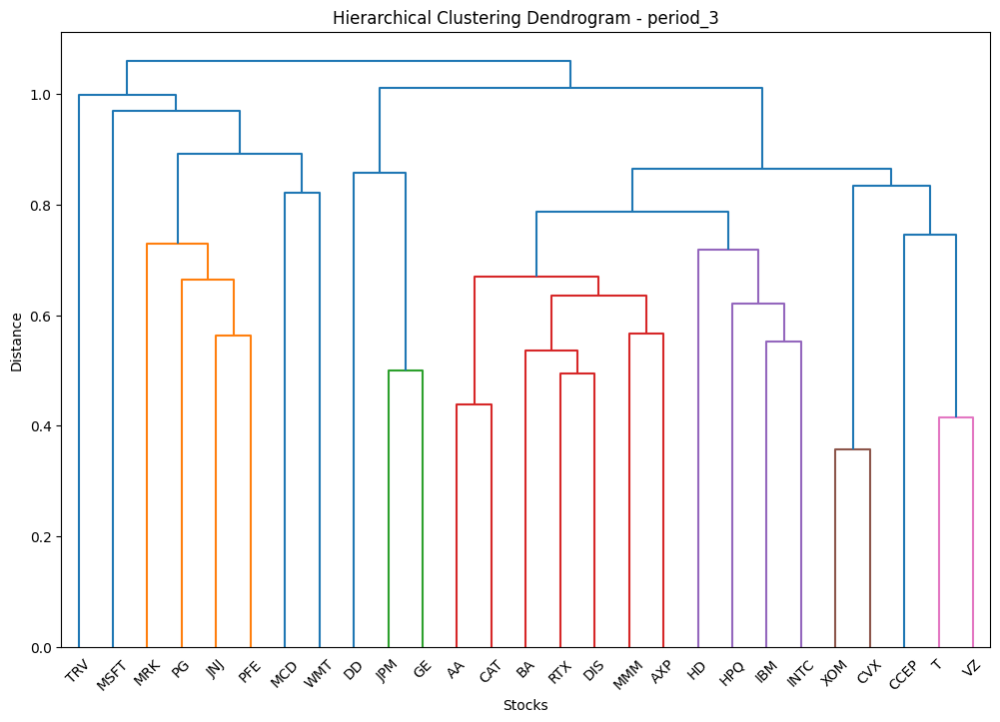

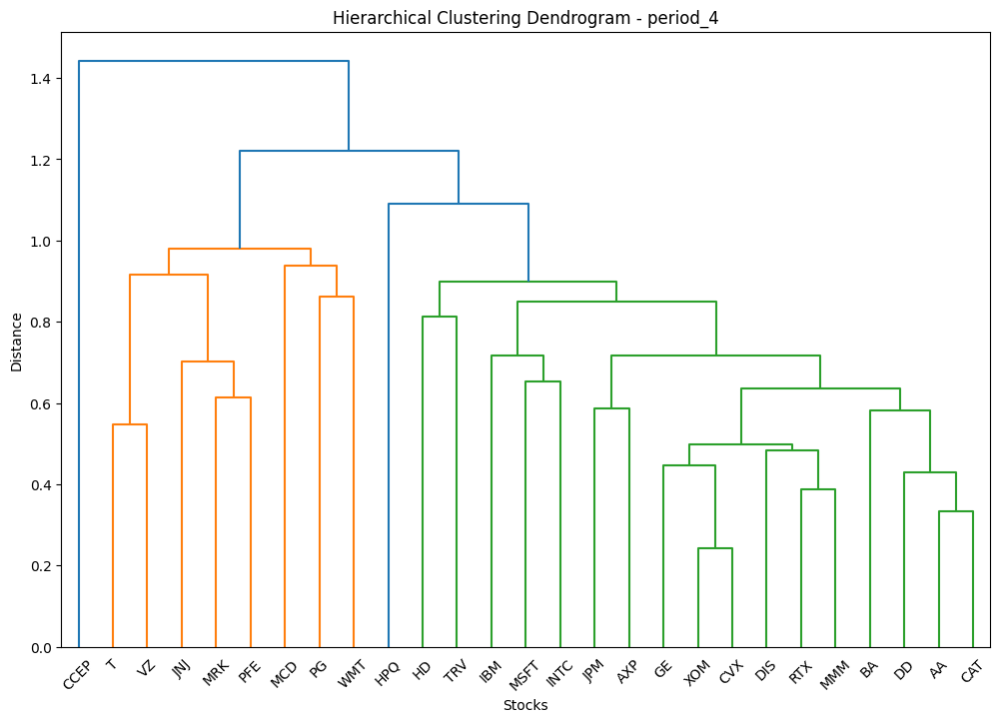

In [50]:
all_cluster_stocks_HCT = HCT(correlation_matrices)

In [51]:
import pandas as pd
import numpy as np

def calculate_metrics_for_all_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100

    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                #print(returns_data[selected_stocks].std())
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(mean_correlation)
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [52]:
result_df_HCT = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT, period_dfs)
result_df_HCT

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.034093,0.035483,-0.070079,0.261804,"[MCD, MSFT, PFE, AXP, T, CVX, T, BA, CCEP, INT..."
period_1 (4 stocks),-0.024637,0.031052,-0.064279,0.316937,"[PG, HD, T, HPQ, PG, TRV, T, MSFT, MRK, RTX, T..."
period_1 (8 stocks),0.022082,0.027577,0.084594,0.288804,"[JNJ, WMT, MCD, VZ, MSFT, DIS, BA, CCEP, MRK, ..."
period_2 (2 stocks),0.241212,0.020859,1.231965,0.102262,"[XOM, AA, XOM, IBM, PFE, HD, CCEP, AXP, CVX, M..."
period_2 (4 stocks),0.290408,0.016932,1.777395,0.155323,"[PFE, XOM, CAT, VZ, PG, CVX, DIS, IBM, JNJ, XO..."
period_2 (8 stocks),0.258162,0.013590,1.920712,0.144255,"[PG, MRK, XOM, WMT, VZ, IBM, MMM, CCEP, PG, PF..."
period_3 (2 stocks),-0.020779,0.041530,-0.019037,0.598592,"[MCD, RTX, VZ, BA, VZ, GE, WMT, DD, PFE, HD, V..."
period_3 (4 stocks),-0.024433,0.040595,-0.068191,0.466421,"[MCD, VZ, CAT, DD, MRK, T, MMM, GE, PFE, VZ, D..."
period_3 (8 stocks),0.010291,0.035469,0.029754,0.458054,"[JNJ, CVX, MSFT, T, HPQ, TRV, MMM, DD, JNJ, CV..."
period_4 (2 stocks),0.449378,0.024096,1.966578,0.504480,"[T, MSFT, MRK, TRV, JNJ, MMM, WMT, MSFT, T, DI..."


### K-Means

In [53]:
from sklearn.cluster import KMeans
import numpy as np

In [54]:
periods = ['period_1','period_2','period_3','period_4']

In [55]:
# Function to perform K-means clustering
def kmeans_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict(data)
    centroid_vectors = kmeans.cluster_centers_
    return cluster_labels, centroid_vectors

In [56]:
def generate_clusters_and_centroids(periods, distance_matrices, tickers):
    stocks = tickers
    all_cluster_stocks_kmeans = {}
    all_centroid_vectors = {}

    for period in periods:
        X = distance_matrices[period]
        
        clusters_for_period = {}
        centroid_vectors_for_period = {}
        
        for size in ['2', '4', '8']:  # Using strings instead of integers
            cluster_labels, centroid_vectors = kmeans_clustering(X, num_clusters=int(size))  # Convert size to integer
            clusters = {}
            centroid_dict = {}
            
            for cluster_num in range(int(size)):  # Convert size to integer
                clusters[str(cluster_num + 1)] = []  # Convert cluster_num to string
                centroid_dict[str(cluster_num + 1)] = [centroid_vectors[cluster_num]]  # Store centroid vector as a list
                
            for idx, label in enumerate(cluster_labels):
                clusters[str(label + 1)].append(stocks[idx])  # Convert label to string
            
            clusters_for_period[size] = clusters
            centroid_vectors_for_period[size] = centroid_dict
        
        all_cluster_stocks_kmeans[period] = clusters_for_period
        all_centroid_vectors[period] = centroid_vectors_for_period

    return all_cluster_stocks_kmeans, all_centroid_vectors

all_cluster_stocks_kmeans, centroid_vectors = generate_clusters_and_centroids(periods, distance_matrices, custom_tickers)

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: Fut

In [57]:
result_df_kmeans_rand = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.021376,0.035516,0.086273,0.288607,"[CCEP, RTX, CCEP, INTC, PFE, CAT, PG, CAT, T, ..."
period_1 (4 stocks),-0.043433,0.031813,-0.125895,0.204607,"[HPQ, GE, VZ, MRK, HPQ, AXP, MCD, JNJ, HPQ, BA..."
period_1 (8 stocks),0.025205,0.028029,0.093746,0.284119,"[WMT, PG, AXP, MSFT, T, MCD, RTX, CCEP, DD, MR..."
period_2 (2 stocks),0.247939,0.021024,1.268472,0.072147,"[CVX, MSFT, CCEP, TRV, CVX, MMM, JNJ, MMM, PFE..."
period_2 (4 stocks),0.336392,0.016989,2.027537,0.163497,"[CVX, WMT, INTC, CCEP, XOM, GE, IBM, CCEP, XOM..."
period_2 (8 stocks),0.267536,0.013848,1.951131,0.149294,"[JNJ, HD, VZ, XOM, MSFT, CCEP, AXP, PG, PFE, M..."
period_3 (2 stocks),-0.019726,0.042542,-0.012574,0.547880,"[JNJ, AA, JNJ, CAT, JNJ, HPQ, JNJ, AA, JNJ, BA..."
period_3 (4 stocks),0.001416,0.038686,0.017531,0.428821,"[MSFT, CVX, TRV, MMM, T, AA, JNJ, AXP, T, CVX,..."
period_3 (8 stocks),0.015768,0.034708,0.044352,0.470895,"[JPM, VZ, CCEP, CAT, JNJ, MCD, CVX, MSFT, AXP,..."
period_4 (2 stocks),0.465326,0.024916,1.961782,0.280205,"[IBM, CCEP, RTX, PG, AA, PFE, IBM, MCD, DD, T,..."


In [58]:
def calculate_metrics_for_kmeans(all_cluster_stocks, period_dfs, centroid_vectors,distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        stocks_by_cluster = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[period][str(num_clusters)]
                distance_matrix = distance_matrices[period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : [selected_stocks]}

        results_by_period[period] = results_by_cluster
        stocks_by_period[period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [59]:
result_df_kmeans, stocks_by_period_kmeans = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)

In [60]:
result_df_kmeans

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.157812,0.035177,-0.448622,0.444373,"[WMT, GE]"
period_1 (4 stocks),-0.252260,0.034370,-0.733946,0.370497,"[JPM, GE, MCD, MRK]"
period_1 (8 stocks),-0.117054,0.028426,-0.411791,0.318700,"[WMT, MRK, GE, DIS, T, MCD, AA, CCEP]"
period_2 (2 stocks),0.007040,0.023190,0.030360,0.185491,"[PFE, TRV]"
period_2 (4 stocks),0.292259,0.018649,1.567148,0.265942,"[XOM, RTX, TRV, PFE]"
period_2 (8 stocks),0.369706,0.014394,2.568417,0.182805,"[PFE, MCD, VZ, XOM, BA, CCEP, TRV, PG]"
period_3 (2 stocks),-0.088398,0.042592,-0.207543,0.564727,"[PFE, CCEP]"
period_3 (4 stocks),-0.108593,0.047948,-0.226481,0.573208,"[CCEP, AA, PFE, DIS]"
period_3 (8 stocks),0.064060,0.036344,0.176260,0.496539,"[AXP, VZ, CCEP, INTC, PFE, MCD, CVX, MSFT]"
period_4 (2 stocks),0.991680,0.025792,3.844910,0.547225,"[DIS, TRV]"


### Minimum Spanning Trees

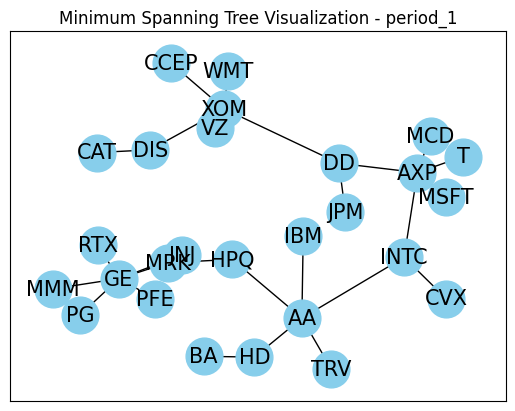

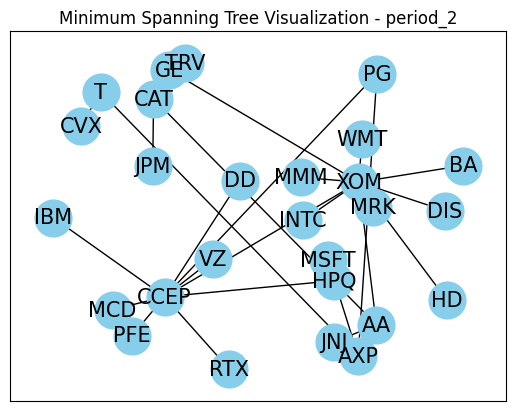

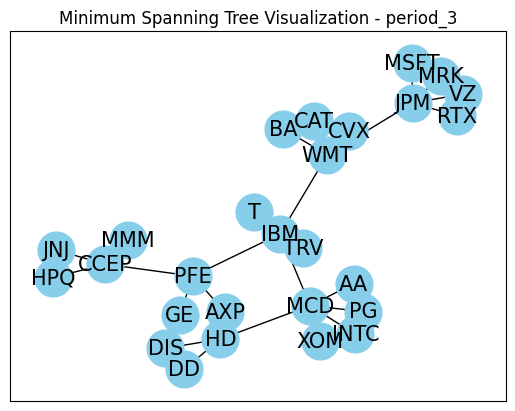

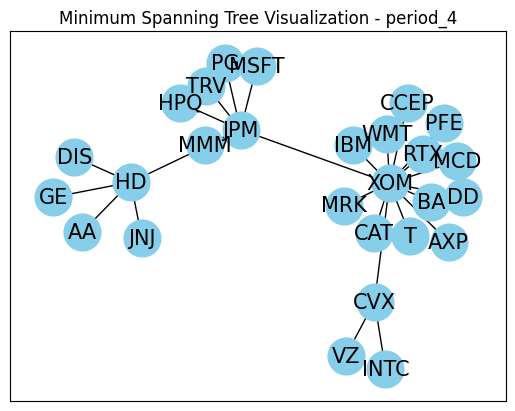

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


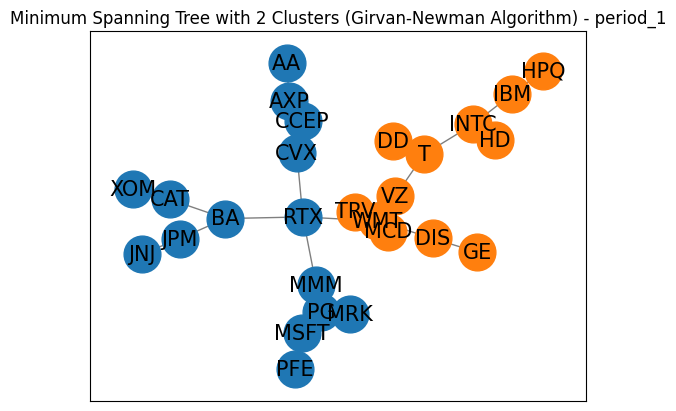

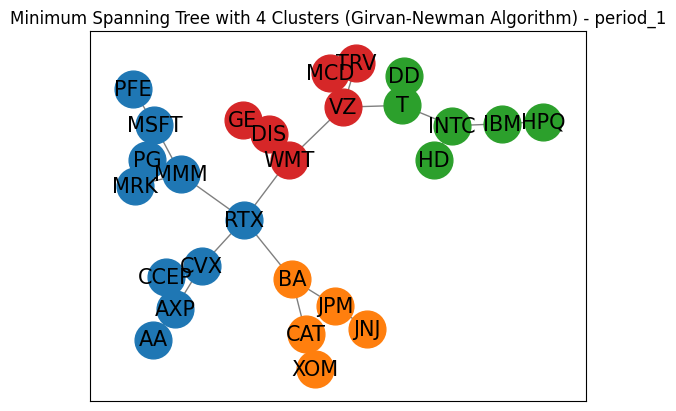

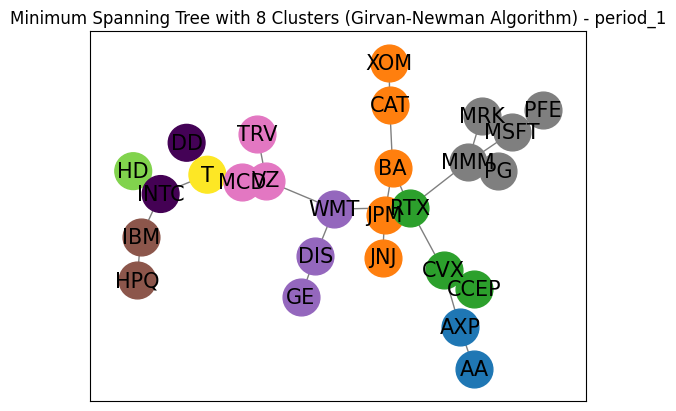

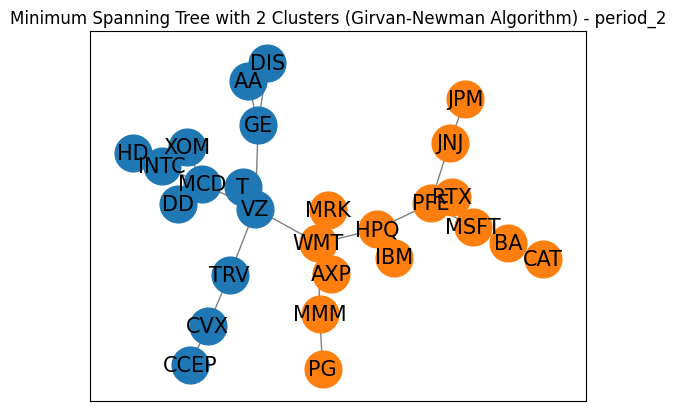

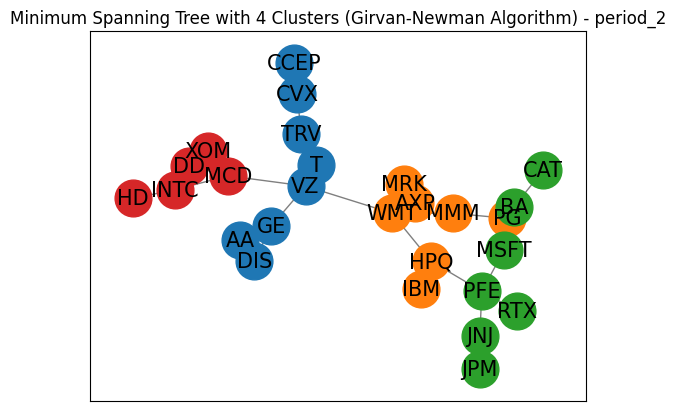

...

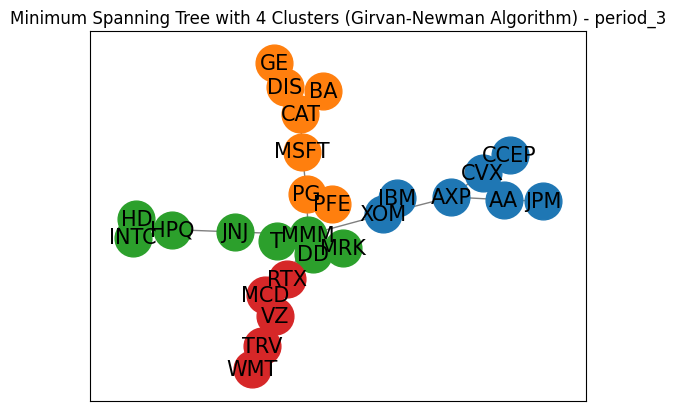

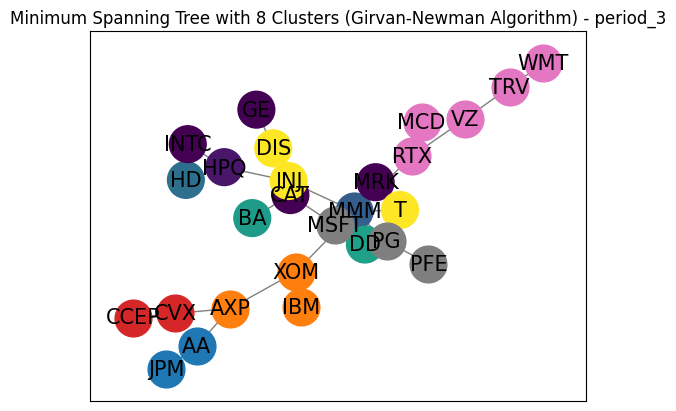

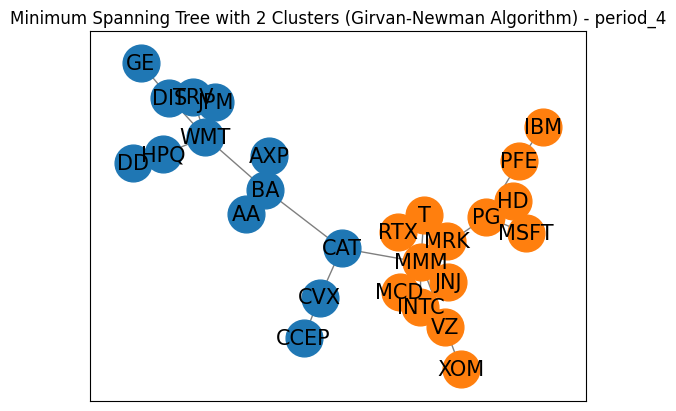

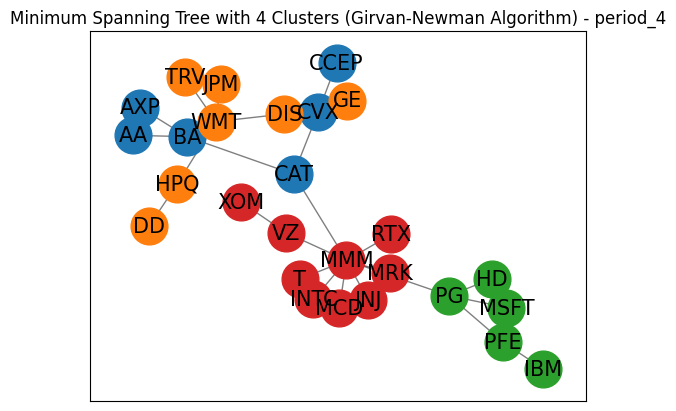

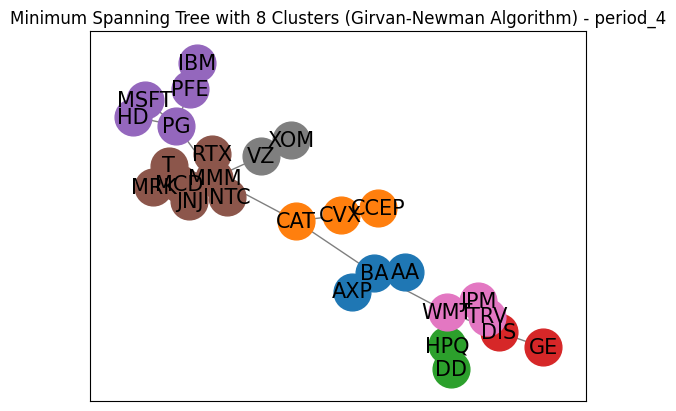

In [61]:
import numpy as np
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from networkx.algorithms.community import girvan_newman

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def generate_portfolios(communities, labels, num_portfolios=100):
    """Generate multiple portfolios by selecting one ticker at random from each cluster."""
    portfolios = []
    for _ in range(num_portfolios):
        portfolio = [random.choice(list([labels[node] for node in community])) for community in communities]
        portfolios.append(portfolio)
    return portfolios

def plot_MST_portfolios(G, num_clusters, period, communities, labels):
        # Plot the graph with clusters colored
        pos = nx.spring_layout(G)
        for i, community in enumerate(communities):
            nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=plt.cm.tab10(i), node_size=700, label=f'Cluster {i+1}')
        nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
        plt.title(f"Minimum Spanning Tree with {num_clusters} Clusters (Girvan-Newman Algorithm) - {period}")
        plt.show()


def MST_cluster(distance_matrix, labels, period, plot):
    sparse_matrix = csr_matrix(distance_matrix)

    # Compute the minimum spanning tree
    mst = minimum_spanning_tree(sparse_matrix)

    # Create a NetworkX graph from the MST
    G = nx.Graph(mst.toarray().astype(float))

    # Use the Girvan-Newman algorithm to find communities
    communities_generator = girvan_newman(G)

    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}

    for num_clusters in [2, 4, 8]:
        for communities in communities_generator:
            for comm_num, community in enumerate(communities, start=1):
                cluster_stocks[num_clusters][comm_num] = [labels[t] for t in community]    
            if len(communities) == num_clusters:
                break
        
        #plot
        if plot:
            plot_MST_portfolios(G, num_clusters, period, communities, labels)
    return cluster_stocks

def MST(correlation_matrices, plot = True):
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        distance_matrix = correlation_matrices[period]
        tickers = sorted(set([index[0] for index in distance_matrix]))
        labels = {i: ticker for i, ticker in enumerate(tickers)}

        # Convert the distance matrix to a sparse matrix
        sparse_matrix = csr_matrix(distance_matrix)

        # Compute the minimum spanning tree
        mst = minimum_spanning_tree(sparse_matrix)

        # Create a NetworkX graph from the MST
        G = nx.Graph(mst.toarray().astype(float))
        if plot:
            # Draw the graph
            pos = nx.spring_layout(G)  # positions for all nodes
            nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')
            nx.draw_networkx_edges(G, pos, edge_color='k')
            nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
            plt.title(f"Minimum Spanning Tree Visualization - {period}")
            plt.show()       
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)

    mst_all_cluster_stocks = {}
    tickers = sorted(set(index[0] for index in distance_matrix))
    labels = {i: ticker for i, ticker in enumerate(tickers)}
    for period, distance_matrix in distance_matrices.items():
        mst_all_cluster_stocks[period] = MST_cluster(distance_matrix.values, labels, period, plot)

    return mst_all_cluster_stocks
mst_all_cluster_stocks = MST(correlation_matrices)

In [62]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period, mst_result_df_clusters = calculate_metrics_for_mst_clusters(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters


,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.017087,0.037464,-0.055887,0.349059,"[XOM, GE, MRK, DIS, CCEP, VZ, CVX, IBM, JPM, M..."
period_1 (4 stocks),0.001957,0.033780,0.006453,0.360807,"[MMM, XOM, HPQ, DIS, PFE, JNJ, DD, VZ, AXP, BA..."
period_1 (8 stocks),0.029945,0.031951,0.094712,0.375255,"[AXP, BA, CVX, INTC, DIS, HPQ, TRV, PFE, AXP, ..."
period_2 (2 stocks),0.235945,0.021933,1.160441,0.213087,"[TRV, RTX, T, JPM, XOM, MMM, XOM, HPQ, XOM, WM..."
period_2 (4 stocks),0.253938,0.018516,1.402263,0.267991,"[CVX, IBM, PFE, INTC, GE, WMT, PFE, DD, DIS, M..."
period_2 (8 stocks),0.296956,0.015900,1.877124,0.238396,"[DIS, AXP, MSFT, CVX, INTC, HPQ, PFE, TRV, AA,..."
period_3 (2 stocks),-0.032284,0.042781,-0.050677,0.498008,"[HPQ, PG, MRK, DIS, AXP, PFE, INTC, GE, INTC, ..."
period_3 (4 stocks),0.016848,0.039764,0.061977,0.504031,"[CCEP, GE, T, VZ, IBM, MSFT, INTC, TRV, IBM, M..."
period_3 (8 stocks),0.005940,0.040702,0.018974,0.508281,"[AA, IBM, CAT, CCEP, DD, HD, RTX, PG, AA, XOM,..."
period_4 (2 stocks),0.406638,0.027589,1.633651,0.471503,"[AA, PFE, TRV, RTX, AA, PFE, DIS, XOM, HPQ, IB..."


## Plots and Diagrams (In Sample)

In [63]:
def count_of_stocks(result_df_clusters,custom_tickers,experiment_name):
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers, columns=[period])
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers
        total_counts = counts_df.sum(axis=1)

        # Get the top 8 stocks and group the rest into "Other"
        top_8 = total_counts.nlargest(8)
        other = pd.Series(total_counts.sum() - top_8.sum(), index=["Other"])

        # Concatenate the top 8 and "Other"
        final_counts = pd.concat([top_8, other])

        # Plot the pie chart for the current period
        plt.figure(figsize=(8, 8))
        plt.pie(final_counts, labels=final_counts.index, autopct='%1.1f%%', startangle=140)
        plt.axis('equal')
        plt.title(f'{experiment_name} Top 8 Stocks - {period}')
        plt.show()
        total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Plot the pie chart for all periods combined
    plt.figure(figsize=(8, 8))
    plt.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(f"{experiment_name} All Stocks - All Periods Combined'")
    plt.show()

    ################################################################################################
    total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Sort the total counts in descending order
    total_counts_sorted = total_counts.sort_values(ascending=False)

    # Plot the bar chart for all periods combined
    plt.figure(figsize=(10, 6))
    total_counts_sorted.plot(kind='bar')
    plt.xlabel('Stock')
    plt.ylabel('Count')
    plt.title(f'{experiment_name} Total Counts of Each Stock Across All Periods')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

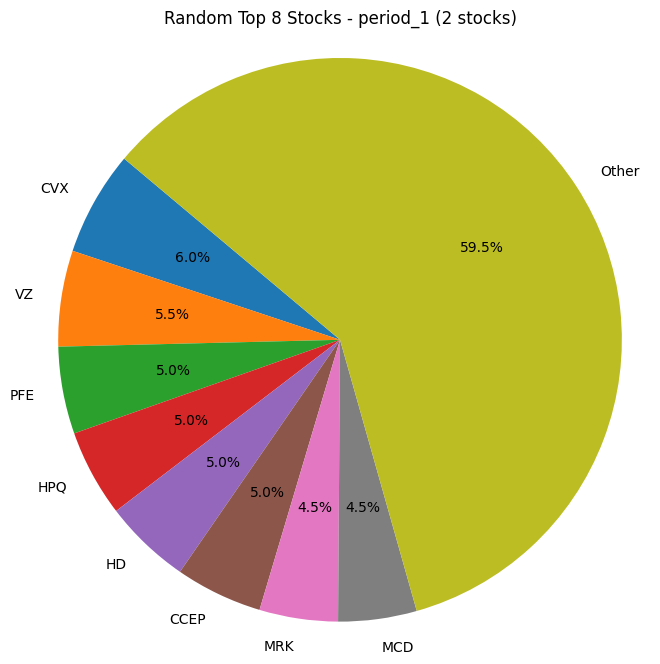

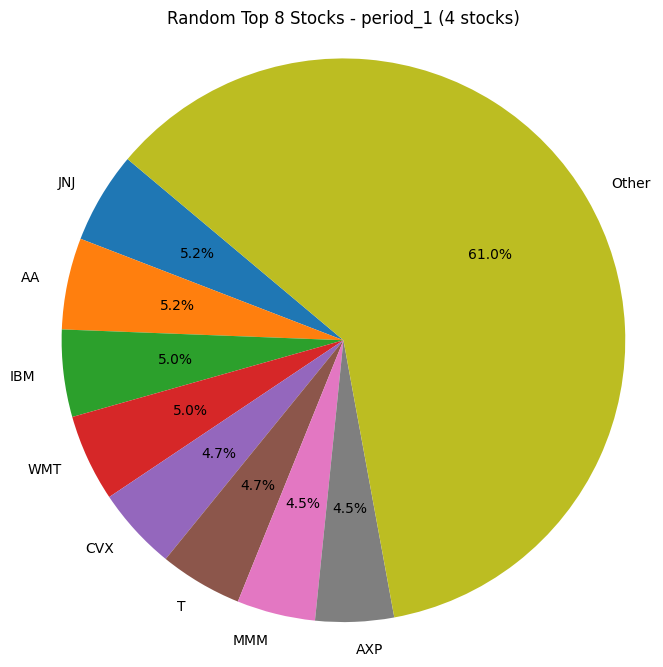

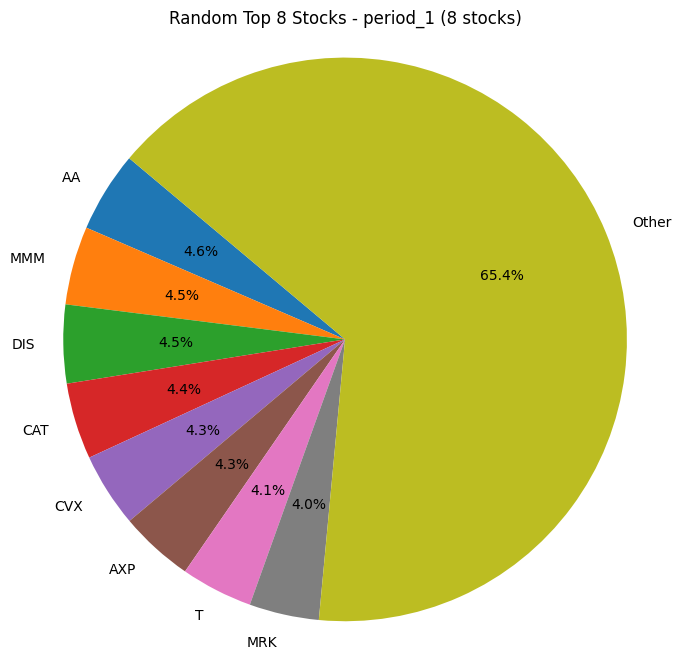

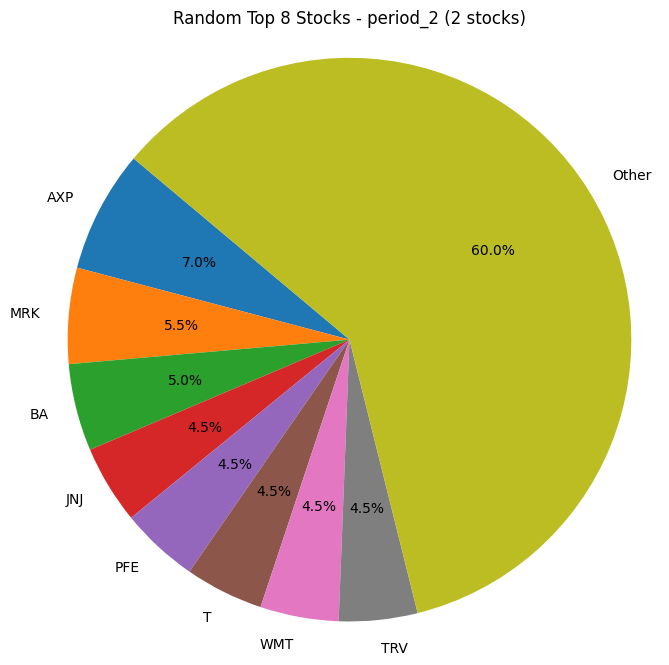

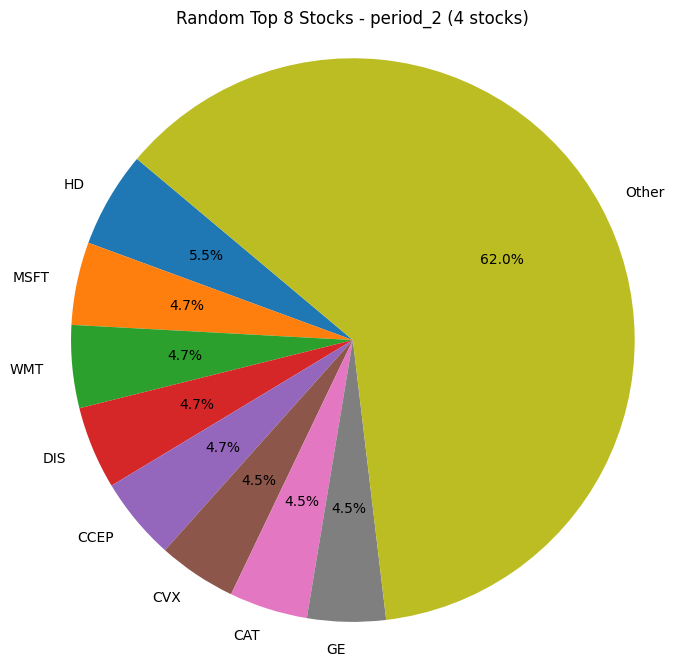

...

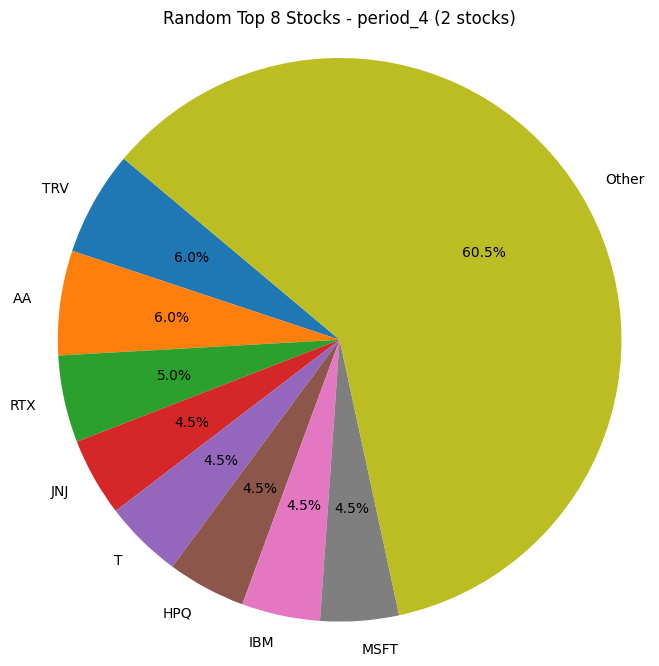

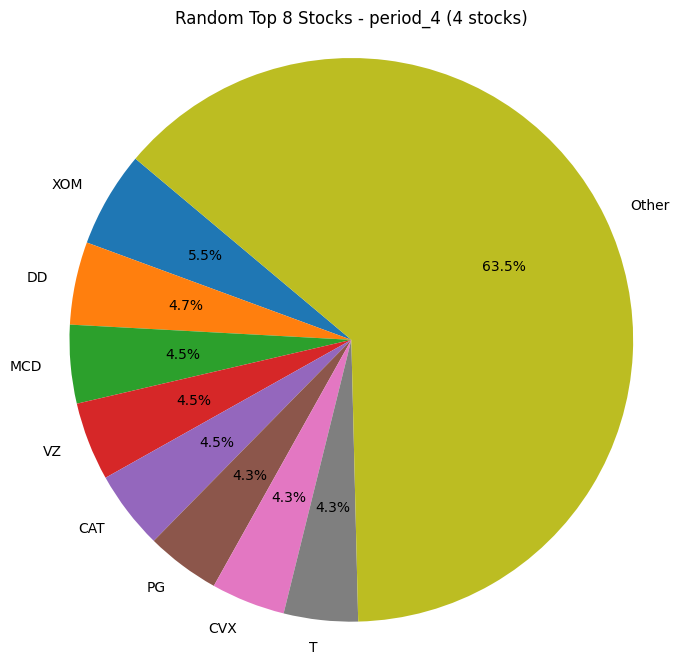

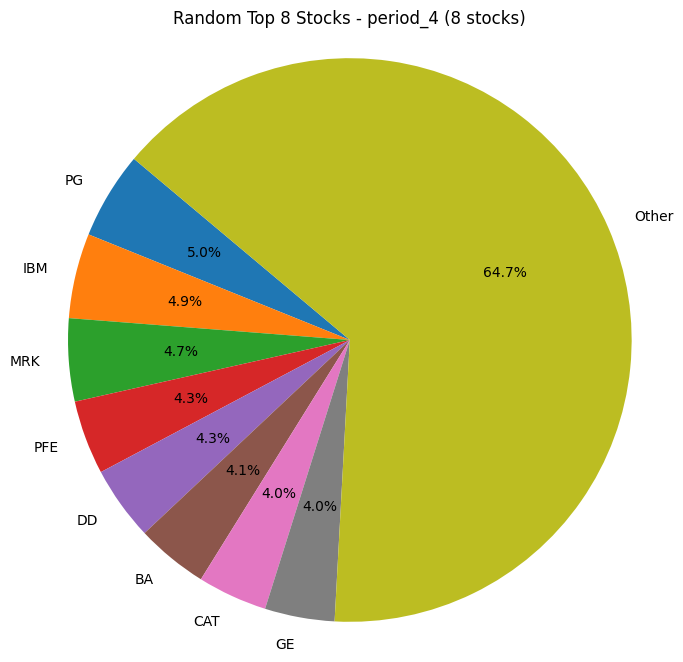

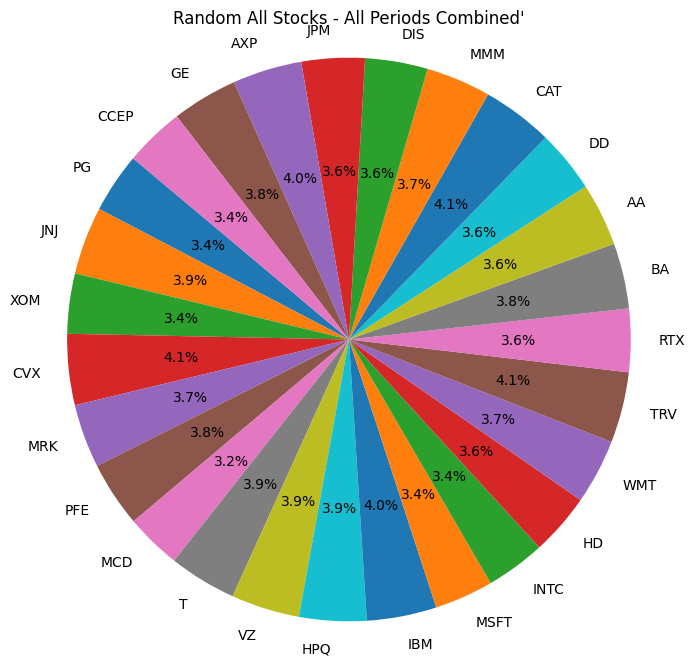

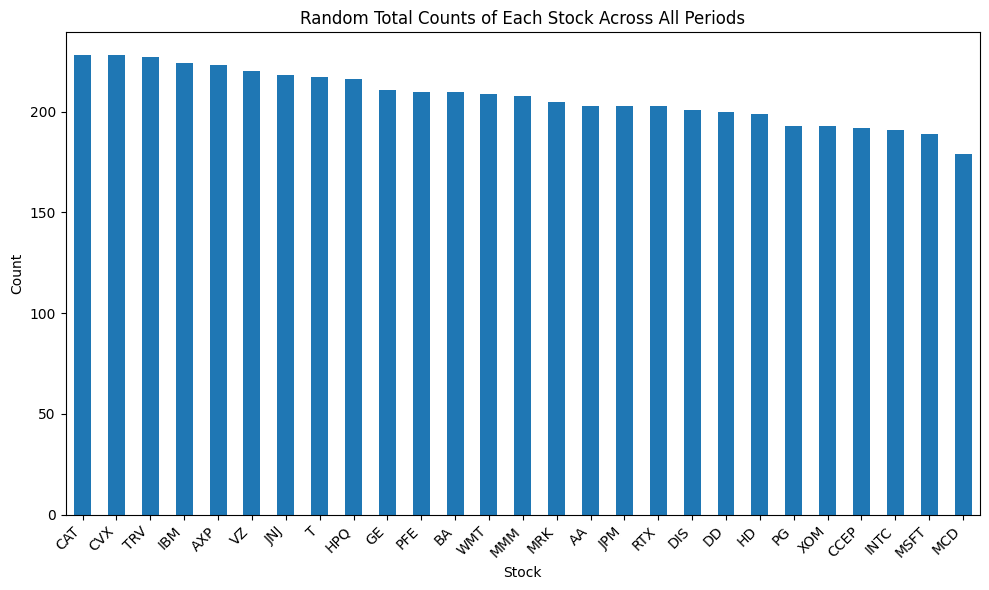

In [64]:
count_of_stocks(result_df_random,custom_tickers, "Random")

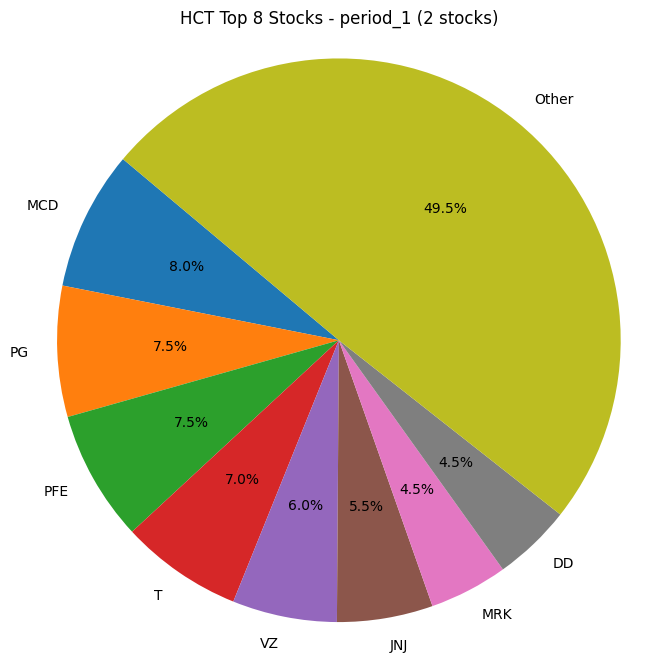

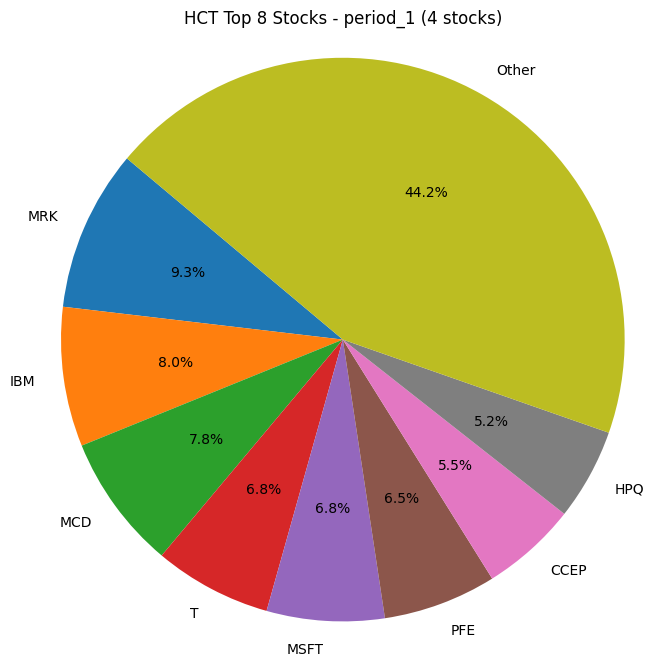

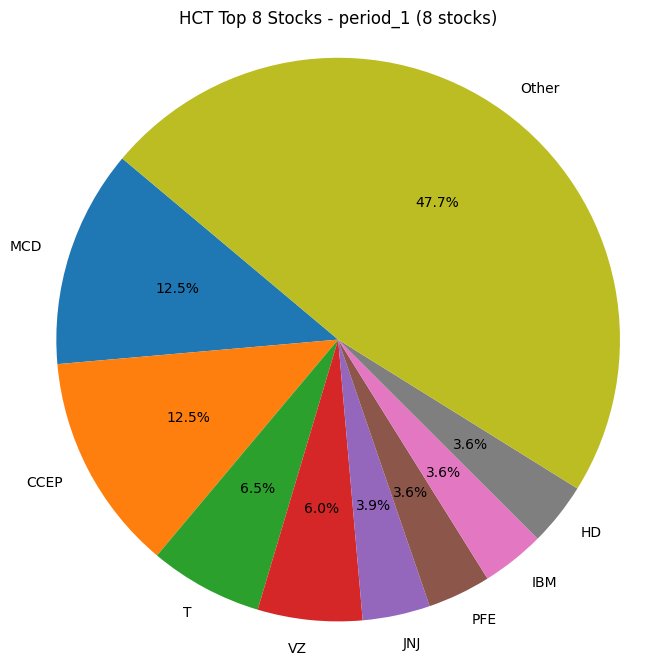

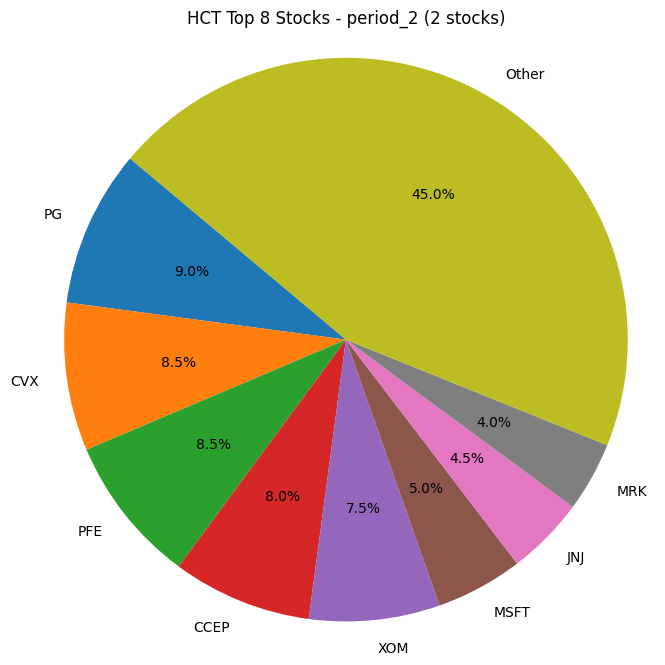

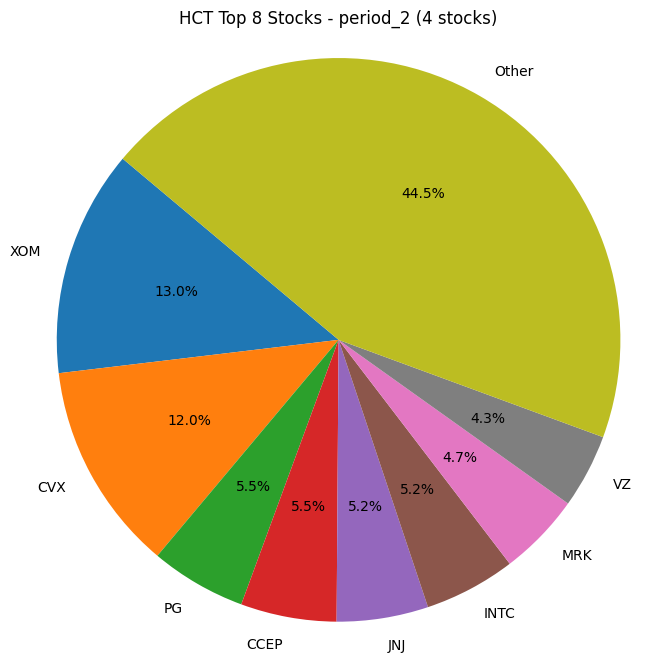

...

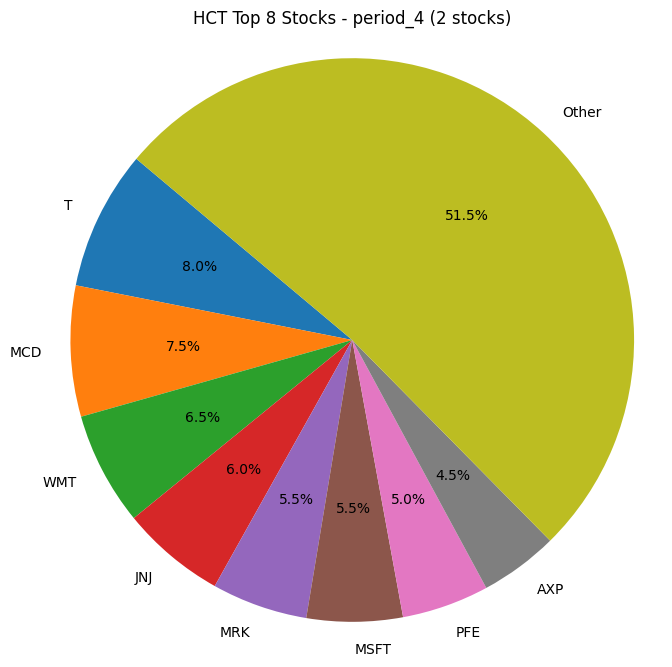

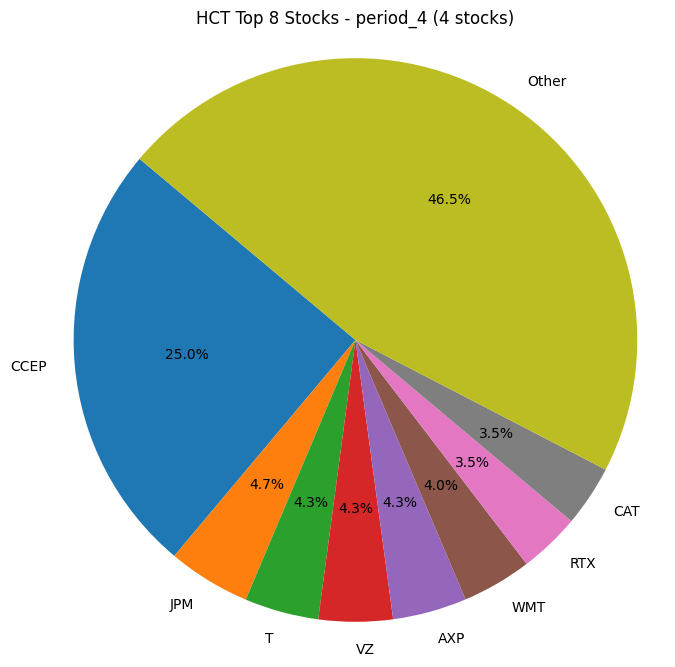

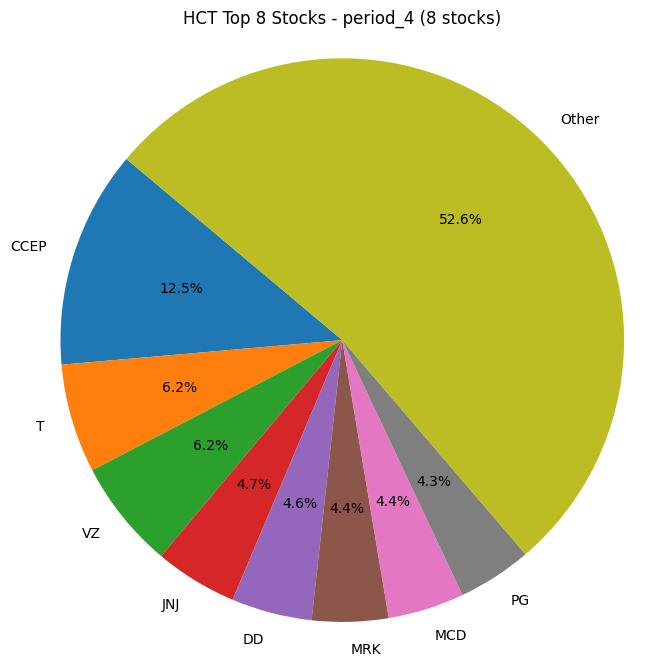

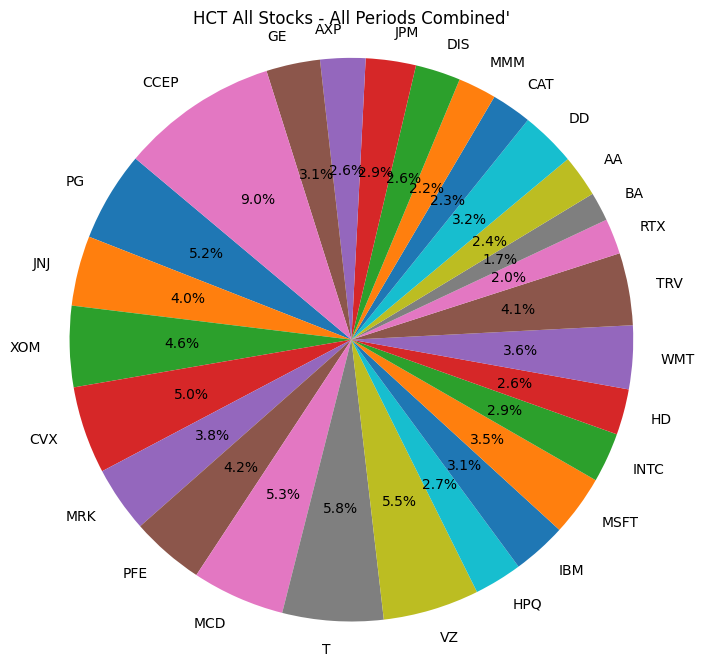

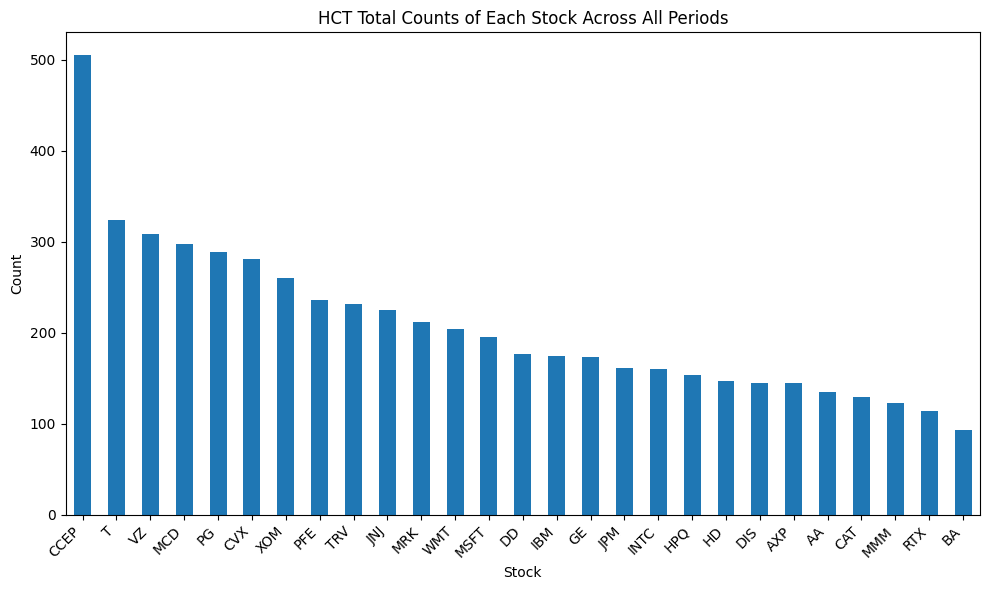

In [65]:
count_of_stocks(result_df_HCT,custom_tickers, "HCT")

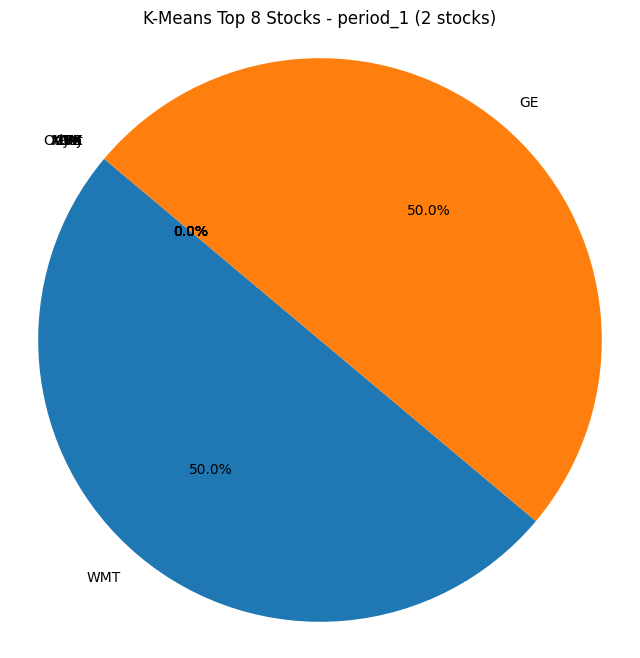

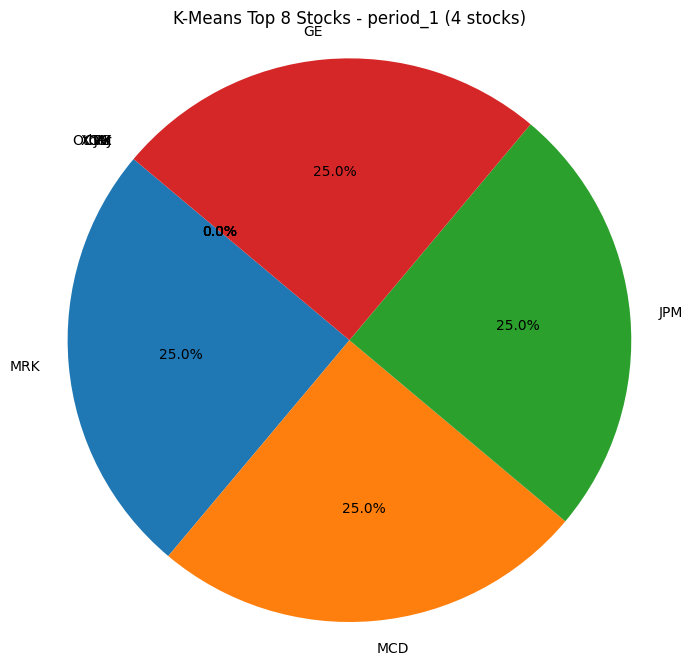

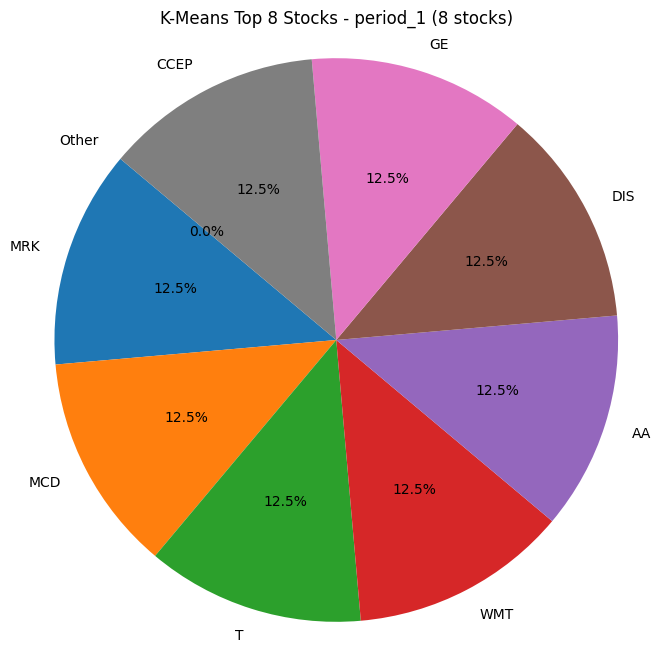

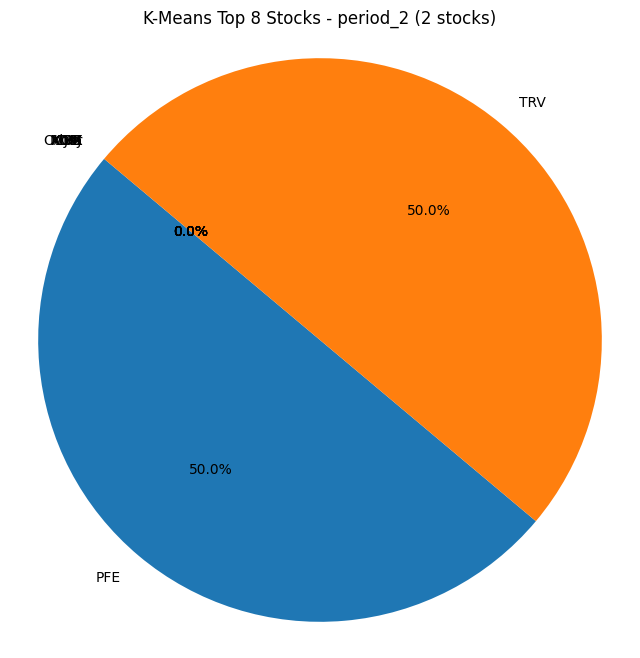

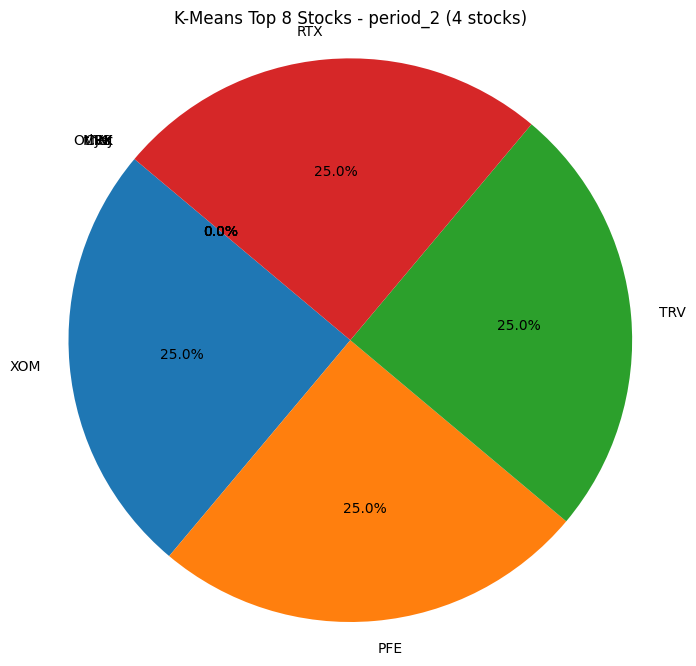

...

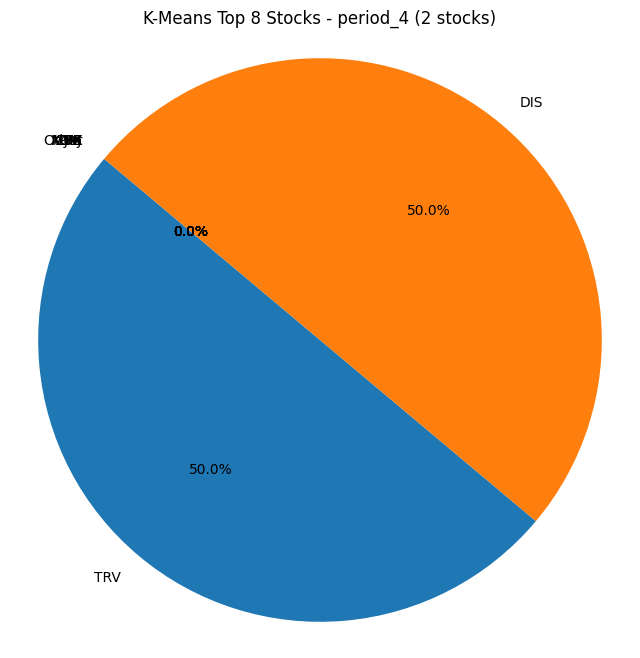

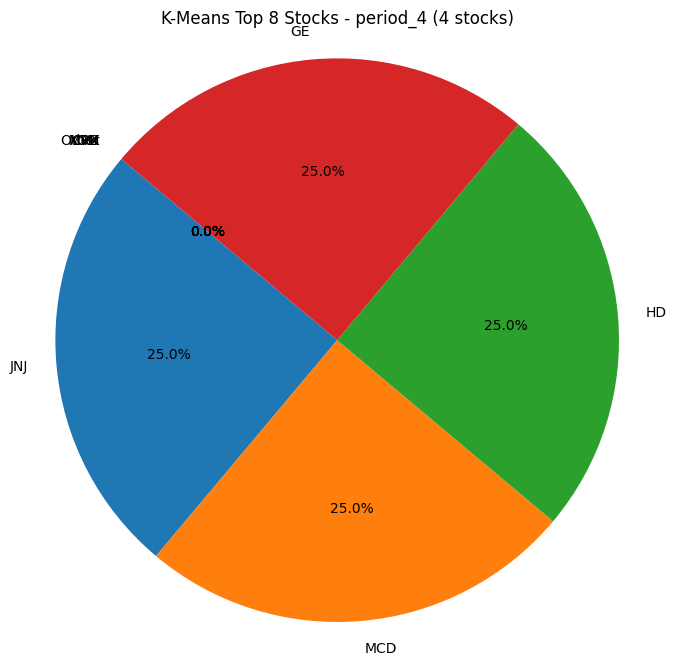

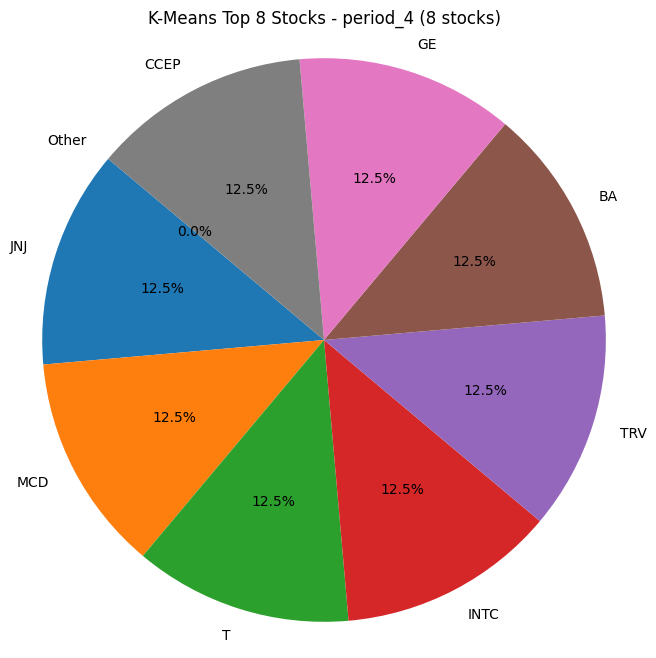

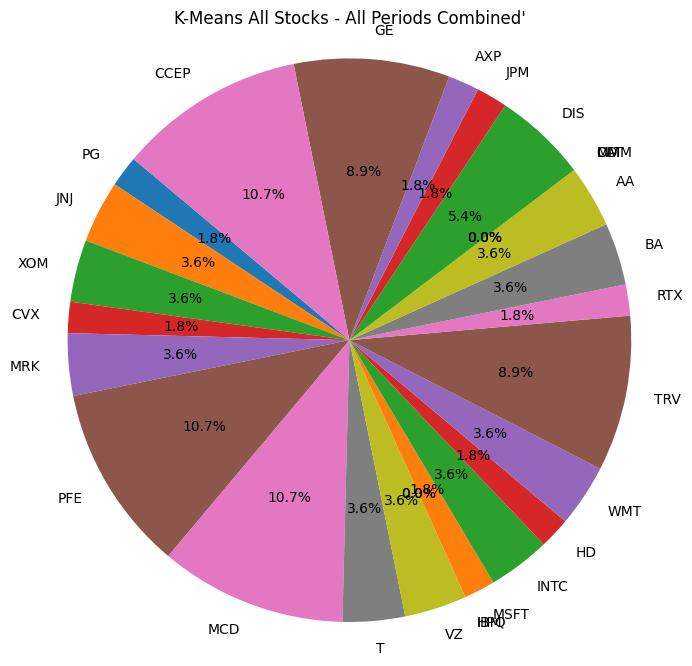

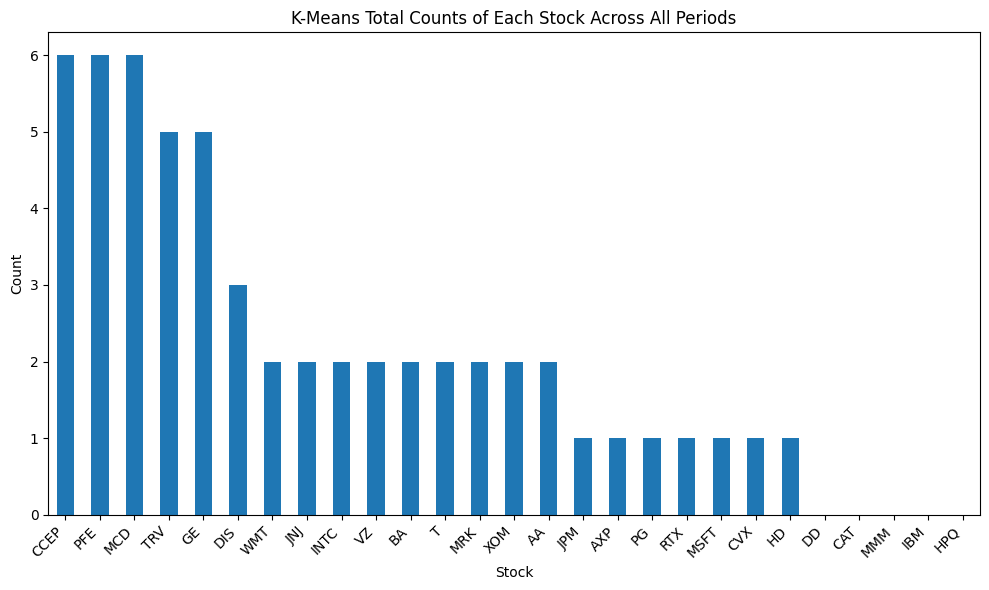

In [66]:
count_of_stocks(result_df_kmeans,custom_tickers, "K-Means")

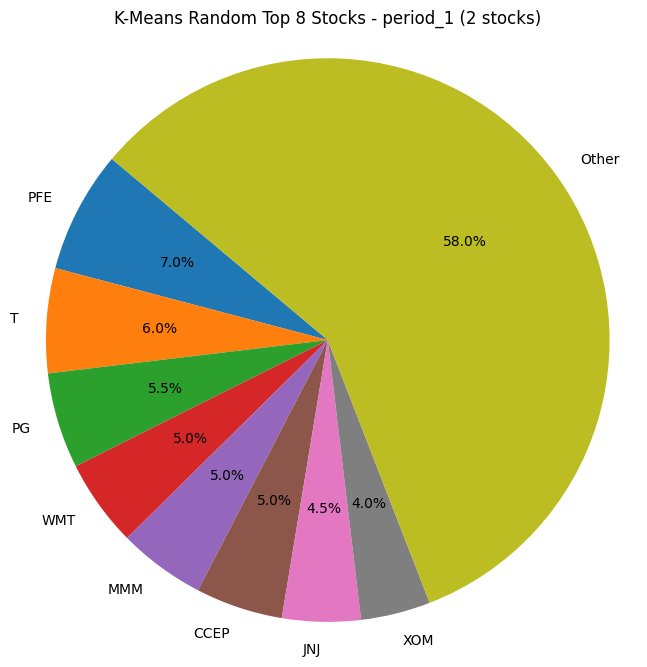

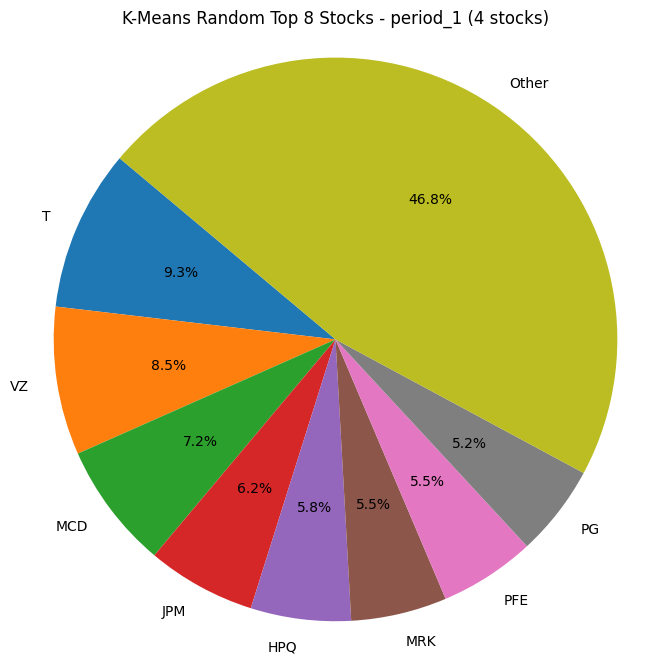

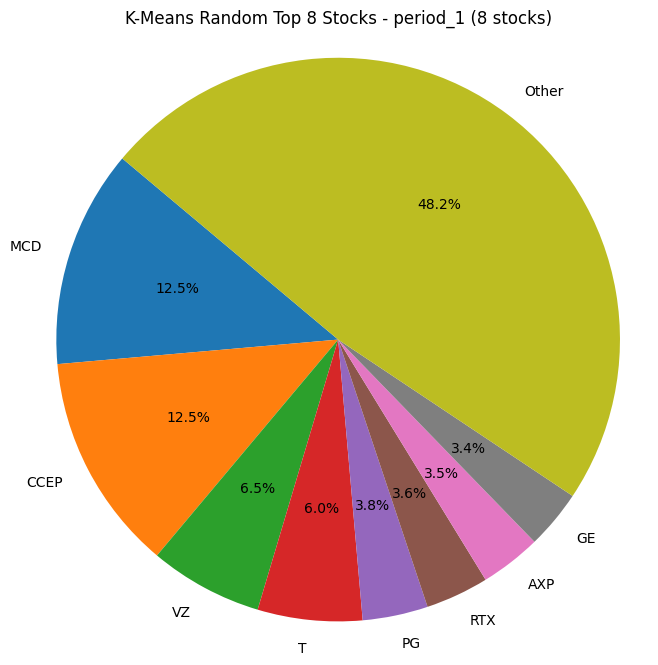

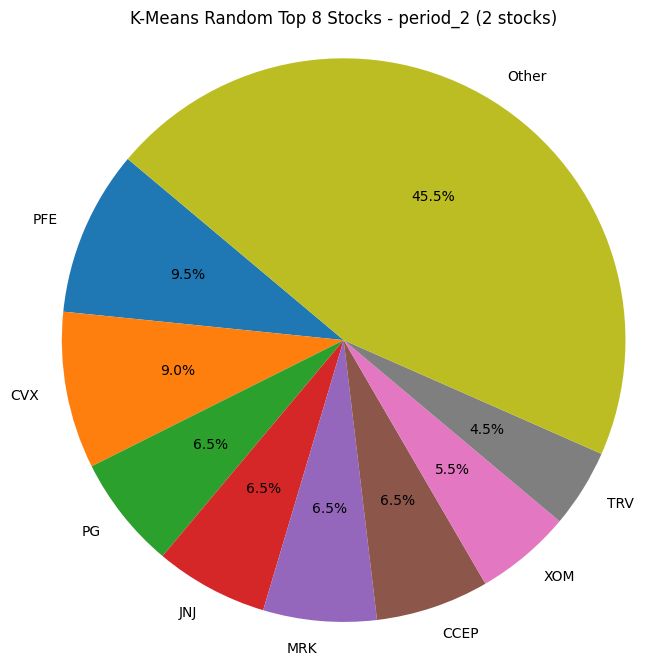

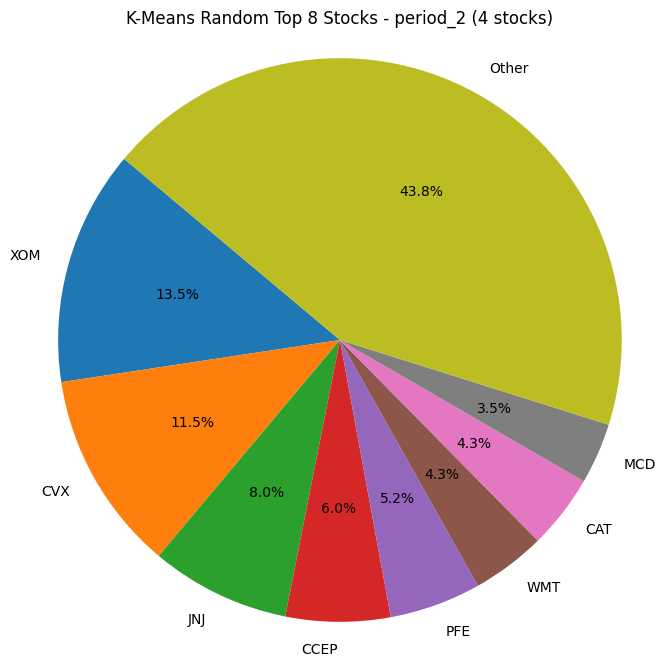

...

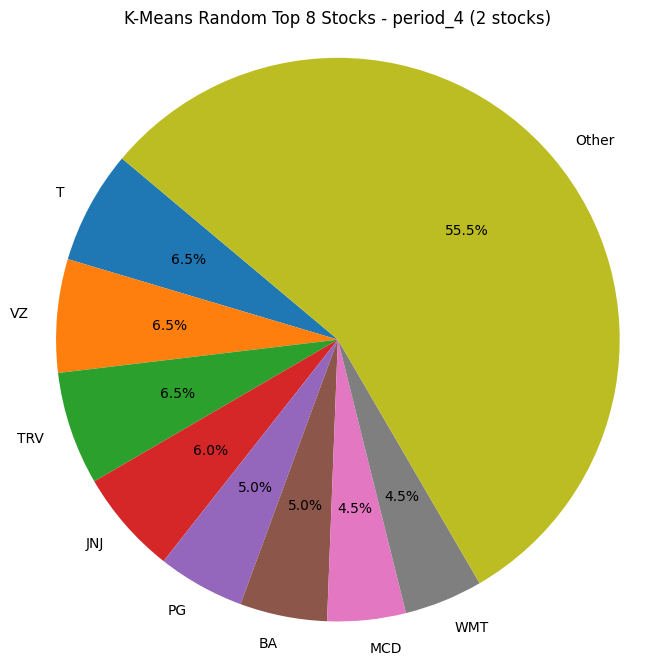

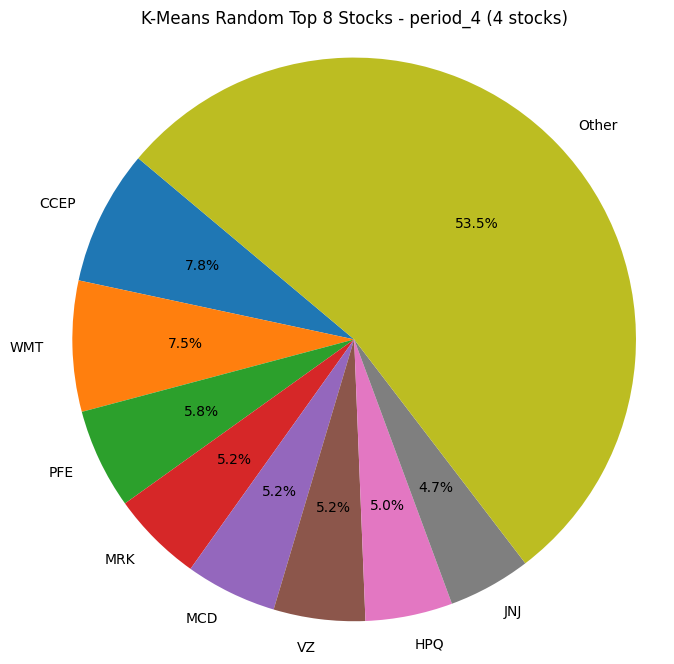

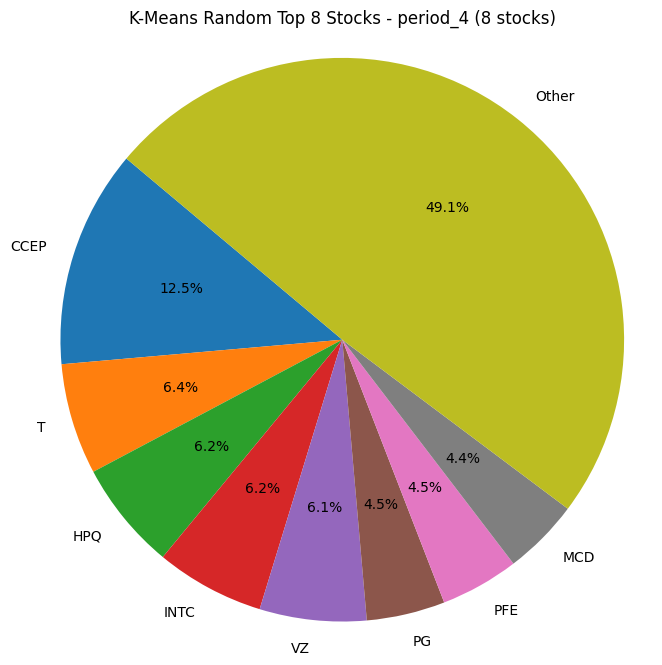

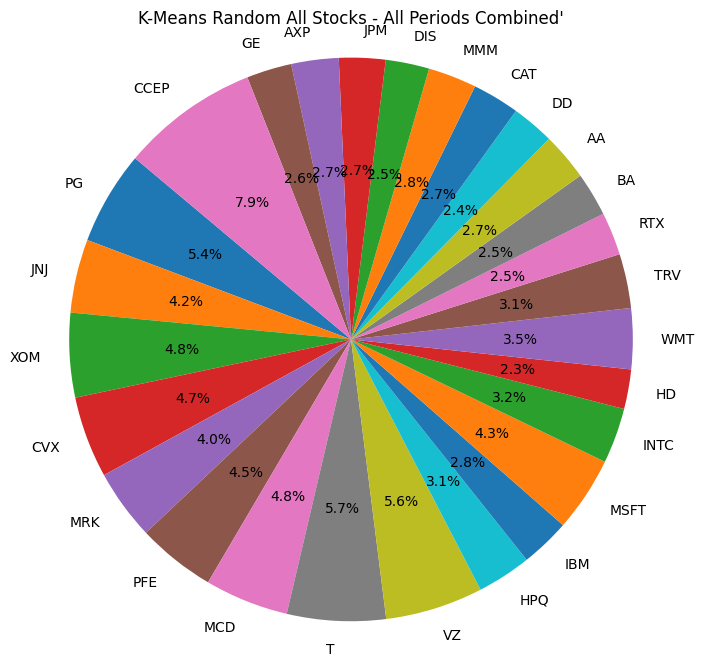

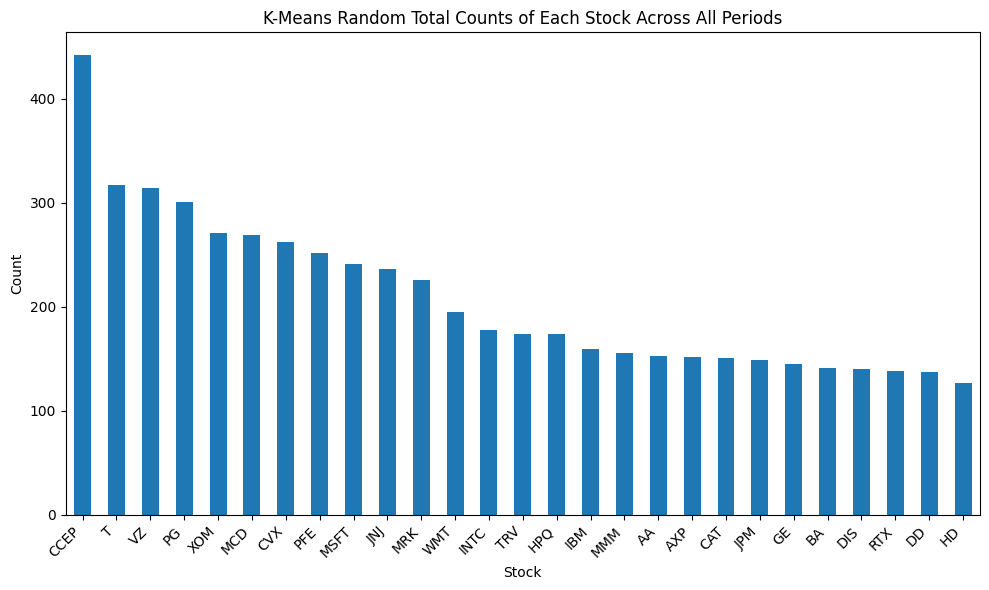

In [67]:
count_of_stocks(result_df_kmeans_rand,custom_tickers, "K-Means Random")

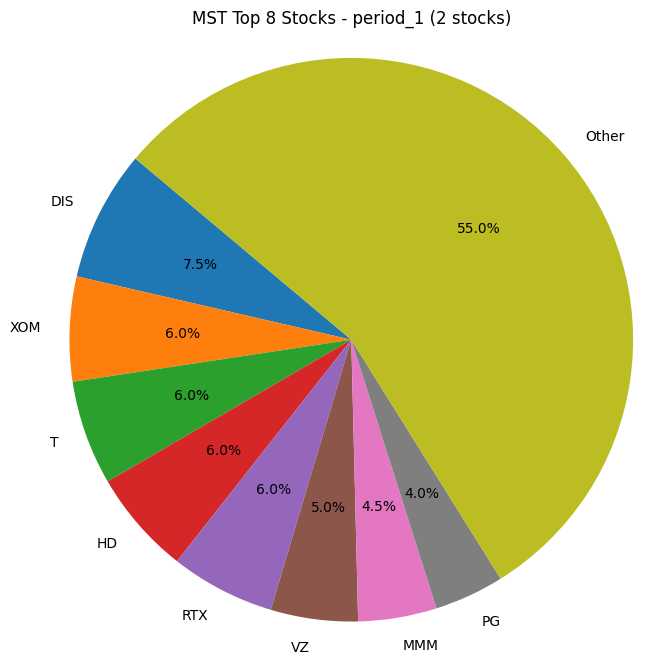

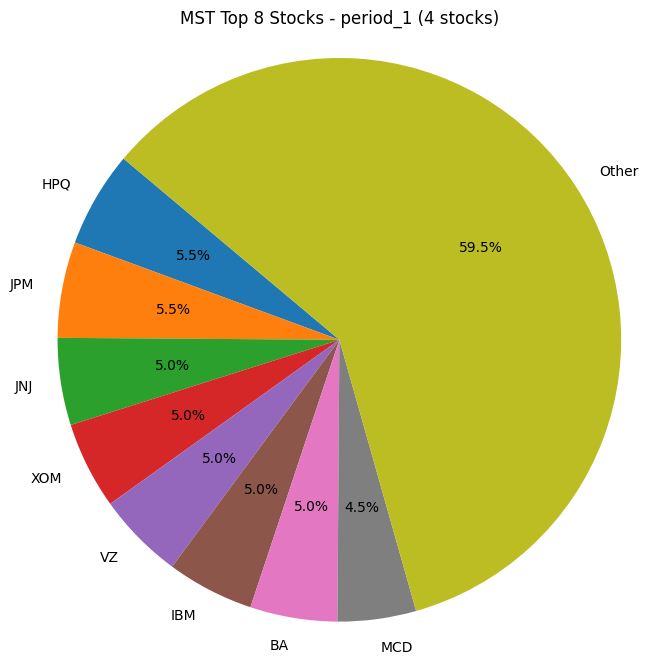

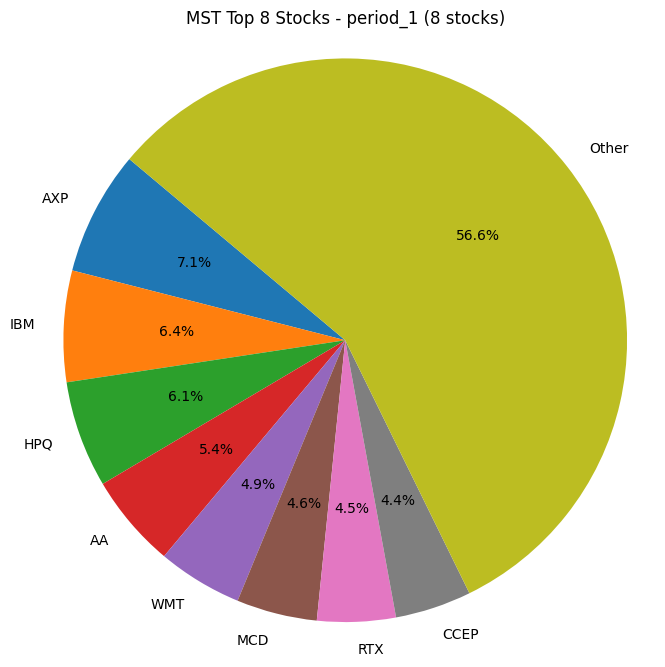

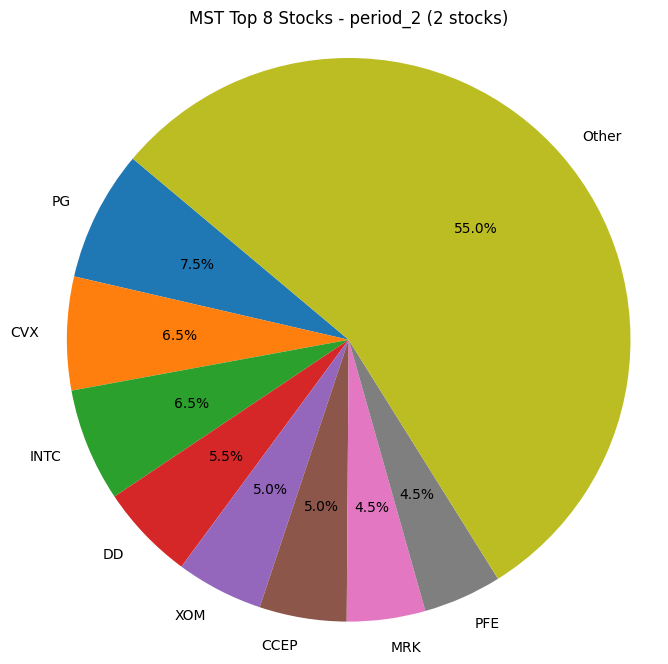

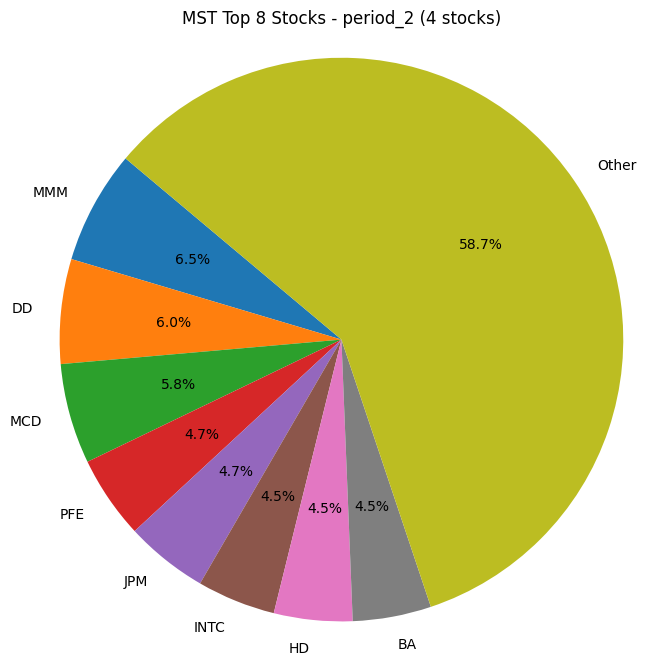

...

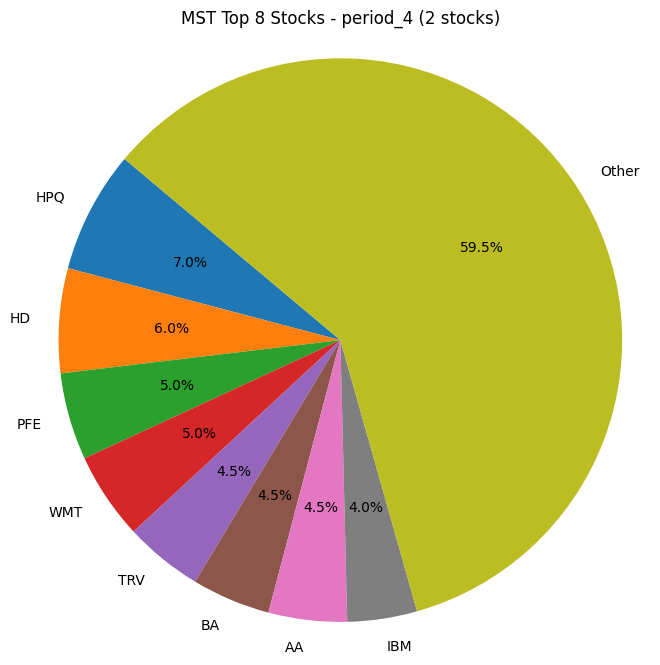

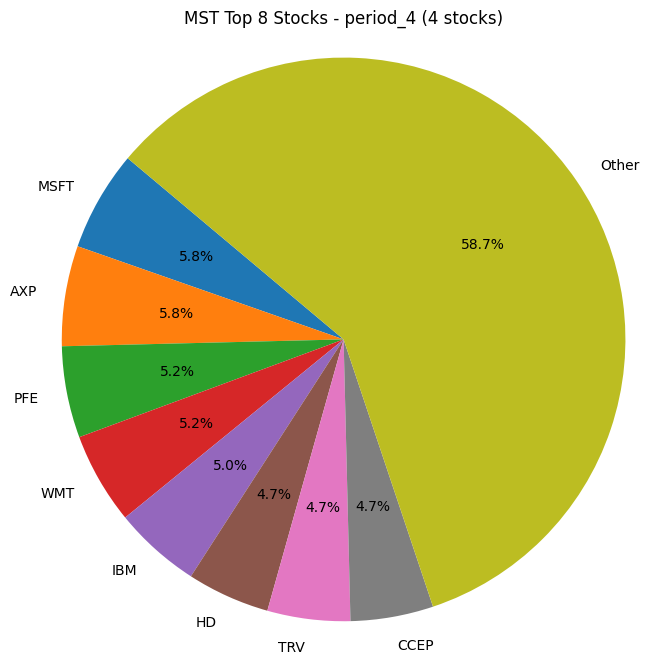

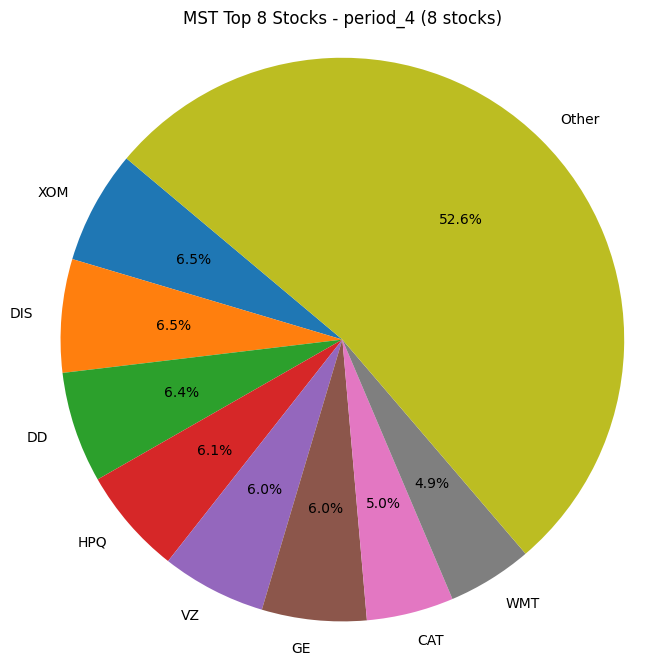

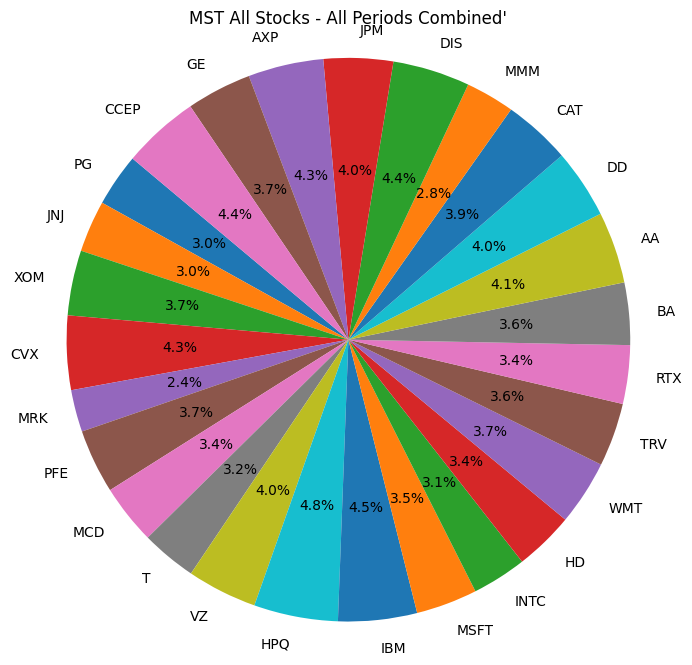

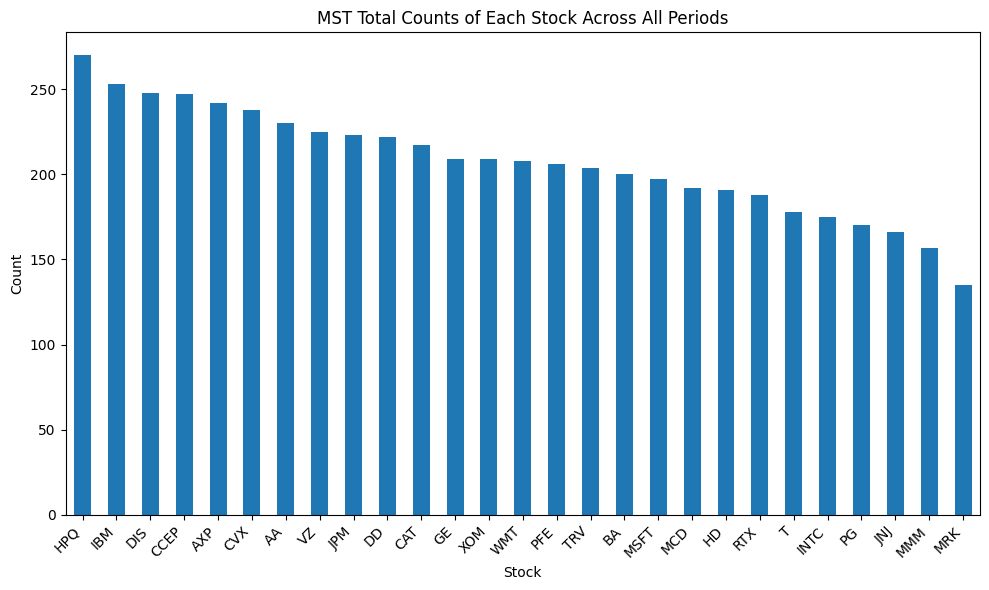

In [68]:
count_of_stocks(mst_result_df_clusters, custom_tickers, "MST")

In [88]:
def plot_metric(metric_name,result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, result_df_MST):
    labels = list(result_df_random.index)
    
    random_values = [result_df_random.loc[label][metric_name] for label in labels]
    HCT_values = [result_df_HCT.loc[label][metric_name] for label in labels]
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    MST_values = [result_df_MST.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.2  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width * 1.5, random_values, width, label='Random')
    rects2 = ax.bar(x - width * 0.5, HCT_values, width, label='HCT')
    rects3 = ax.bar(x + width * 0.5, kmeans_values, width, label='K-means')
    rects4 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='K-means Random')
    rects5 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='MST')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of Random Values:", np.mean(random_values))
    print("Total Average " + metric_name + " of Cluster Values:", np.mean(HCT_values))
    print("Total Average " + metric_name + " of K-means Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print("Total Average " + metric_name + " of MST Values:", np.mean(MST_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3", "Period 4"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of Random Values:", np.mean(random_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of Cluster Values:", np.mean(HCT_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of MST:", np.mean(MST_values[(period_num - 1) * 3:period_num * 3]))
        print()

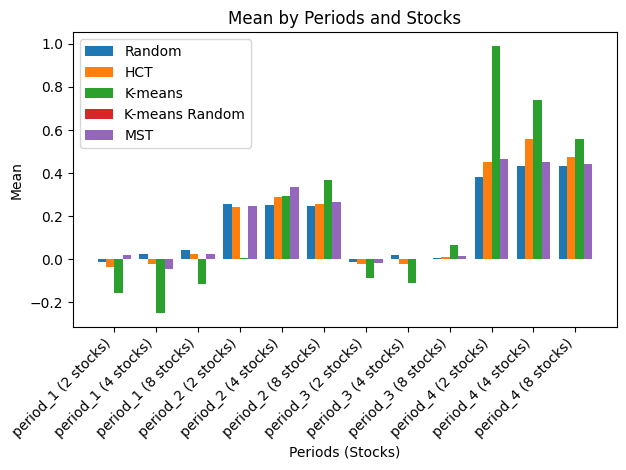

Total Average Mean of Random Values: 0.17239499905647948
Total Average Mean of Cluster Values: 0.18339750681215036
Total Average Mean of K-means Values: 0.19152296667803606
Total Average Mean of K-means Random Values: 0.1842829291776261
Total Average Mean of MST Values: 0.16979782730049744

Period 1 Average Mean of Random Values: 0.017579116703048635
Period 1 Average Mean of Cluster Values: -0.012215857060224933
Period 1 Average Mean of K-means Values: -0.17570878255500508
Period 1 Average Mean of K-means Random Values: 0.0010493123248410847
Period 1 Average Mean of MST: 0.004938448744907629

Period 2 Average Mean of Random Values: 0.25151381280205176
Period 2 Average Mean of Cluster Values: 0.26326068801222063
Period 2 Average Mean of K-means Values: 0.22300183916680352
Period 2 Average Mean of K-means Random Values: 0.28395563629407006
Period 2 Average Mean of MST: 0.26227943253147984

Period 3 Average Mean of Random Values: 0.004081840468645259
Period 3 Average Mean of Cluster Value

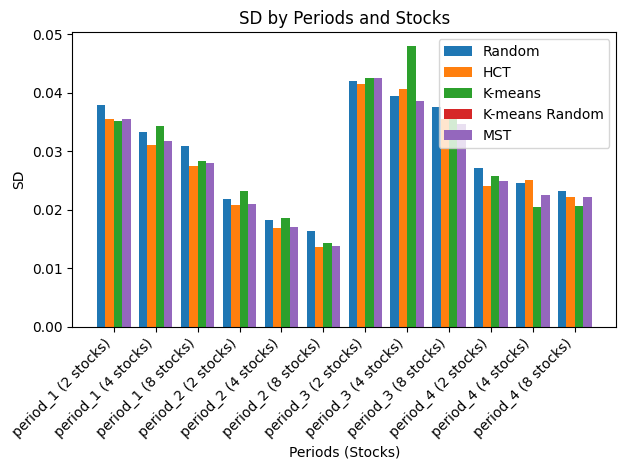

Total Average SD of Random Values: 0.029390224669507335
Total Average SD of Cluster Values: 0.027874227684470464
Total Average SD of K-means Values: 0.029001994143660354
Total Average SD of K-means Random Values: 0.02773721388299967
Total Average SD of MST Values: 0.03003803198151434

Period 1 Average SD of Random Values: 0.03399854136798709
Period 1 Average SD of Cluster Values: 0.031370624568572016
Period 1 Average SD of K-means Values: 0.03265769556855035
Period 1 Average SD of K-means Random Values: 0.03178586907388726
Period 1 Average SD of MST: 0.03439853714135724

Period 2 Average SD of Random Values: 0.018801664799211092
Period 2 Average SD of Cluster Values: 0.01712714890067619
Period 2 Average SD of K-means Values: 0.01874450612102482
Period 2 Average SD of K-means Random Values: 0.017286864160533655
Period 2 Average SD of MST: 0.018783107348539125

Period 3 Average SD of Random Values: 0.039733738838581036
Period 3 Average SD of Cluster Values: 0.03919797099864802
Period 3 A

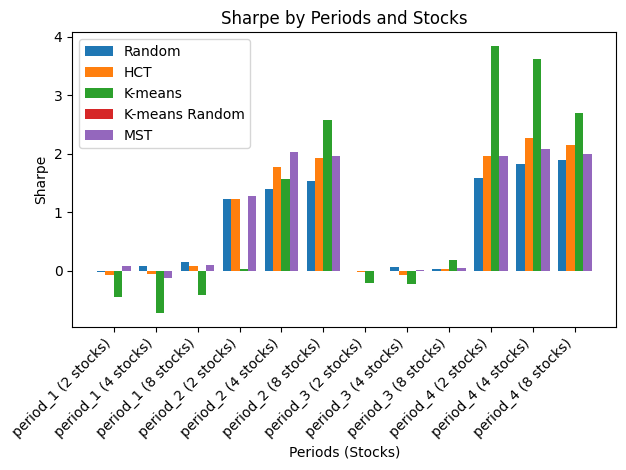

Total Average Sharpe of Random Values: 0.8116864331510184
Total Average Sharpe of Cluster Values: 0.9340618626475349
Total Average Sharpe of K-means Values: 1.039383217427146
Total Average Sharpe of K-means Random Values: 0.9488698373380159
Total Average Sharpe of MST Values: 0.8005379219666168

Period 1 Average Sharpe of Random Values: 0.06558431537971122
Period 1 Average Sharpe of Cluster Values: -0.016587990662638885
Period 1 Average Sharpe of K-means Values: -0.5314528982134986
Period 1 Average Sharpe of K-means Random Values: 0.01804146114824233
Period 1 Average Sharpe of MST: 0.015092672947694253

Period 2 Average Sharpe of Random Values: 1.384589479628312
Period 2 Average Sharpe of Cluster Values: 1.6433576177719045
Period 2 Average Sharpe of K-means Values: 1.3886416012941207
Period 2 Average Sharpe of K-means Random Values: 1.7490465968178464
Period 2 Average Sharpe of MST: 1.4799428738236182

Period 3 Average Sharpe of Random Values: 0.02488284765210685
Period 3 Average Sharp

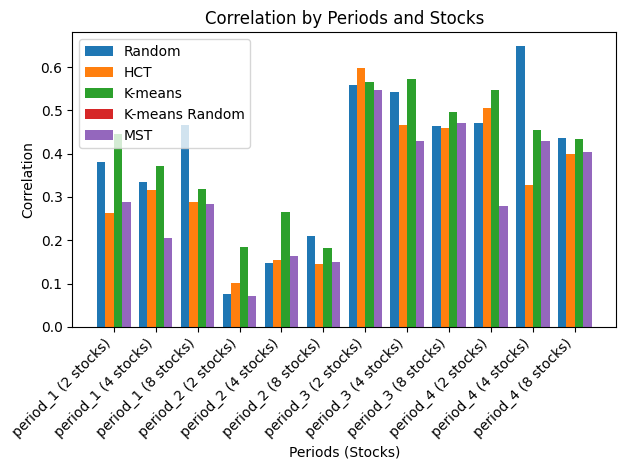

Total Average Correlation of Random Values: 0.39446413325391
Total Average Correlation of Cluster Values: 0.3352648066972006
Total Average Correlation of K-means Values: 0.4031557726316051
Total Average Correlation of K-means Random Values: 0.3102308012215274
Total Average Correlation of MST Values: 0.39703603839126983

Period 1 Average Correlation of Random Values: 0.3946101099146861
Period 1 Average Correlation of Cluster Values: 0.2891818084678462
Period 1 Average Correlation of K-means Values: 0.3778566500663174
Period 1 Average Correlation of K-means Random Values: 0.2591107571125395
Period 1 Average Correlation of MST: 0.3617069757252788

Period 2 Average Correlation of Random Values: 0.14356670182218975
Period 2 Average Correlation of Cluster Values: 0.133946745276497
Period 2 Average Correlation of K-means Values: 0.2114126288728896
Period 2 Average Correlation of K-means Random Values: 0.12831249239210255
Period 2 Average Correlation of MST: 0.23982426487931532

Period 3 Avera

In [89]:
# Plotting Mean
plot_metric('Mean',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting SD
plot_metric('SD',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Correlation
plot_metric('Correlation',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

In [71]:
def plot_metric_kmeans(metric_name,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_kmeans.index)
    
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.35  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects3 = ax.bar(x - width/2, kmeans_values, width, label='K-means Centroid')
    rects4 = ax.bar(x + width/2, kmeans_rand_values, width, label='K-means Random')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))

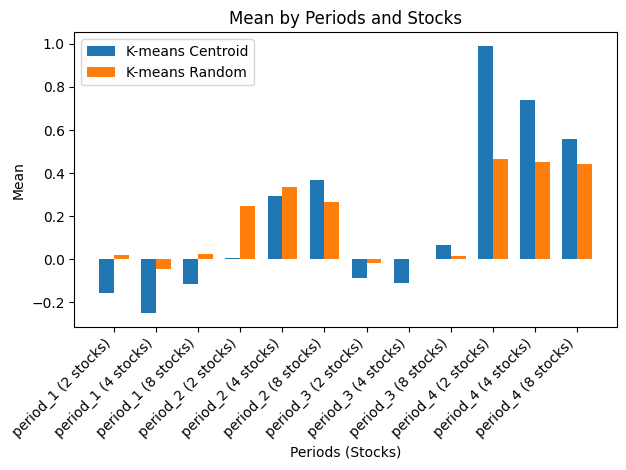

Total Average Mean of K-means Centroid Values: 0.19152296667803606
Total Average Mean of K-means Random Values: 0.1842829291776261

Period 1 Average Mean of K-means Centroid Values: -0.17570878255500508
Period 1 Average Mean of K-means Random Values: 0.0010493123248410847
Period 2 Average Mean of K-means Centroid Values: 0.22300183916680352
Period 2 Average Mean of K-means Random Values: 0.28395563629407006
Period 3 Average Mean of K-means Centroid Values: -0.04431001230384746
Period 3 Average Mean of K-means Random Values: -0.0008472835391138018


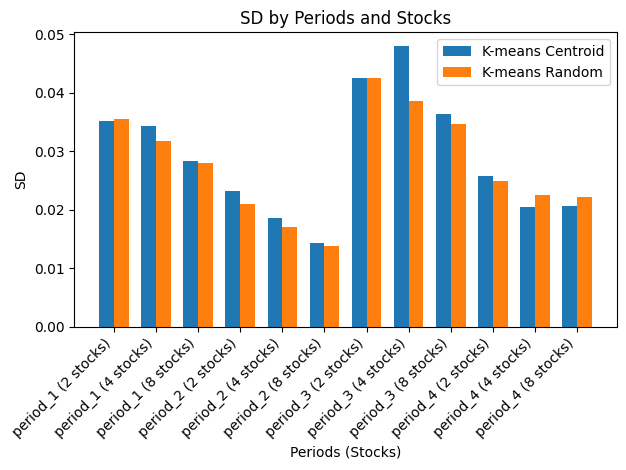

Total Average SD of K-means Centroid Values: 0.029001994143660354
Total Average SD of K-means Random Values: 0.02773721388299967

Period 1 Average SD of K-means Centroid Values: 0.03265769556855035
Period 1 Average SD of K-means Random Values: 0.03178586907388726
Period 2 Average SD of K-means Centroid Values: 0.01874450612102482
Period 2 Average SD of K-means Random Values: 0.017286864160533655
Period 3 Average SD of K-means Centroid Values: 0.0422948239695446
Period 3 Average SD of K-means Random Values: 0.03864543883576533


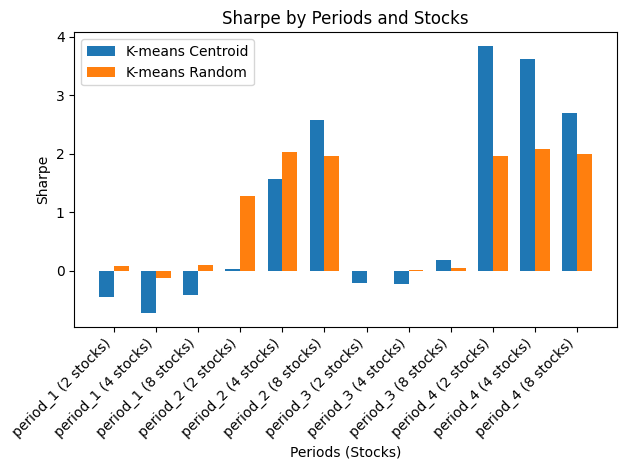

Total Average Sharpe of K-means Centroid Values: 1.039383217427146
Total Average Sharpe of K-means Random Values: 0.9488698373380159

Period 1 Average Sharpe of K-means Centroid Values: -0.5314528982134986
Period 1 Average Sharpe of K-means Random Values: 0.01804146114824233
Period 2 Average Sharpe of K-means Centroid Values: 1.3886416012941207
Period 2 Average Sharpe of K-means Random Values: 1.7490465968178464
Period 3 Average Sharpe of K-means Centroid Values: -0.08592128691830096
Period 3 Average Sharpe of K-means Random Values: 0.01643651841823163


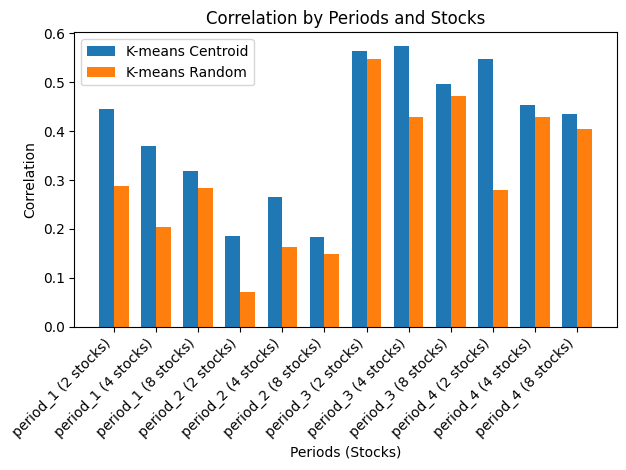

Total Average Correlation of K-means Centroid Values: 0.4031557726316051
Total Average Correlation of K-means Random Values: 0.3102308012215274

Period 1 Average Correlation of K-means Centroid Values: 0.3778566500663174
Period 1 Average Correlation of K-means Random Values: 0.2591107571125395
Period 2 Average Correlation of K-means Centroid Values: 0.2114126288728896
Period 2 Average Correlation of K-means Random Values: 0.12831249239210255
Period 3 Average Correlation of K-means Centroid Values: 0.5448246701997727
Period 3 Average Correlation of K-means Random Values: 0.4825318875320886


In [72]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans,result_df_kmeans_rand)

# Analysis in Following Period

In [73]:
def calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_stocks = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlations = []
            selected_stocks_list = {}

            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(train_returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]

            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}
        results_by_period[test_period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

In [74]:
num_stocks_list = [2, 4, 8]
result_df_random_test1 = calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list)
result_df_random_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.256095,0.021572,1.237675,0.242815,"[PG, T, INTC, AXP, HPQ, TRV, MSFT, DD, TRV, IB..."
period_2 (4 stocks),0.242926,0.018168,1.370893,0.243838,"[MMM, AXP, AA, JNJ, MMM, VZ, T, CAT, CAT, T, I..."
period_2 (8 stocks),0.250460,0.015969,1.580953,0.243570,"[WMT, MMM, HD, JNJ, JPM, AA, T, GE, AA, HPQ, B..."
period_3 (2 stocks),-0.025430,0.043527,-0.026738,0.500725,"[INTC, JPM, DD, HD, HPQ, MRK, BA, HD, DD, AA, ..."
period_3 (4 stocks),-0.008352,0.040083,-0.006121,0.505187,"[BA, AXP, WMT, HD, WMT, CCEP, JNJ, AXP, AXP, V..."
period_3 (8 stocks),0.006529,0.037714,0.024141,0.501071,"[AXP, DD, GE, XOM, JPM, IBM, AA, CVX, AA, CCEP..."
period_4 (2 stocks),0.429721,0.027269,1.744950,0.488427,"[DD, PG, RTX, CCEP, HPQ, IBM, MSFT, AXP, RTX, ..."
period_4 (4 stocks),0.434316,0.024869,1.846014,0.486448,"[CAT, TRV, JNJ, MCD, PFE, RTX, DIS, VZ, AXP, M..."
period_4 (8 stocks),0.423926,0.023473,1.856771,0.485489,"[MRK, DIS, INTC, MCD, JPM, VZ, DD, CCEP, PFE, ..."


In [75]:
def calculate_metrics_for_all_clusters_test(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        selected_stocks_list = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]

                try:
                    selected_stocks_list[num_clusters] = np.concatenate([selected_stocks_list[num_clusters], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)

            final_stocks_list = [selected_stocks_list[num_clusters]]

            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}

        results_by_period[test_period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [76]:
result_df_HCT_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_HCT, period_dfs)
result_df_HCT_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.215908,0.021130,1.085368,0.176790,"[PG, INTC, JNJ, AA, CCEP, MMM, JNJ, MMM, JNJ, ..."
period_2 (4 stocks),0.204371,0.017425,1.210130,0.190468,"[MRK, MMM, CCEP, INTC, MRK, DIS, CCEP, MSFT, P..."
period_2 (8 stocks),0.271761,0.014816,1.855817,0.194524,"[MRK, XOM, MCD, VZ, HPQ, AXP, MMM, CCEP, MRK, ..."
period_3 (2 stocks),-0.027943,0.040847,-0.046306,0.482260,"[PFE, T, CVX, DIS, CVX, HPQ, PFE, RTX, MRK, RT..."
period_3 (4 stocks),0.016301,0.036953,0.054905,0.497126,"[JNJ, XOM, BA, INTC, PFE, XOM, CAT, JPM, PFE, ..."
period_3 (8 stocks),0.031417,0.033945,0.096634,0.509968,"[PG, JNJ, XOM, DIS, VZ, GE, DD, CCEP, PG, JNJ,..."
period_4 (2 stocks),0.424222,0.026411,1.717642,0.450916,"[JNJ, AXP, JNJ, AA, JNJ, GE, CVX, DIS, MSFT, C..."
period_4 (4 stocks),0.419845,0.025158,1.712518,0.502940,"[WMT, CVX, CAT, DD, MRK, VZ, AA, DD, PG, XOM, ..."
period_4 (8 stocks),0.475734,0.021917,2.194266,0.476954,"[PFE, CVX, MCD, T, HD, TRV, MMM, JPM, PG, XOM,..."


In [77]:
result_df_kmeans_rand_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.254261,0.021120,1.256108,0.202421,"[CCEP, HPQ, PG, IBM, MCD, AXP, MCD, HD, MRK, G..."
period_2 (4 stocks),0.232871,0.017297,1.391662,0.206083,"[MSFT, CAT, MCD, JNJ, IBM, DD, T, JNJ, IBM, WM..."
period_2 (8 stocks),0.265057,0.014842,1.808049,0.201984,"[HD, PFE, GE, IBM, VZ, MCD, RTX, CCEP, CAT, JN..."
period_3 (2 stocks),-0.023279,0.040808,-0.033656,0.481816,"[MRK, BA, PFE, MSFT, CVX, INTC, CVX, MSFT, MRK..."
period_3 (4 stocks),0.012844,0.037457,0.048076,0.497417,"[XOM, RTX, IBM, PG, XOM, WMT, DIS, MRK, CVX, J..."
period_3 (8 stocks),0.017100,0.034734,0.054292,0.509935,"[PFE, DIS, VZ, CVX, RTX, CCEP, JPM, PG, JNJ, M..."
period_4 (2 stocks),0.450412,0.026170,1.825347,0.450152,"[VZ, INTC, MRK, AA, MRK, CAT, MRK, DD, PG, DIS..."
period_4 (4 stocks),0.368134,0.024950,1.559433,0.491848,"[MSFT, XOM, PG, JPM, IBM, CVX, MCD, AXP, HD, A..."
period_4 (8 stocks),0.404620,0.022084,1.848366,0.474491,"[GE, T, RTX, CAT, PFE, PG, XOM, MSFT, GE, T, B..."


In [78]:
def calculate_metrics_for_kmeans_test(all_cluster_stocks, period_dfs, centroid_vectors, distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        stocks_by_cluster = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[train_period][str(num_clusters)]
                distance_matrix = distance_matrices[train_period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks": [selected_stocks]}

        results_by_period[test_period] = results_by_cluster
        stocks_by_period[test_period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [79]:
result_df_kmeans_test1, stocks_by_period_kmeans_test1 = calculate_metrics_for_kmeans_test(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)
result_df_kmeans_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.029327,0.017406,0.168489,0.279819,"[WMT, GE]"
period_2 (4 stocks),0.290221,0.016554,1.753159,0.216628,"[JPM, GE, MCD, MRK]"
period_2 (8 stocks),0.176423,0.014637,1.205356,0.168385,"[WMT, MRK, GE, DIS, T, MCD, AA, CCEP]"
period_3 (2 stocks),-0.152147,0.038371,-0.396513,0.452278,"[PFE, TRV]"
period_3 (4 stocks),-0.034715,0.032483,-0.106872,0.492255,"[XOM, RTX, TRV, PFE]"
period_3 (8 stocks),-0.008334,0.031266,-0.026654,0.486196,"[PFE, MCD, VZ, XOM, BA, CCEP, TRV, PG]"
period_4 (2 stocks),0.762271,0.027727,2.749165,0.232697,"[PFE, CCEP]"
period_4 (4 stocks),0.403470,0.027776,1.452593,0.399930,"[CCEP, AA, PFE, DIS]"
period_4 (8 stocks),0.585518,0.020803,2.814640,0.407240,"[AXP, VZ, CCEP, INTC, PFE, MCD, CVX, MSFT]"


In [80]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters_out_sample(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        period_number = int(period[-1])
        if period_number == 4: #last period
            break
        else:
            next_period = 'period_'+str(period_number+1)
        
        next_returns_data = period_dfs[next_period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = next_returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = next_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[next_period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period_out_sample, mst_result_df_clusters_out_sample = calculate_metrics_for_mst_clusters_out_sample(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters_out_sample


,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.209476,0.022272,1.011425,0.244016,"[PFE, VZ, MRK, VZ, CAT, WMT, CVX, DIS, JNJ, WM..."
period_2 (4 stocks),0.273954,0.018241,1.535733,0.252038,"[AXP, XOM, INTC, WMT, PG, BA, HD, MCD, MMM, JP..."
period_2 (8 stocks),0.263164,0.016050,1.651769,0.253505,"[AXP, JPM, CCEP, HD, WMT, IBM, TRV, MSFT, AA, ..."
period_3 (2 stocks),-0.025866,0.041910,-0.038057,0.509331,"[TRV, WMT, INTC, WMT, VZ, BA, CVX, PG, T, MSFT..."
period_3 (4 stocks),-0.008520,0.040024,-0.006889,0.509328,"[CVX, MMM, CAT, INTC, VZ, AXP, PFE, XOM, T, PG..."
period_3 (8 stocks),0.022385,0.038203,0.062634,0.509883,"[AA, MMM, MSFT, CVX, DD, IBM, RTX, VZ, AA, AXP..."
period_4 (2 stocks),0.465876,0.027606,1.823212,0.506346,"[DD, PG, HPQ, BA, INTC, GE, CCEP, PFE, MRK, BA..."
period_4 (4 stocks),0.477989,0.024000,2.061222,0.473506,"[XOM, DIS, HD, RTX, CCEP, CAT, INTC, MCD, CVX,..."
period_4 (8 stocks),0.392047,0.024628,1.612550,0.487929,"[JPM, AXP, CAT, CCEP, T, JNJ, TRV, MSFT, JPM, ..."


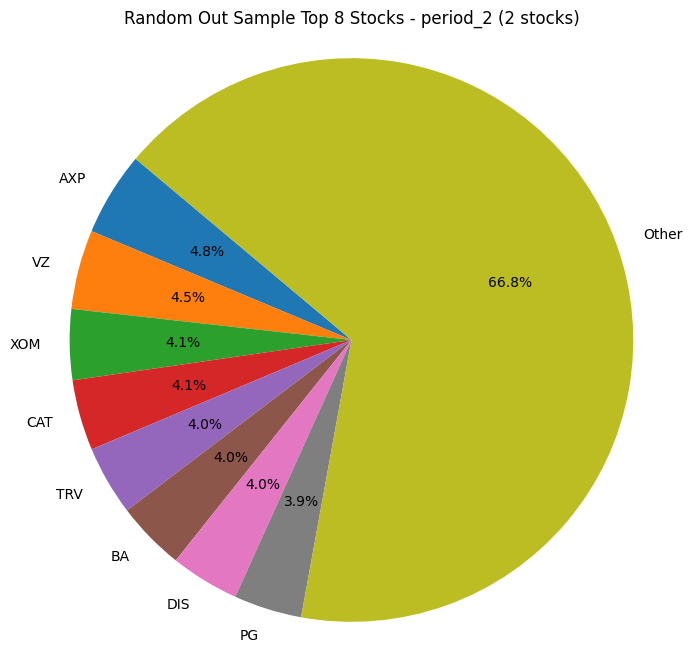

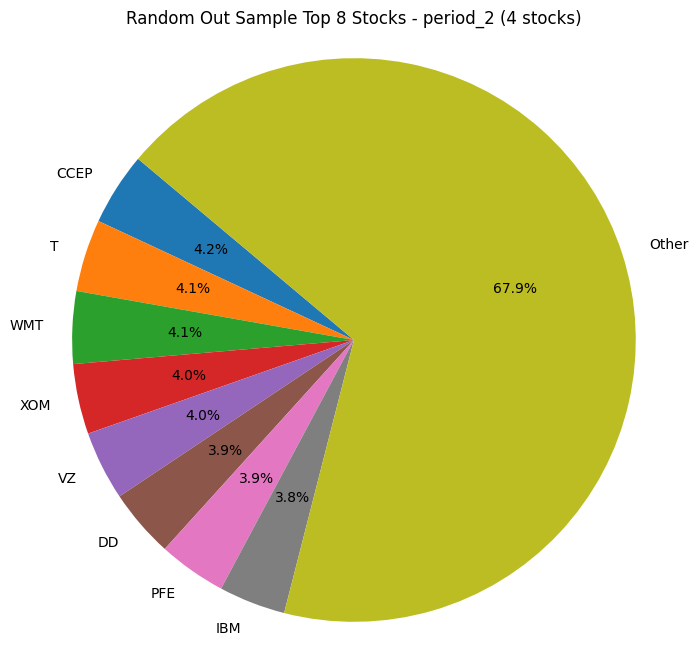

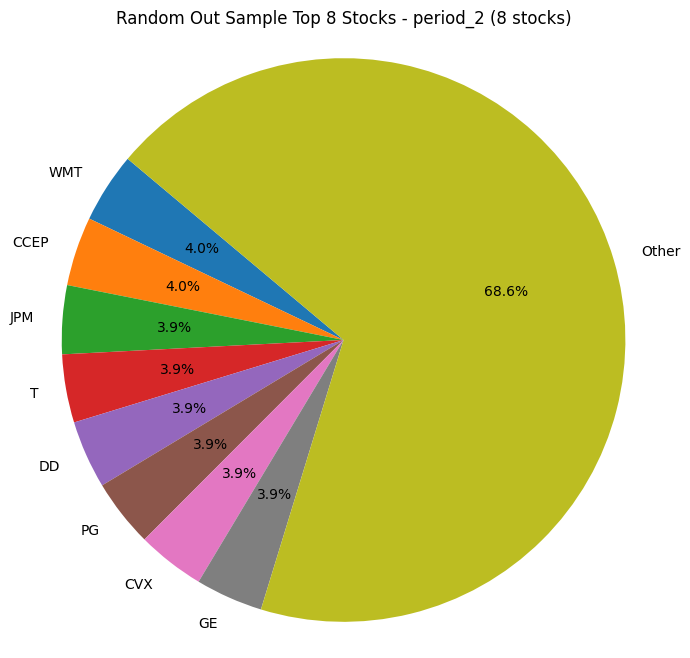

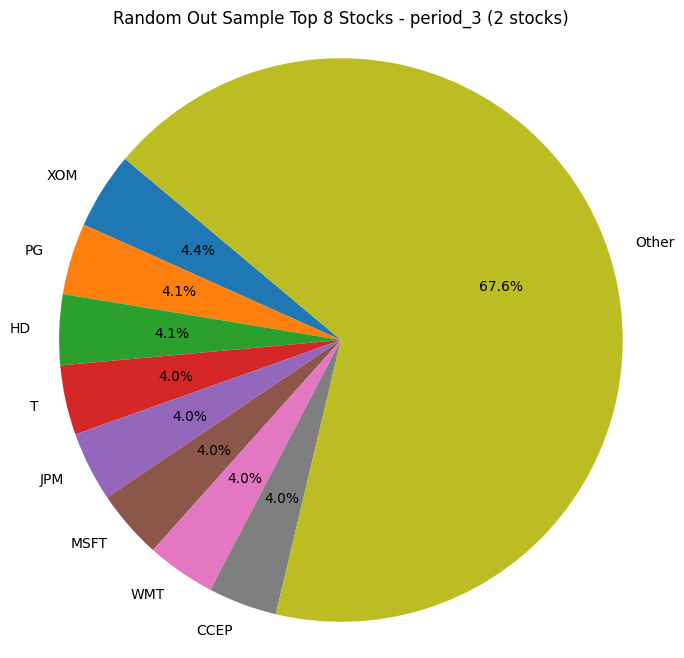

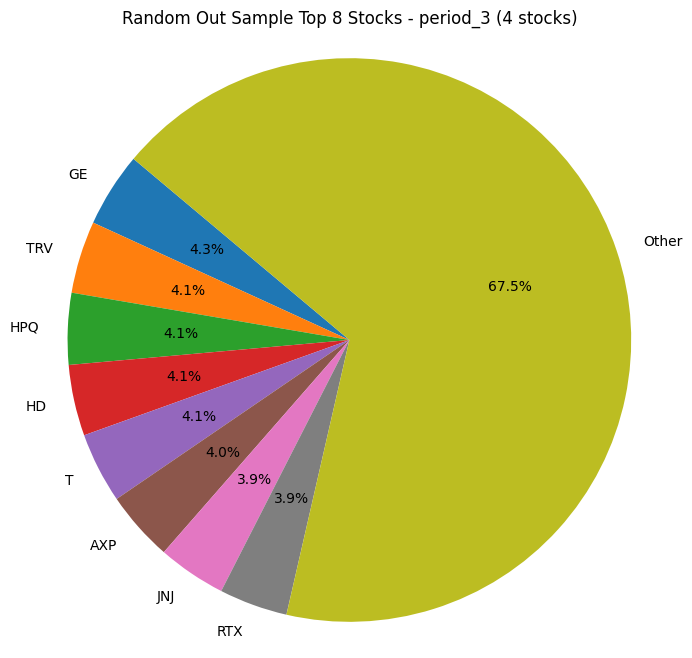

...

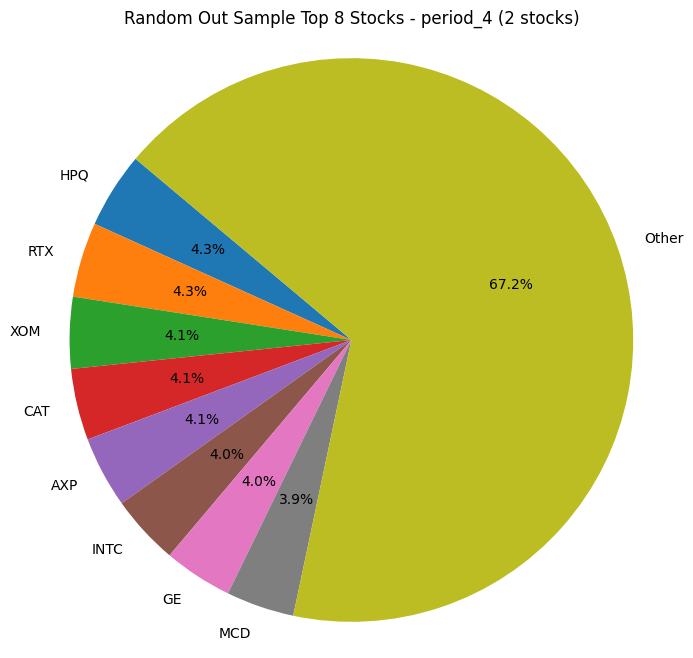

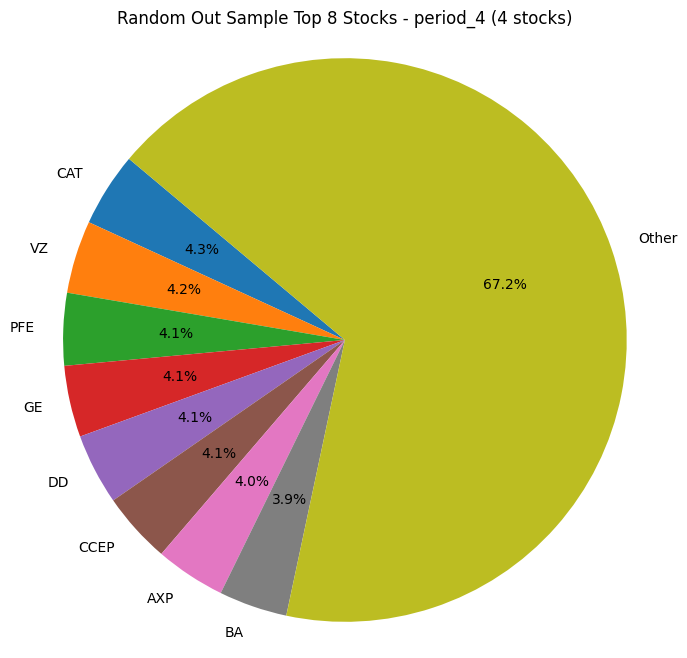

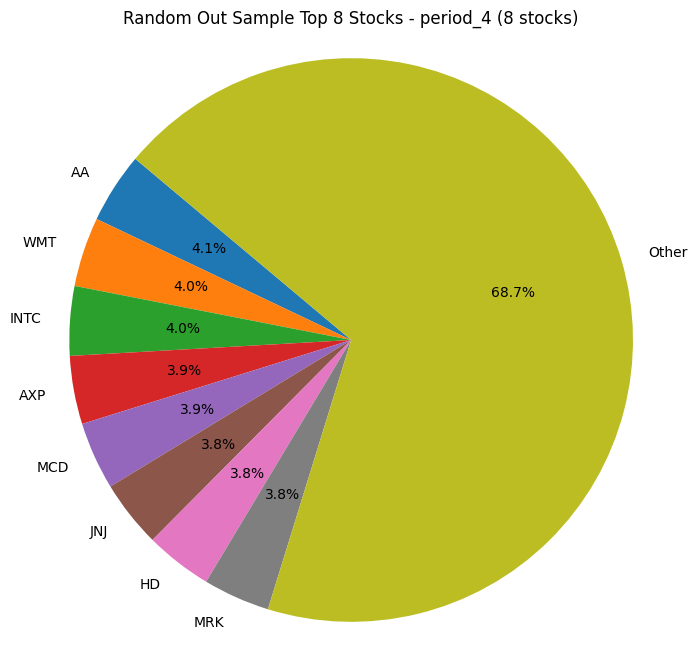

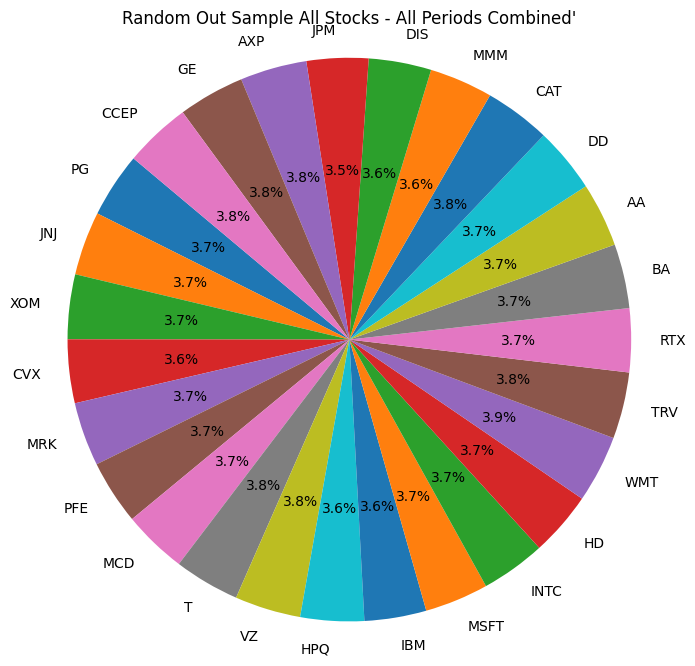

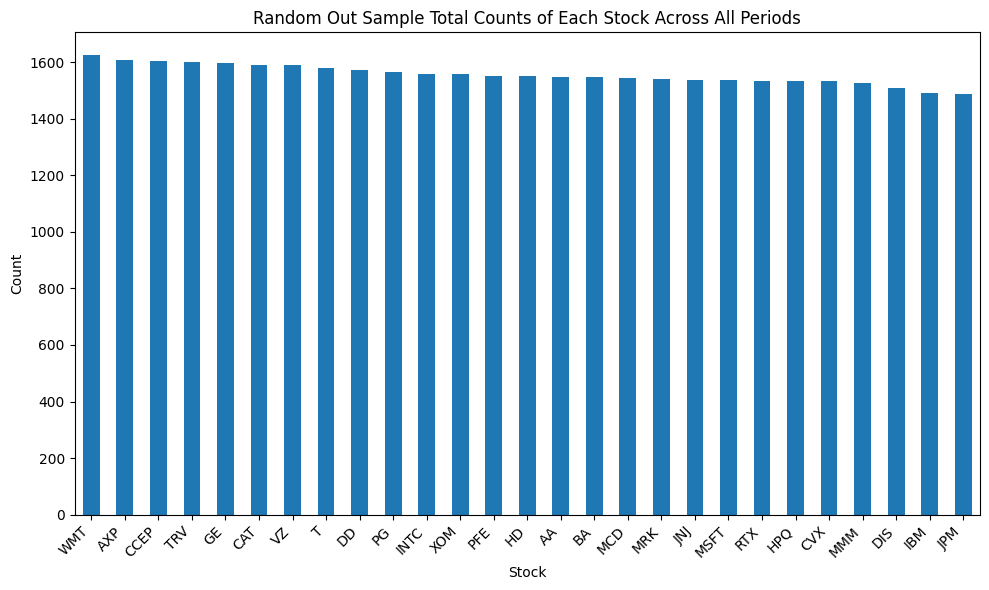

In [81]:
count_of_stocks(result_df_random_test1, custom_tickers, "Random Out Sample")

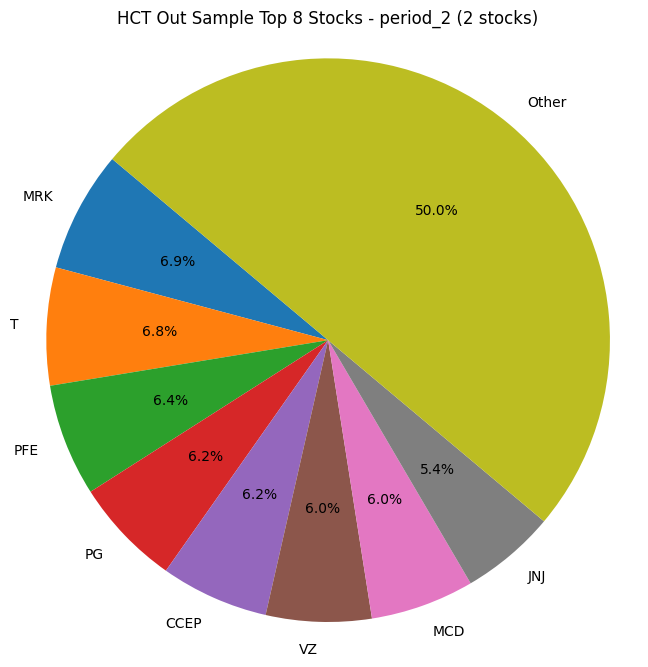

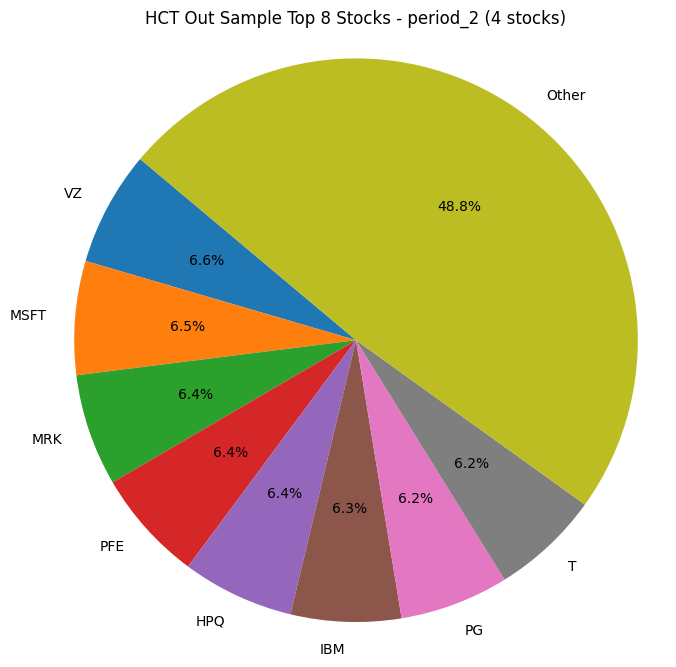

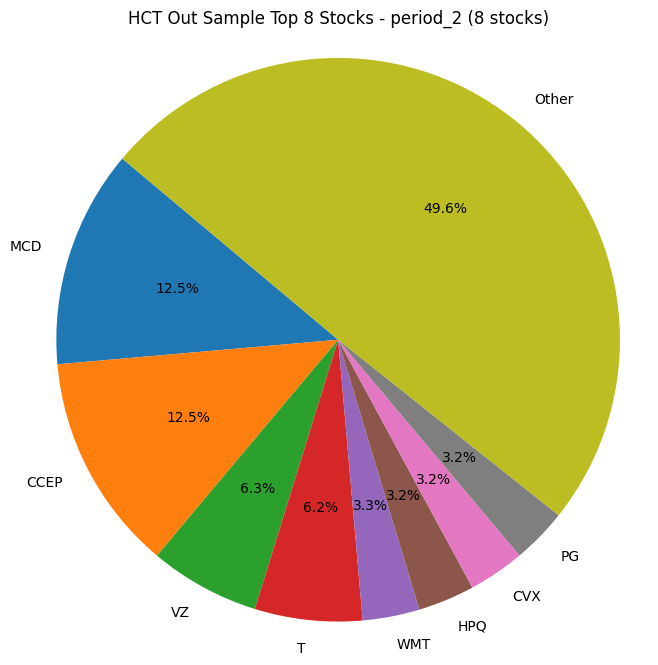

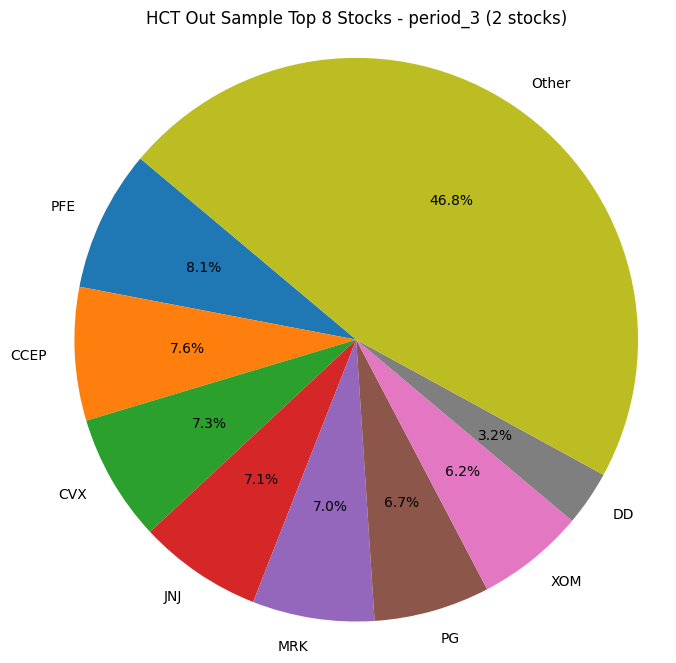

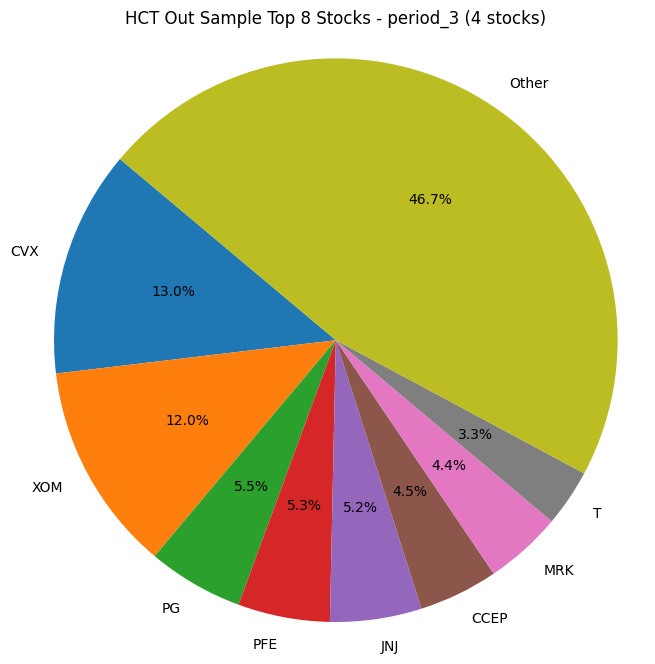

...

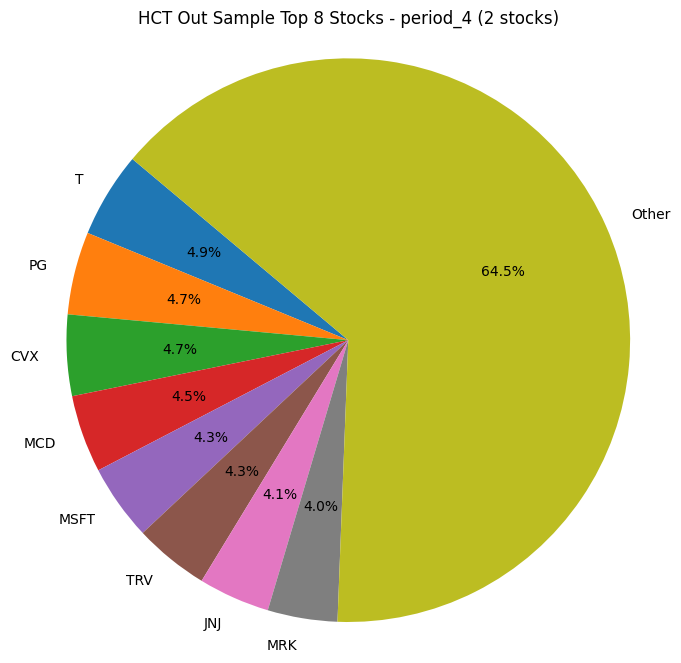

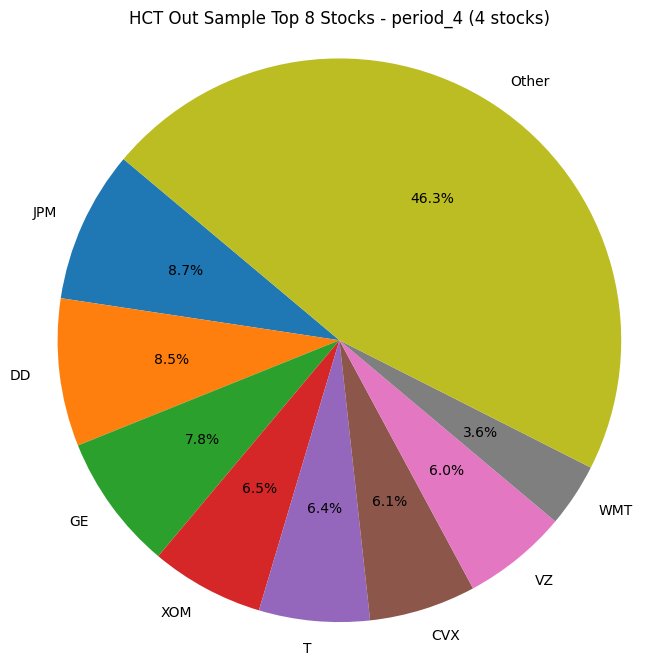

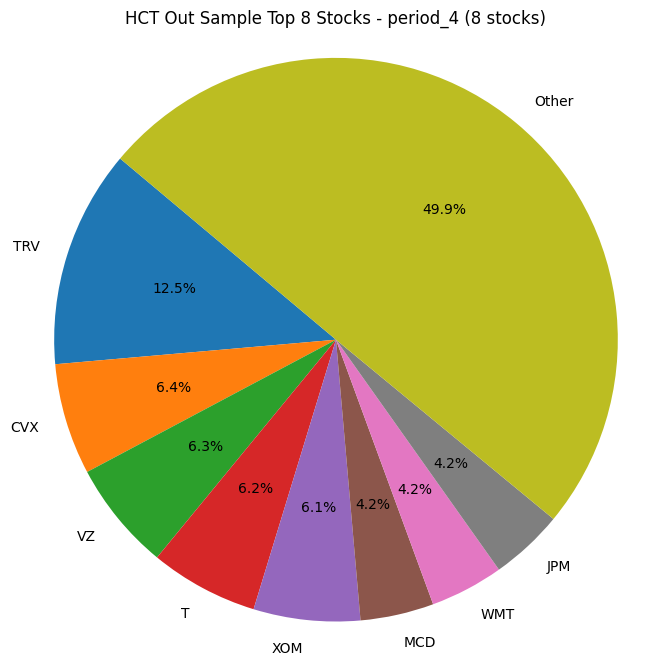

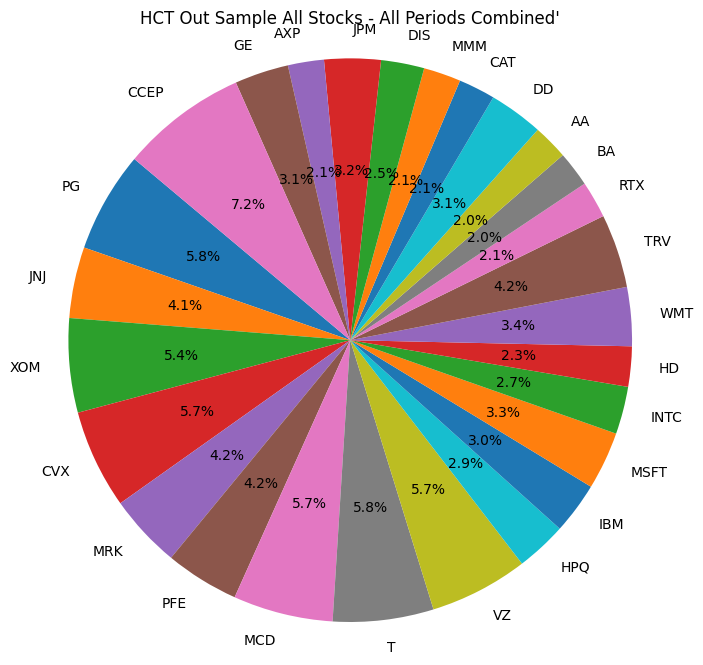

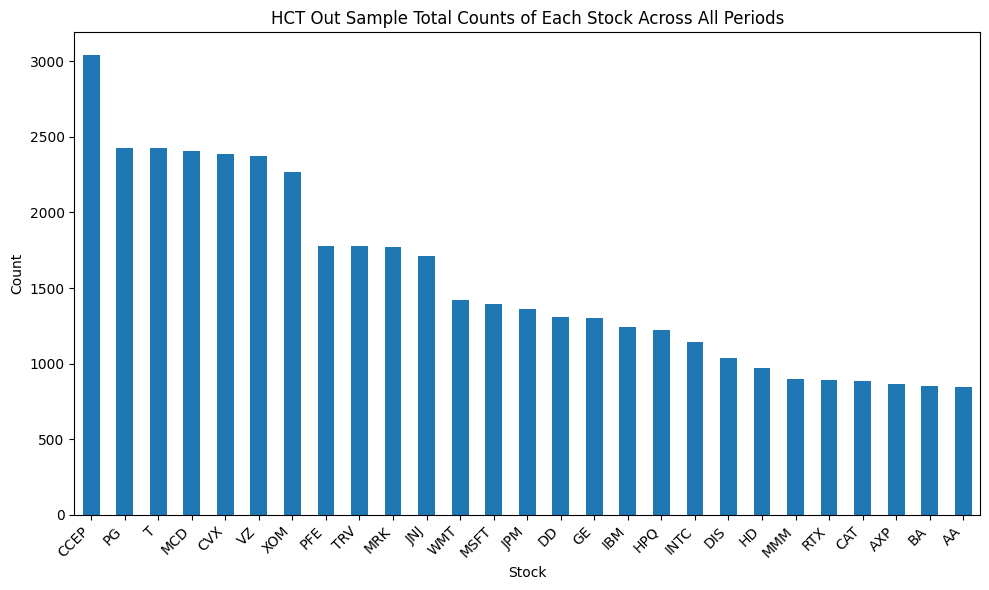

In [82]:
count_of_stocks(result_df_HCT_test1, custom_tickers, "HCT Out Sample")

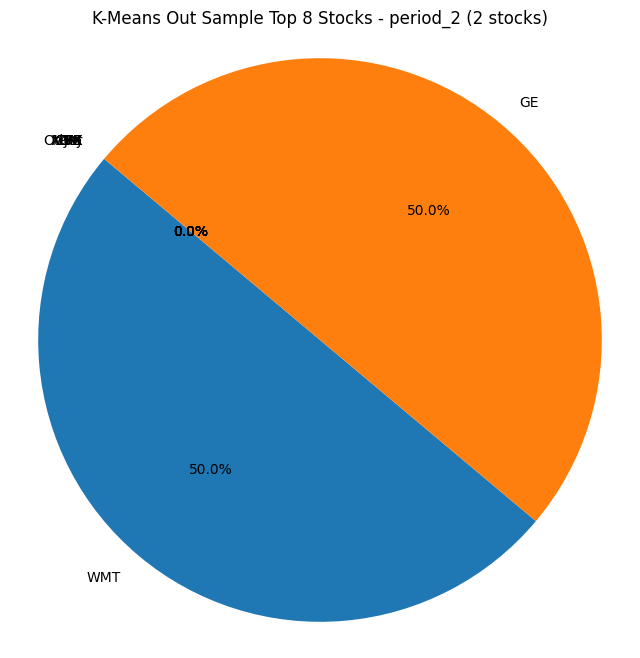

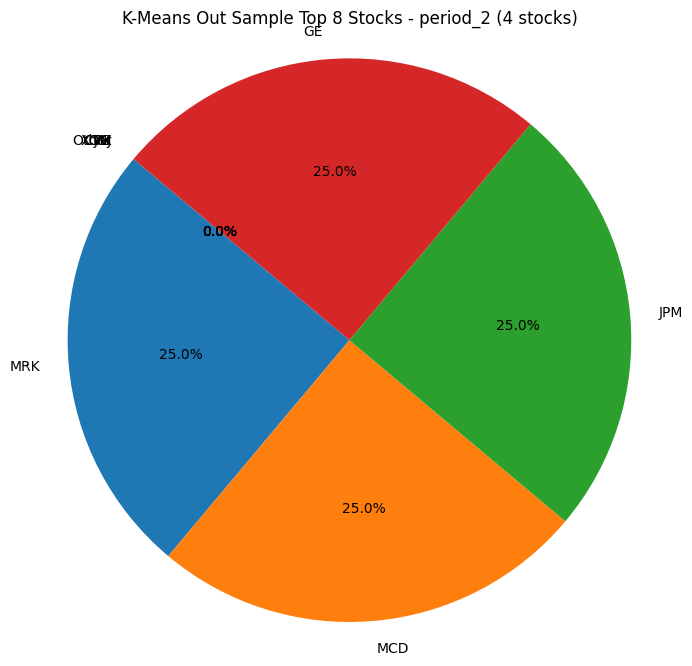

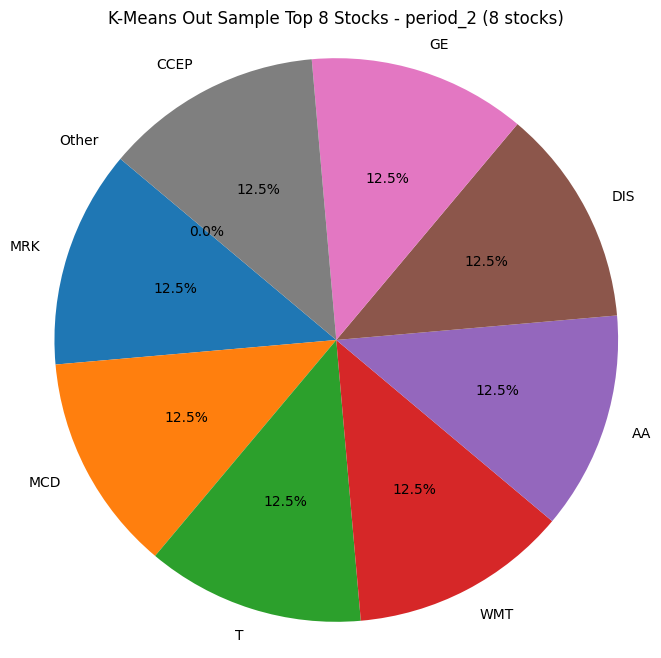

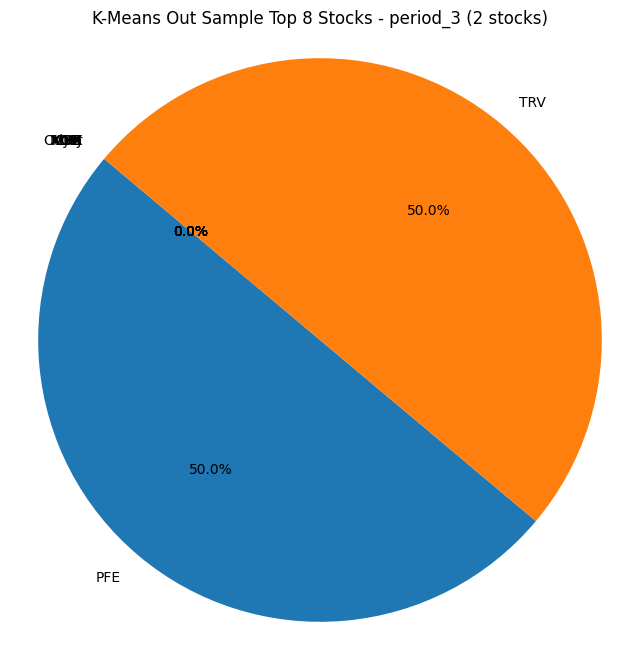

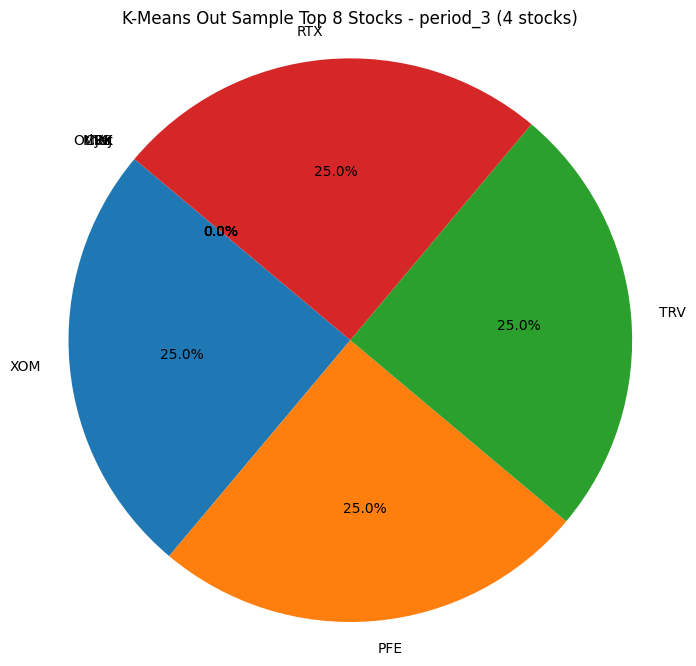

...

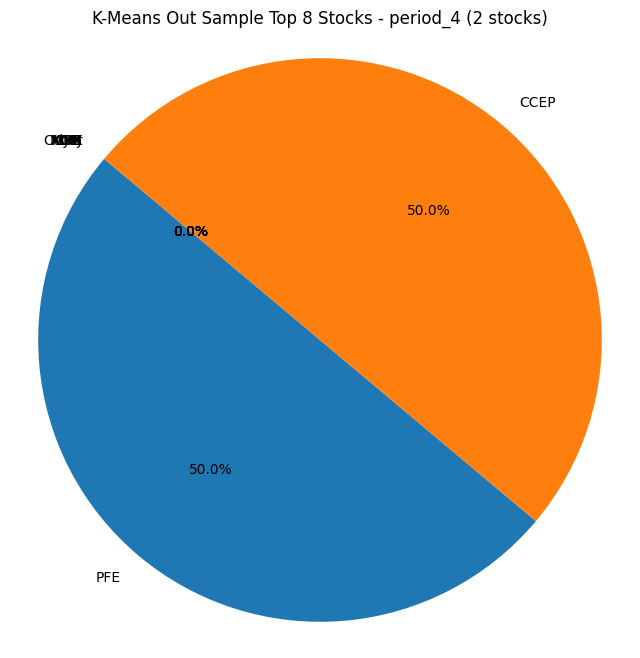

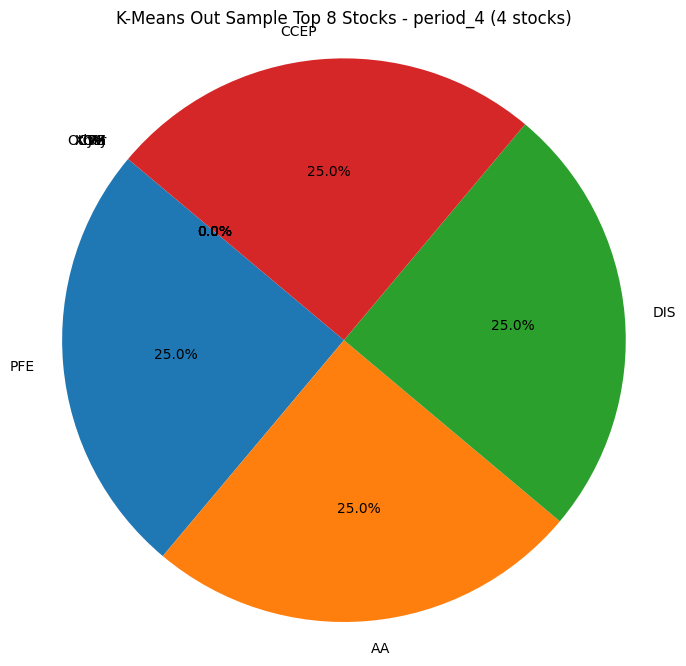

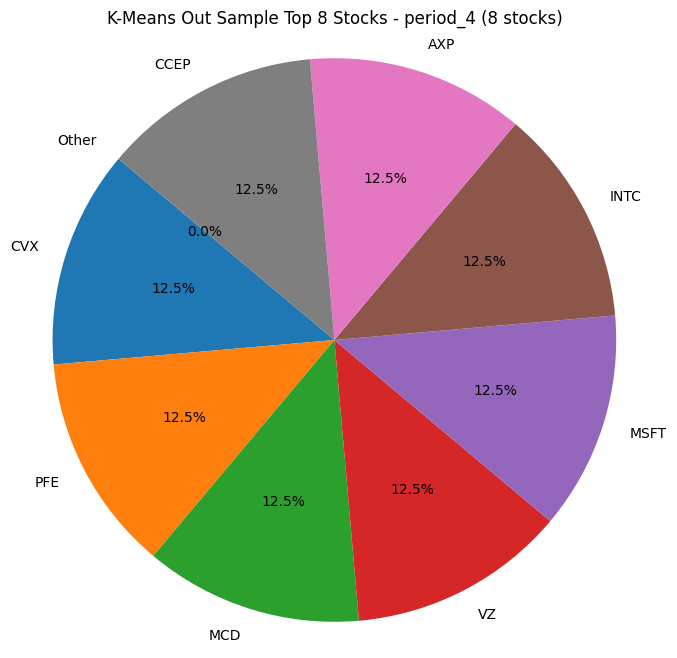

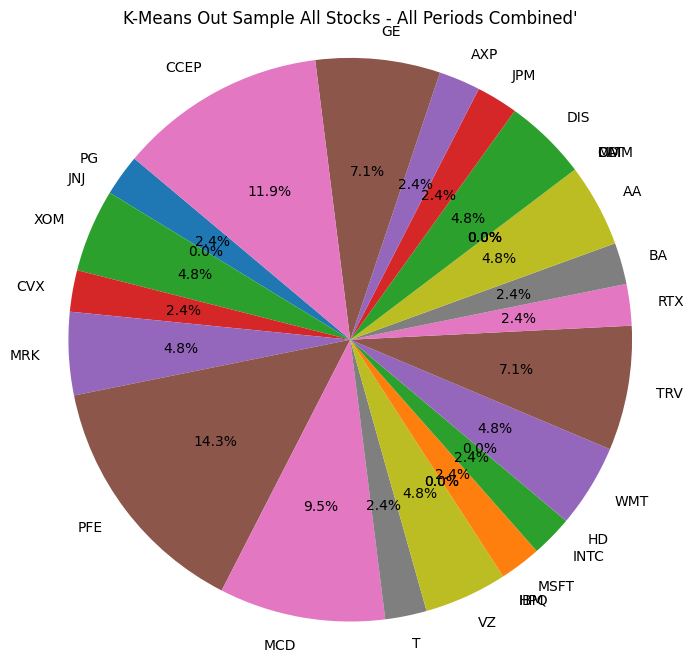

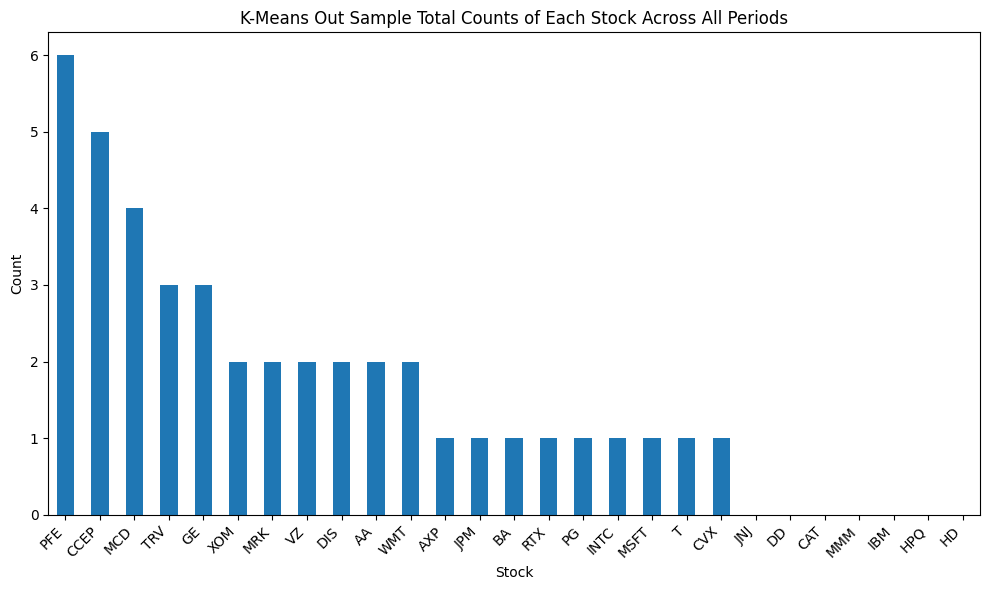

In [83]:
count_of_stocks(result_df_kmeans_test1, custom_tickers, "K-Means Out Sample")

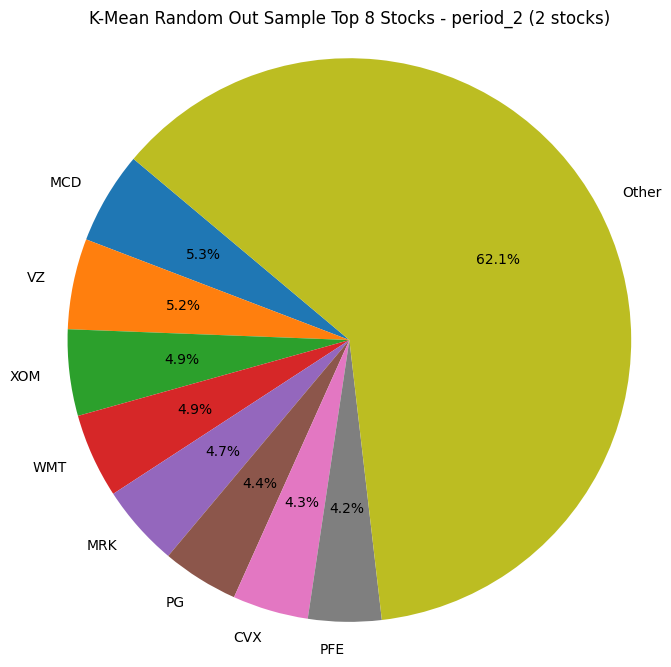

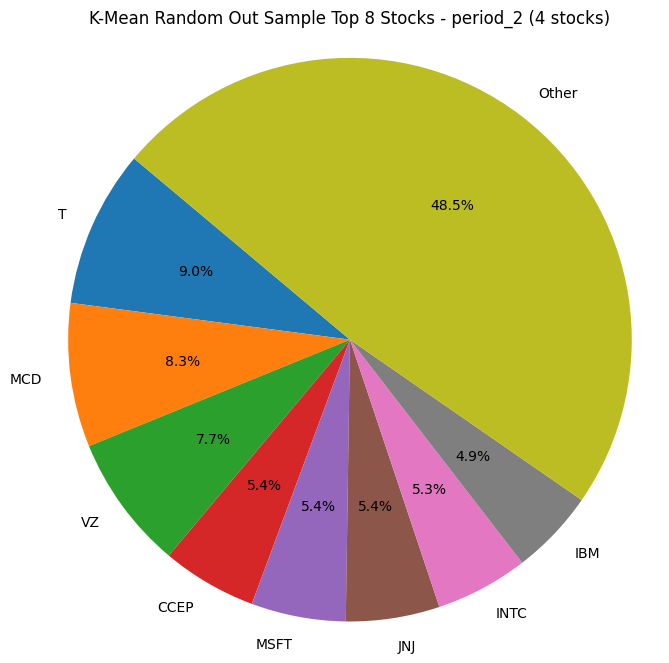

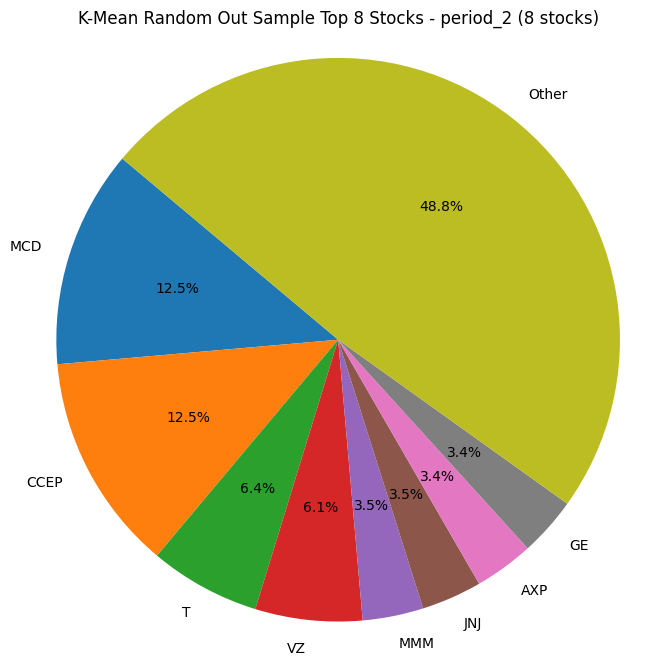

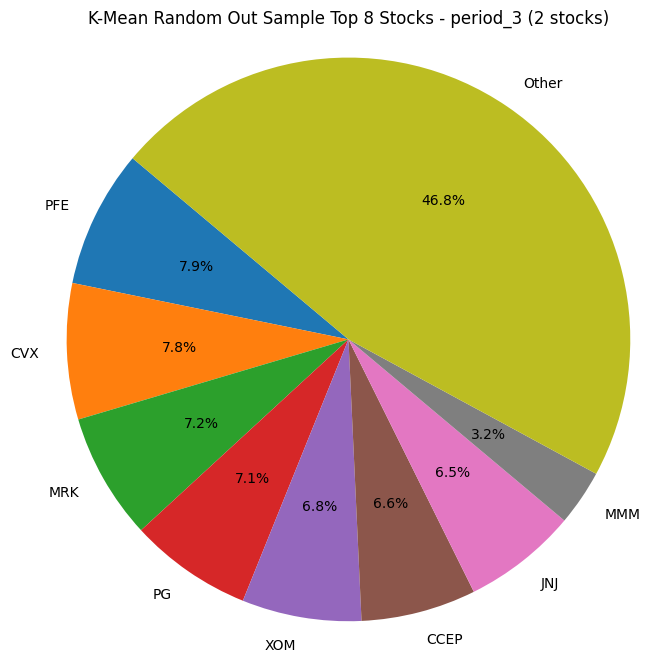

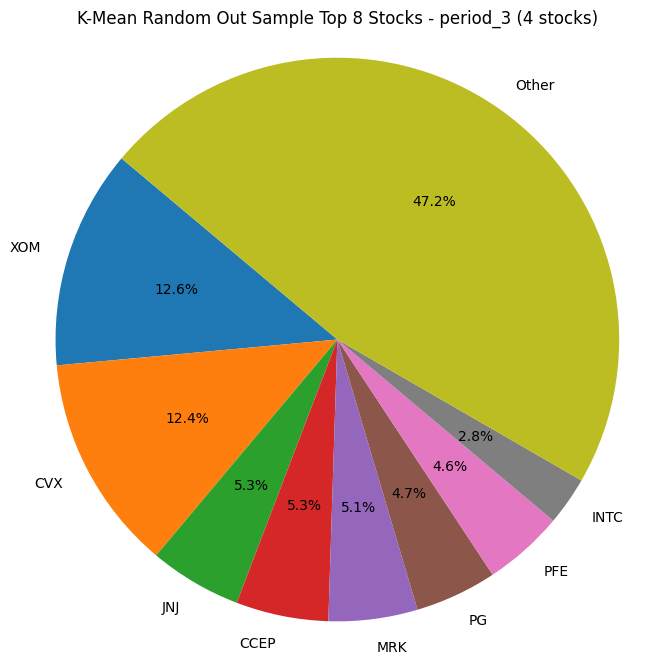

...

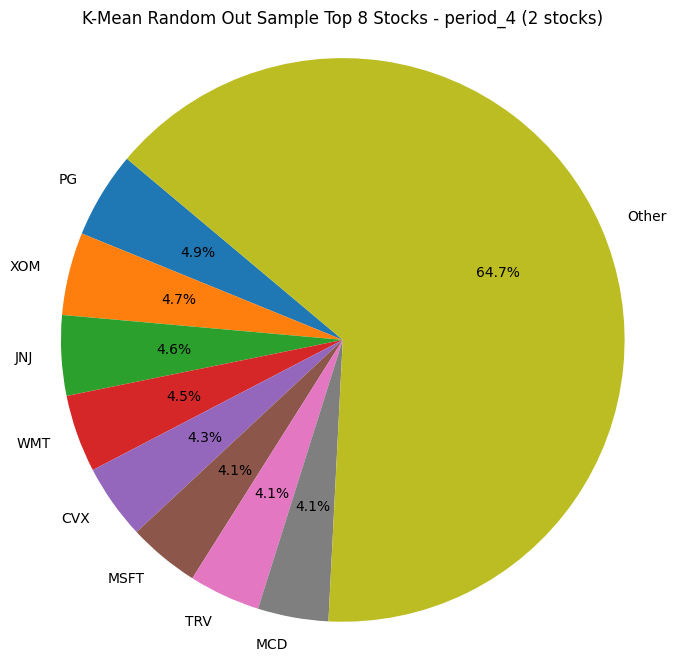

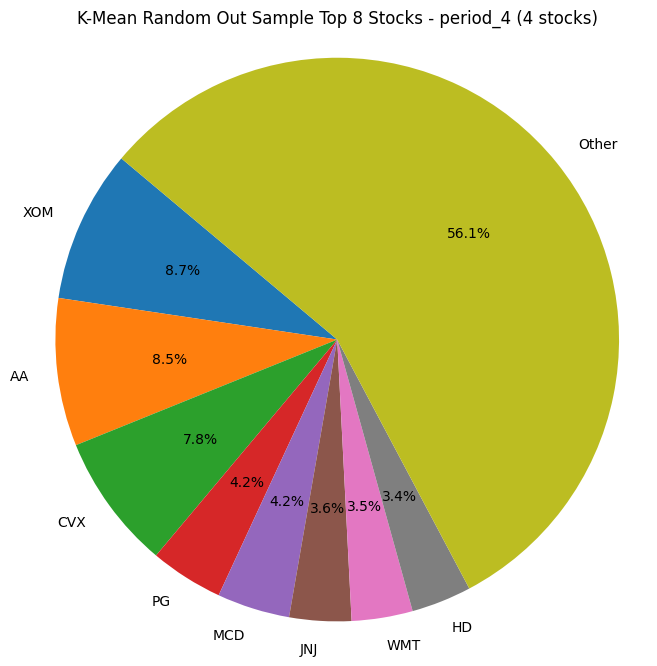

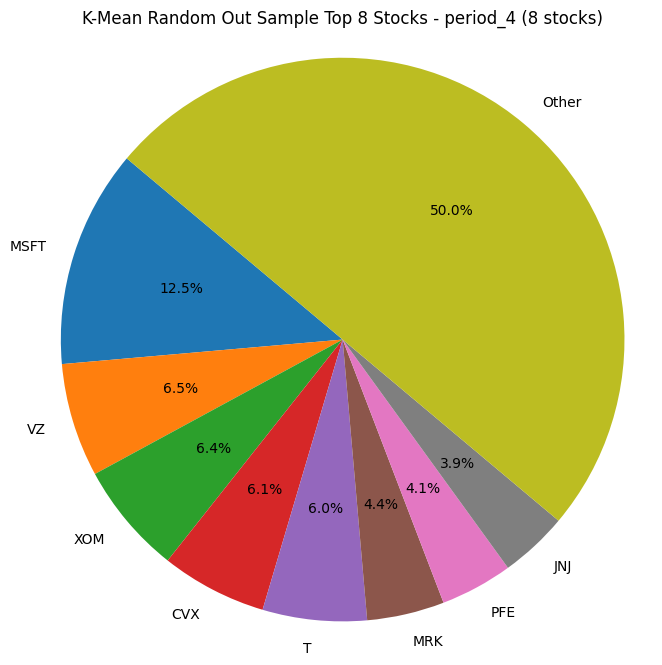

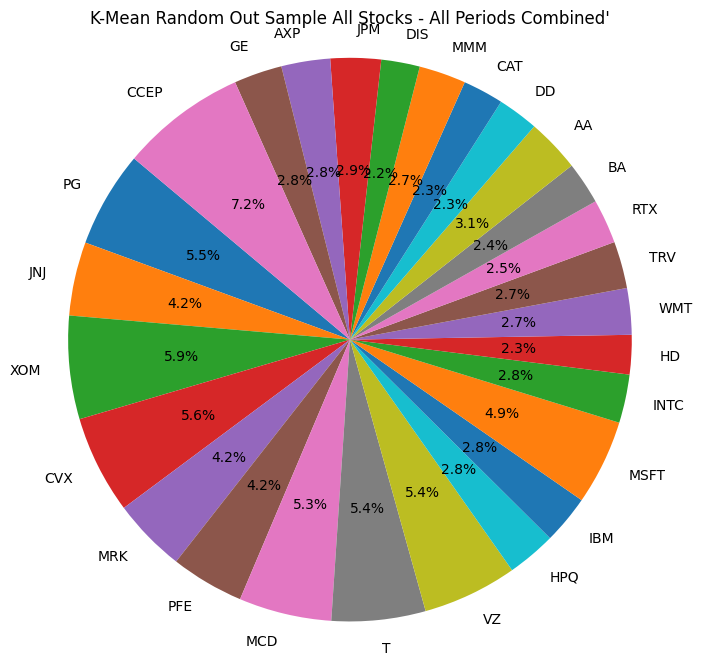

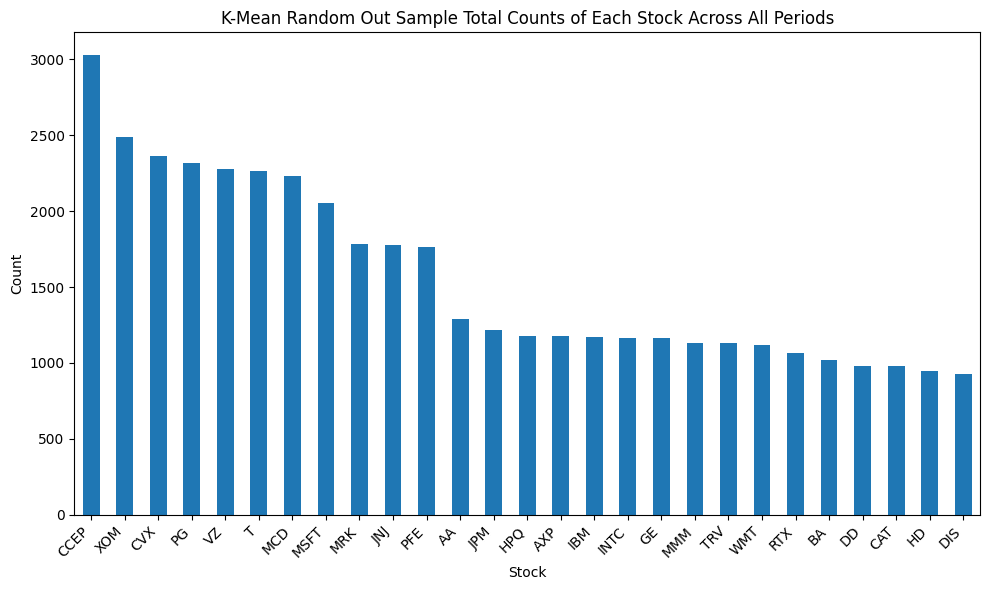

In [84]:
count_of_stocks(result_df_kmeans_rand_test1, custom_tickers, "K-Mean Random Out Sample")

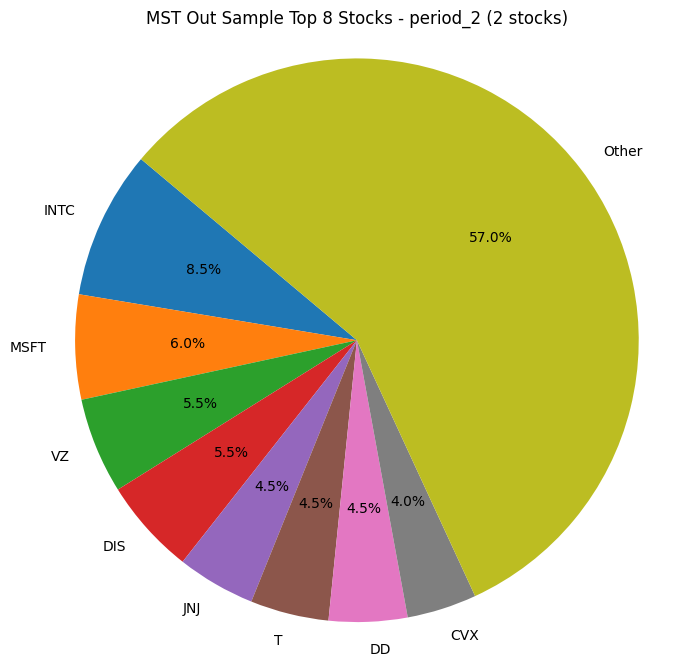

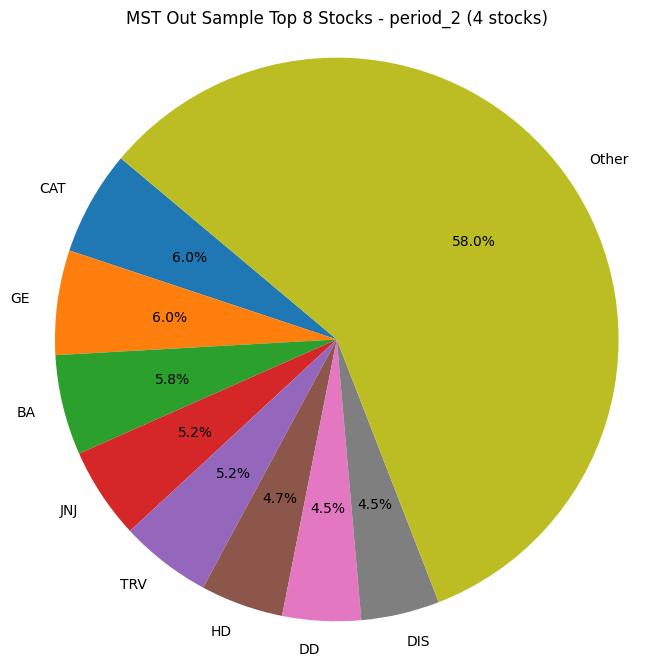

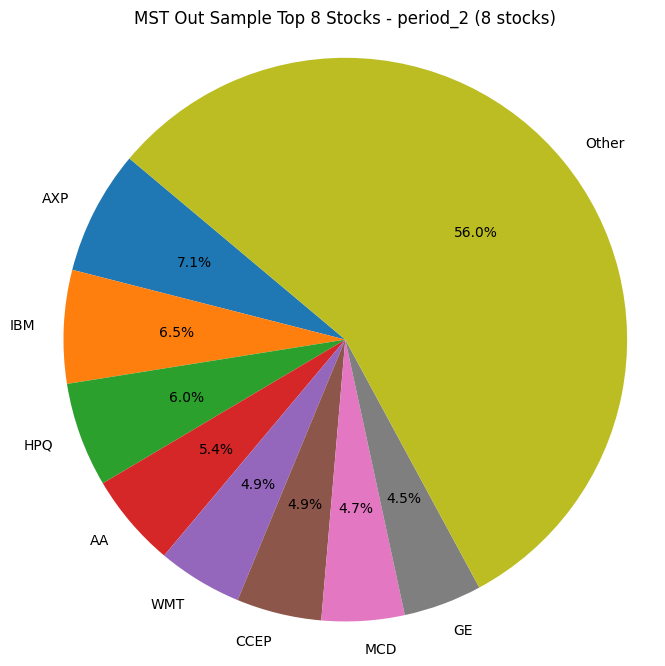

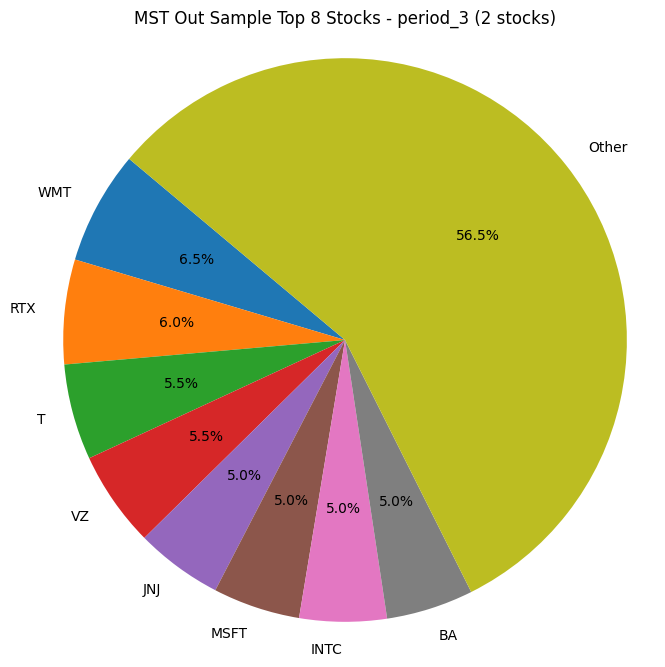

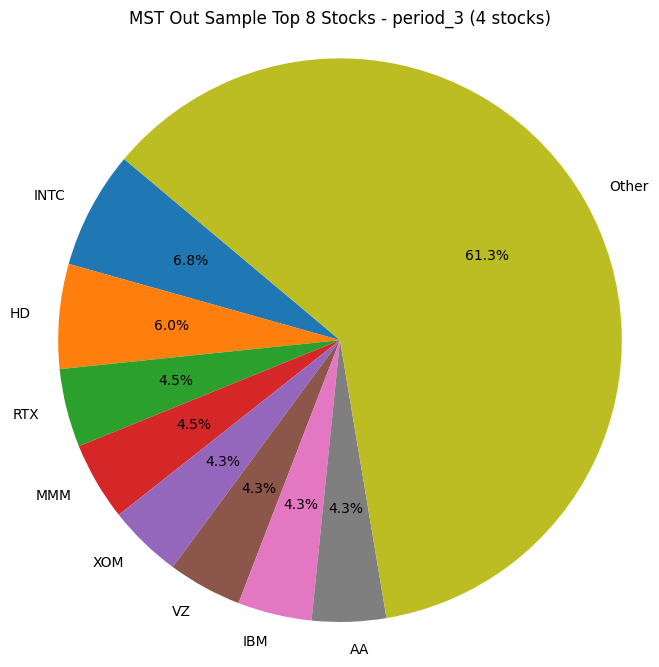

...

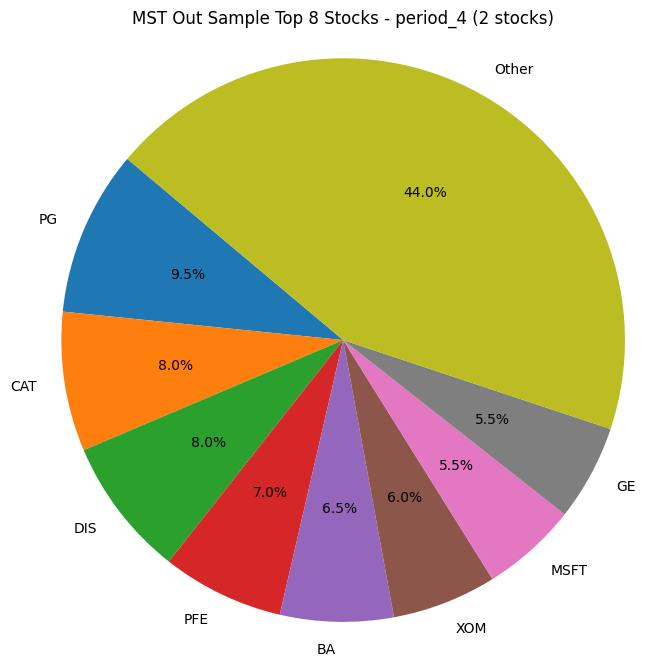

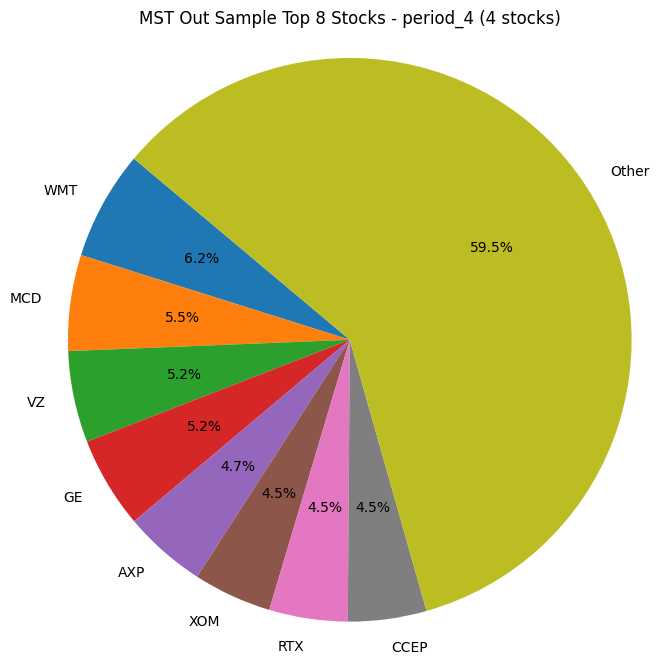

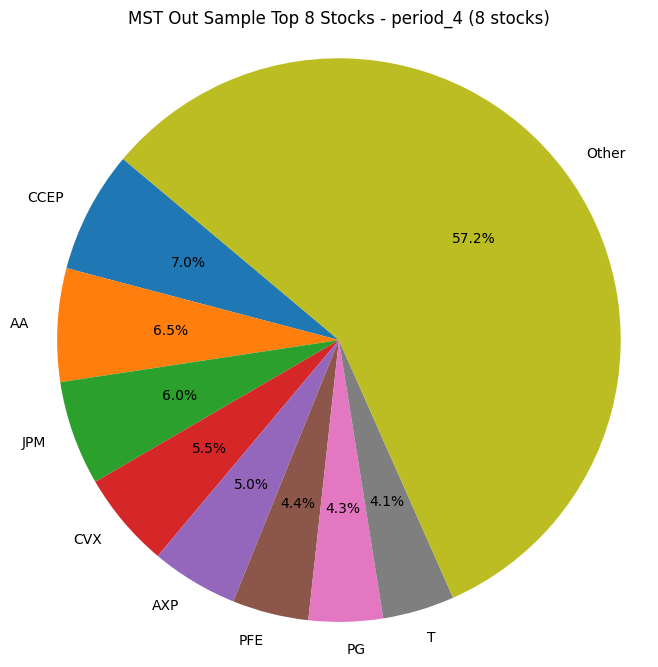

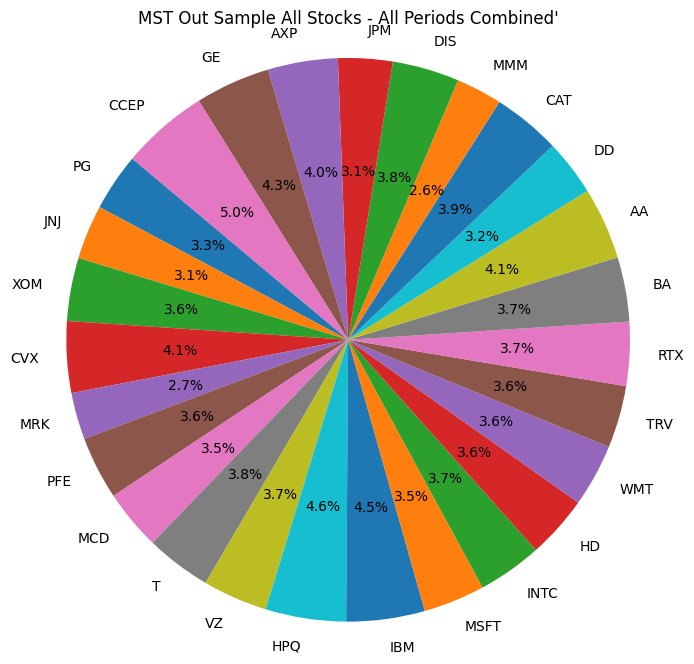

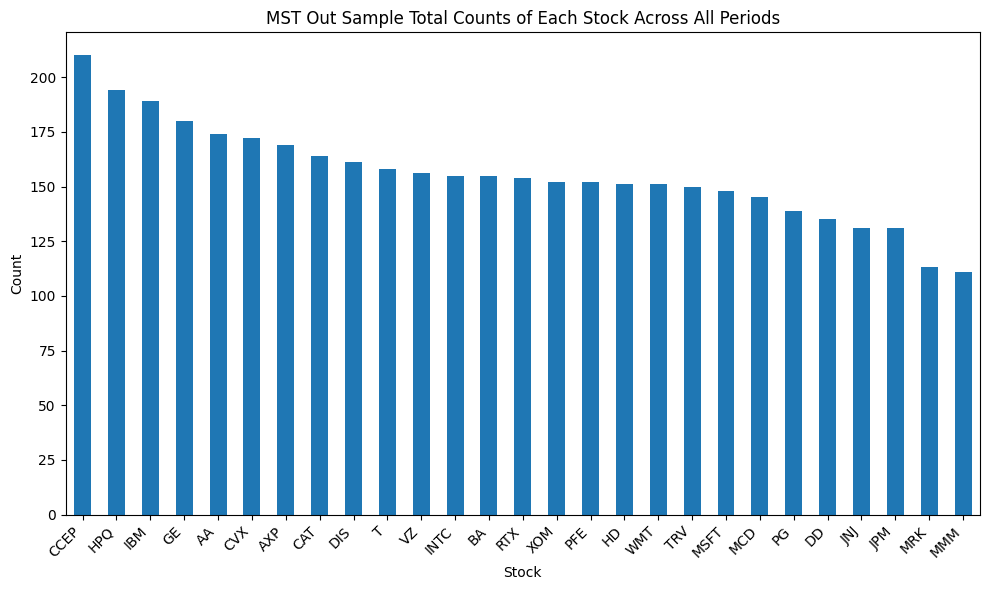

In [85]:
count_of_stocks(mst_result_df_clusters_out_sample, custom_tickers, "MST Out Sample")

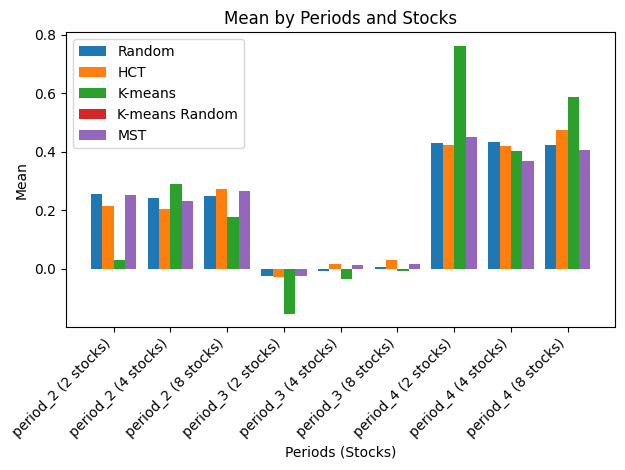

Total Average Mean of Random Values: 0.2233545114536802
Total Average Mean of Cluster Values: 0.22573503584067856
Total Average Mean of K-means Values: 0.22800385147268265
Total Average Mean of K-means Random Values: 0.22022435393079076
Total Average Mean of MST Values: 0.2300562244672264

Period 1 Average Mean of Random Values: 0.24982693741645448
Period 1 Average Mean of Cluster Values: 0.23067991436431243
Period 1 Average Mean of K-means Values: 0.16532378396144742
Period 1 Average Mean of K-means Random Values: 0.2507294849995752
Period 1 Average Mean of MST: 0.24886462092820846
Period 2 Average Mean of Random Values: -0.009084440149589744
Period 2 Average Mean of Cluster Values: 0.006591428213811259
Period 2 Average Mean of K-means Values: -0.0650653396436881
Period 2 Average Mean of K-means Random Values: 0.002221684433297089
Period 2 Average Mean of MST: -0.0040001262906516335
Period 3 Average Mean of Random Values: 0.42932103709417585
Period 3 Average Mean of Cluster Values: 0.

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


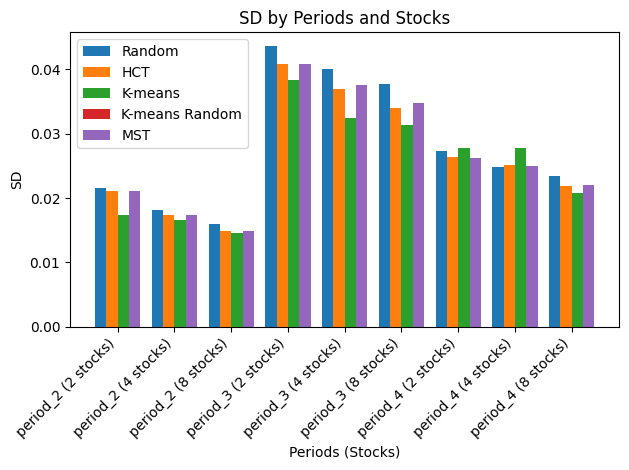

Total Average SD of Random Values: 0.02807143210547418
Total Average SD of Cluster Values: 0.02651136259952561
Total Average SD of K-means Values: 0.025224707439869147
Total Average SD of K-means Random Values: 0.02660702977297514
Total Average SD of MST Values: 0.028103882544506884

Period 1 Average SD of Random Values: 0.018569737296196504
Period 1 Average SD of Cluster Values: 0.017790501938098818
Period 1 Average SD of K-means Values: 0.016198909181368036
Period 1 Average SD of K-means Random Values: 0.01775311752995812
Period 1 Average SD of MST: 0.018854387820803502
Period 2 Average SD of Random Values: 0.040441161910883025
Period 2 Average SD of Cluster Values: 0.03724828590845702
Period 2 Average SD of K-means Values: 0.034039939133305865
Period 2 Average SD of K-means Random Values: 0.03766647679899915
Period 2 Average SD of MST: 0.0400457637871555
Period 3 Average SD of Random Values: 0.025203397109343006
Period 3 Average SD of Cluster Values: 0.02449529995202099
Period 3 Ave

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


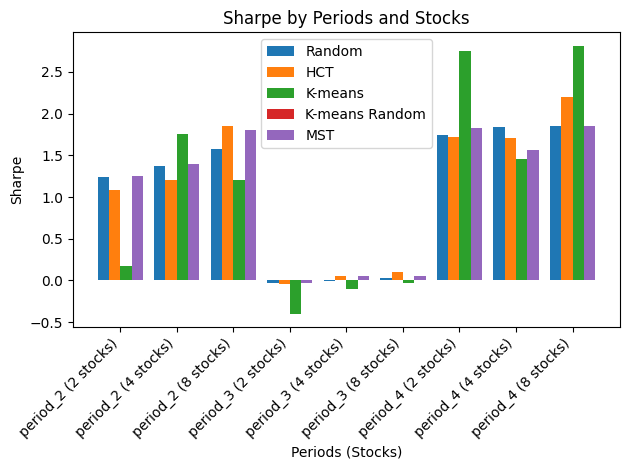

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Total Average Sharpe of Random Values: 1.0698376466748412
Total Average Sharpe of Cluster Values: 1.0978859168057846
Total Average Sharpe of K-means Values: 1.0681513604168233
Total Average Sharpe of K-means Random Values: 1.084186260323972
Total Average Sharpe of MST Values: 1.0792887037181509

Period 1 Average Sharpe of Random Values: 1.3965070827332988
Period 1 Average Sharpe of Cluster Values: 1.383771586353994
Period 1 Average Sharpe of K-means Values: 1.0423346026527145
Period 1 Average Sharpe of K-means Random Values: 1.4852731127876682
Period 1 Average Sharpe of MST: 1.3996424290498115
Period 2 Average Sharpe of Random Values: -0.0029058553362868423
Period 2 Average Sharpe of Cluster Values: 0.03507773212932033
Period 2 Average Sharpe of K-means Values: -0.17667986295777074
Period 2 Average Sharpe of K-means Random Values: 0.022903746815558484
Period 2 Average Sharpe of MST: 0.005895869777720816
Period 3 Average Sharpe of Random Values: 1.8159117126275115
Period 3 Average Sharp

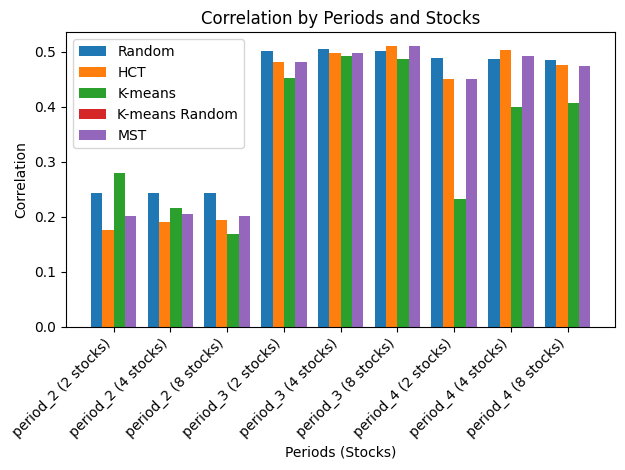

Total Average Correlation of Random Values: 0.4108410884382724
Total Average Correlation of Cluster Values: 0.38688303420637277
Total Average Correlation of K-means Values: 0.3483809724385927
Total Average Correlation of K-means Random Values: 0.3906829282785048
Total Average Correlation of MST Values: 0.416209090934674

Period 1 Average Correlation of Random Values: 0.24340760287150118
Period 1 Average Correlation of Cluster Values: 0.18726084168294177
Period 1 Average Correlation of K-means Values: 0.221610592272795
Period 1 Average Correlation of K-means Random Values: 0.20349583095889912
Period 1 Average Correlation of MST: 0.24985277740687828
Period 2 Average Correlation of Random Values: 0.5023276799878592
Period 2 Average Correlation of Cluster Values: 0.49645148769447917
Period 2 Average Correlation of K-means Values: 0.47690964933927976
Period 2 Average Correlation of K-means Random Values: 0.49638909226268163
Period 2 Average Correlation of MST: 0.5095141193630518
Period 3 Av

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [86]:
# Plotting Mean
plot_metric('Mean',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting SD
plot_metric('SD',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

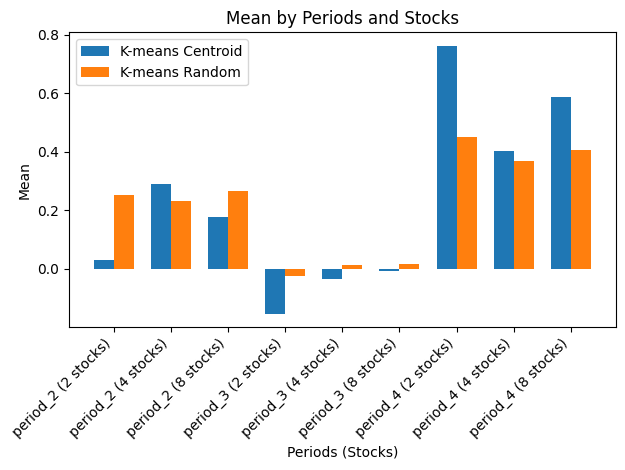

Total Average Mean of K-means Centroid Values: 0.22800385147268265
Total Average Mean of K-means Random Values: 0.22022435393079076

Period 1 Average Mean of K-means Centroid Values: 0.16532378396144742
Period 1 Average Mean of K-means Random Values: 0.2507294849995752
Period 2 Average Mean of K-means Centroid Values: -0.0650653396436881
Period 2 Average Mean of K-means Random Values: 0.002221684433297089
Period 3 Average Mean of K-means Centroid Values: 0.5837531101002885
Period 3 Average Mean of K-means Random Values: 0.4077218923595


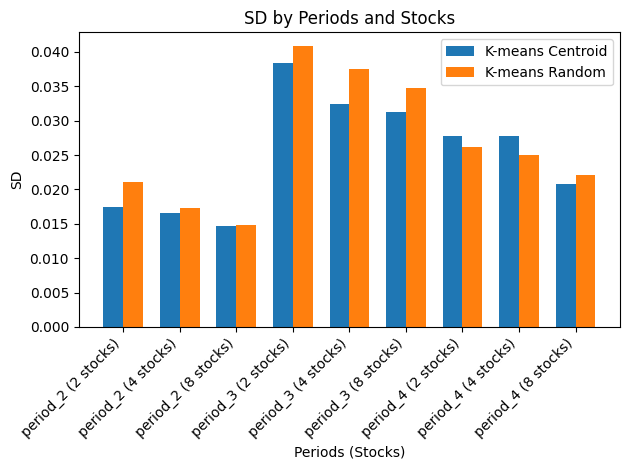

Total Average SD of K-means Centroid Values: 0.025224707439869147
Total Average SD of K-means Random Values: 0.02660702977297514

Period 1 Average SD of K-means Centroid Values: 0.016198909181368036
Period 1 Average SD of K-means Random Values: 0.01775311752995812
Period 2 Average SD of K-means Centroid Values: 0.034039939133305865
Period 2 Average SD of K-means Random Values: 0.03766647679899915
Period 3 Average SD of K-means Centroid Values: 0.025435274004933534
Period 3 Average SD of K-means Random Values: 0.02440149498996814


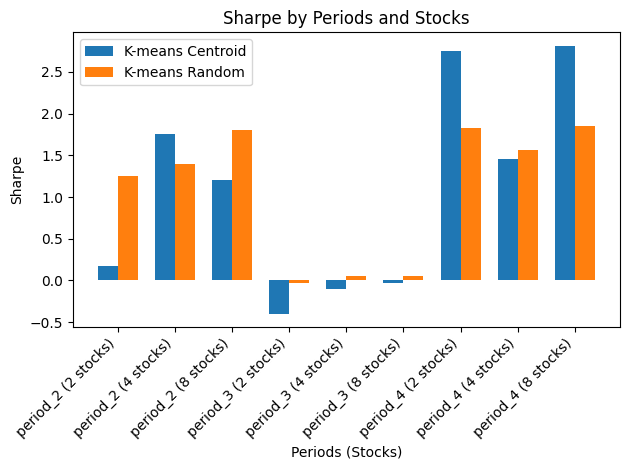

Total Average Sharpe of K-means Centroid Values: 1.0681513604168233
Total Average Sharpe of K-means Random Values: 1.084186260323972

Period 1 Average Sharpe of K-means Centroid Values: 1.0423346026527145
Period 1 Average Sharpe of K-means Random Values: 1.4852731127876682
Period 2 Average Sharpe of K-means Centroid Values: -0.17667986295777074
Period 2 Average Sharpe of K-means Random Values: 0.022903746815558484
Period 3 Average Sharpe of K-means Centroid Values: 2.3387993415555264
Period 3 Average Sharpe of K-means Random Values: 1.7443819213686895


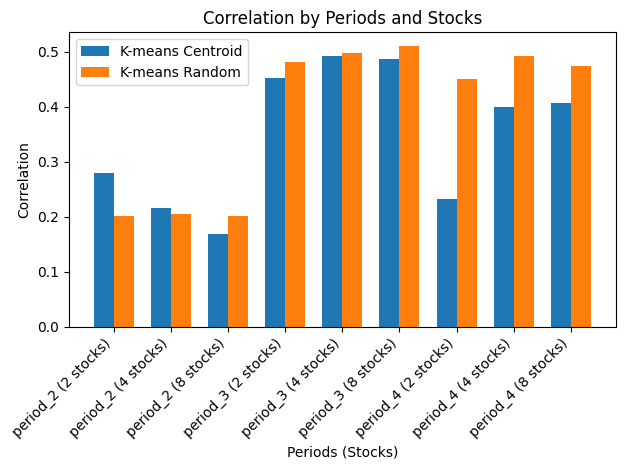

Total Average Correlation of K-means Centroid Values: 0.3483809724385927
Total Average Correlation of K-means Random Values: 0.3906829282785048

Period 1 Average Correlation of K-means Centroid Values: 0.221610592272795
Period 1 Average Correlation of K-means Random Values: 0.20349583095889912
Period 2 Average Correlation of K-means Centroid Values: 0.47690964933927976
Period 2 Average Correlation of K-means Random Values: 0.49638909226268163
Period 3 Average Correlation of K-means Centroid Values: 0.34662267570370336
Period 3 Average Correlation of K-means Random Values: 0.47216386161393364


In [87]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test1,result_df_kmeans_rand_test1)